In [1]:
 ### Prepare module structure ###

import sys
sys.path.append("../")

In [2]:
### IMPORT ###

import numpy as np
import math
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim

import time
from tqdm import tqdm_notebook

import matplotlib.pyplot as plt
%matplotlib inline

from util import *
from data import *
import models

import pickle

# auto reload imports on local changes
%load_ext autoreload
%autoreload 2
print(torch.__version__)

1.0.0


In [3]:
### Check device ###

USE_GPU = True

dtype = torch.float32

if USE_GPU and torch.cuda.is_available():
    # TODO: Change to CPU used!
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

print('using device:', device)

using device: cuda:0


In [4]:
### LOAD DATA ###

from torch.utils.data.sampler import SubsetRandomSampler

dataset = 'mnist'

dataloader, imsize = load(dataset, path='/home/shared/phase-retrieval/data/' + dataset, batch_size=32)

In [5]:
def calc_mags(x):
    ft =  torch.rfft(x, 2, onesided=False)
    mags = torch.sqrt(torch.sum(ft ** 2, -1) + 1e-16)
    return mags

# Function to compute test images
def test_generator(model, device, testloader):
    # put model to eval mode
    model = model.to(device=device)
    model.eval()

    # move test images to device and reduce to magnitude information in fourier space
    test_images = []
    outputs = []
    
    for data in testloader:
        z = torch.randn(*data.shape).to(device)
        data = data.to(device=device)
        magn = calc_mags(data)
        net_input = torch.cat([z, magn], dim=1)
        ouput = model(net_input)

        test_images.append(data.cpu().numpy())
        outputs.append(ouput.cpu().detach().numpy())
    
    return np.concatenate(outputs), np.concatenate(test_images)

In [6]:
# Define Gen and Disc loss
def gen_loss(disc_gen, gen_output, x, lmd):
    reconstruction = torch.mean(torch.abs(x - gen_output))
    adversarial = -torch.mean(torch.log(disc_gen))
    return  adversarial + lmd * reconstruction

def disc_loss(disc_real, disc_gen):
    return -torch.mean((torch.log(disc_real) + torch.log(1 - disc_gen)) / 2.0)

In [7]:
def train_model(gen, disc, g_opt, d_opt, device, loader_train, epochs=1):

    # move the model parameters to CPU/GPU
    disc = disc.to(device=device)
    gen = gen.to(device=device)
    
    for e in range(epochs):
        for t, x in enumerate(loader_train):
            # move x to device and reduce to magnitude information in fourier space
            x = x.to(device=device)
            magnitudes = calc_mags(x)
            
            # stack magnitudes to noise / generator input
            z = torch.randn(*x.shape).to(device)
            zm = torch.cat([z, magnitudes], dim=1)
            
            # calc gen output
            gen.train()
            gen_output = gen(zm)
            
            # calc disc output for real and generated image
            xm = torch.cat([x, magnitudes], dim=1)
            disc.train()
            disc_output_real = disc(xm)
            disc_output_generated = disc(torch.cat([gen_output, magnitudes], dim=1))
            
            # calculate generator loss and update generator
            g_loss = gen_loss(disc_output_generated, gen(zm), x, lmd)
            g_opt.zero_grad()
            g_loss.backward(retain_graph=True)
            #torch.nn.utils.clip_grad_value_(gen.parameters(), 1e-1)
            g_opt.step()
           
            # calculate discriminator loss and update discriminator
            d_loss = disc_loss(disc_output_real, disc_output_generated)
            d_opt.zero_grad()
            d_loss.backward()
            #torch.nn.utils.clip_grad_value_(disc.parameters(), 1e-1)
            d_opt.step()

            if t % 100 == 0:
                print("epoch: {:2} \t step:{} \t loss: {:3.4}".format(e+1, t, g_loss.item()))
            
    return g_loss.item()

### Batches

50 epochs but minimum of 1000 batches (max 100.000)

In [8]:
### TRAIN MODEL ###

import time

num_epochs = 100
lmd = 1e2
train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
epochs = [1000, 500, 300, 150, 75, 50, 50, 50, 50, 50, 50]
gen_sizes = [512, 1024, 2048]
disc_sizes = [16, 32, 64]

for ts, ep in zip(train_sizes, epochs):
    for gs, ds in zip(gen_sizes, disc_sizes):
        print("Start training with ts of", ts, "and gs of", gs)
        
        # new dataloader
        dataloader['train'] = torch.utils.data.DataLoader(dataloader['train'].dataset, batch_size=32, num_workers=1,
                                                          sampler=SubsetRandomSampler(np.arange(ts)))
        
        # Create new models
        gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=gs)
        disc = models.ConvDiscriminatorSmall(imsize=(2, 28, 28), s=ds)
        
        # Set training parameters
        g_opt = optim.Adam(gen.parameters(), lr=1e-4)
        d_opt = optim.Adam(disc.parameters(), lr=1e-4)
        
        # Train model
        train_model(gen, disc, g_opt, d_opt, device, dataloader['train'], epochs=ep)
        
        # Save model
        gen_weights = gen.state_dict().copy()
        disc_weights = disc.state_dict().copy()
        torch.save(gen_weights, "../cache/cGAN/FCGenerator{}MNIST_{}.sd".format(gs, ts))
        torch.save(disc_weights, "../cache/cGAN/ConvDiscriminator{}MNIST_{}.sd".format(ds, ts))

Start training with ts of 32 and gs of 512
Version 0.4
epoch:  1 	 step:0 	 loss: 48.04
epoch:  2 	 step:0 	 loss: 47.8
epoch:  3 	 step:0 	 loss: 47.5
epoch:  4 	 step:0 	 loss: 47.24
epoch:  5 	 step:0 	 loss: 46.97
epoch:  6 	 step:0 	 loss: 46.71
epoch:  7 	 step:0 	 loss: 46.43
epoch:  8 	 step:0 	 loss: 46.18
epoch:  9 	 step:0 	 loss: 45.92
epoch: 10 	 step:0 	 loss: 45.68
epoch: 11 	 step:0 	 loss: 45.45
epoch: 12 	 step:0 	 loss: 45.19
epoch: 13 	 step:0 	 loss: 44.96
epoch: 14 	 step:0 	 loss: 44.72
epoch: 15 	 step:0 	 loss: 44.48
epoch: 16 	 step:0 	 loss: 44.25
epoch: 17 	 step:0 	 loss: 44.02
epoch: 18 	 step:0 	 loss: 43.78
epoch: 19 	 step:0 	 loss: 43.54
epoch: 20 	 step:0 	 loss: 43.29
epoch: 21 	 step:0 	 loss: 43.06
epoch: 22 	 step:0 	 loss: 42.82
epoch: 23 	 step:0 	 loss: 42.57
epoch: 24 	 step:0 	 loss: 42.33
epoch: 25 	 step:0 	 loss: 42.09
epoch: 26 	 step:0 	 loss: 41.84
epoch: 27 	 step:0 	 loss: 41.61
epoch: 28 	 step:0 	 loss: 41.38
epoch: 29 	 step:0 	 lo

epoch: 244 	 step:0 	 loss: 14.45
epoch: 245 	 step:0 	 loss: 14.38
epoch: 246 	 step:0 	 loss: 14.39
epoch: 247 	 step:0 	 loss: 14.26
epoch: 248 	 step:0 	 loss: 14.34
epoch: 249 	 step:0 	 loss: 14.14
epoch: 250 	 step:0 	 loss: 14.26
epoch: 251 	 step:0 	 loss: 14.09
epoch: 252 	 step:0 	 loss: 14.13
epoch: 253 	 step:0 	 loss: 14.07
epoch: 254 	 step:0 	 loss: 13.98
epoch: 255 	 step:0 	 loss: 14.05
epoch: 256 	 step:0 	 loss: 13.85
epoch: 257 	 step:0 	 loss: 14.0
epoch: 258 	 step:0 	 loss: 13.79
epoch: 259 	 step:0 	 loss: 13.84
epoch: 260 	 step:0 	 loss: 13.81
epoch: 261 	 step:0 	 loss: 13.67
epoch: 262 	 step:0 	 loss: 13.78
epoch: 263 	 step:0 	 loss: 13.6
epoch: 264 	 step:0 	 loss: 13.64
epoch: 265 	 step:0 	 loss: 13.62
epoch: 266 	 step:0 	 loss: 13.49
epoch: 267 	 step:0 	 loss: 13.59
epoch: 268 	 step:0 	 loss: 13.42
epoch: 269 	 step:0 	 loss: 13.47
epoch: 270 	 step:0 	 loss: 13.42
epoch: 271 	 step:0 	 loss: 13.33
epoch: 272 	 step:0 	 loss: 13.39
epoch: 273 	 ste

epoch: 486 	 step:0 	 loss: 8.749
epoch: 487 	 step:0 	 loss: 8.68
epoch: 488 	 step:0 	 loss: 8.529
epoch: 489 	 step:0 	 loss: 8.801
epoch: 490 	 step:0 	 loss: 8.41
epoch: 491 	 step:0 	 loss: 8.776
epoch: 492 	 step:0 	 loss: 8.432
epoch: 493 	 step:0 	 loss: 8.636
epoch: 494 	 step:0 	 loss: 8.543
epoch: 495 	 step:0 	 loss: 8.469
epoch: 496 	 step:0 	 loss: 8.621
epoch: 497 	 step:0 	 loss: 8.35
epoch: 498 	 step:0 	 loss: 8.659
epoch: 499 	 step:0 	 loss: 8.291
epoch: 500 	 step:0 	 loss: 8.629
epoch: 501 	 step:0 	 loss: 8.312
epoch: 502 	 step:0 	 loss: 8.506
epoch: 503 	 step:0 	 loss: 8.401
epoch: 504 	 step:0 	 loss: 8.344
epoch: 505 	 step:0 	 loss: 8.495
epoch: 506 	 step:0 	 loss: 8.194
epoch: 507 	 step:0 	 loss: 8.58
epoch: 508 	 step:0 	 loss: 8.082
epoch: 509 	 step:0 	 loss: 8.596
epoch: 510 	 step:0 	 loss: 8.073
epoch: 511 	 step:0 	 loss: 8.458
epoch: 512 	 step:0 	 loss: 8.207
epoch: 513 	 step:0 	 loss: 8.247
epoch: 514 	 step:0 	 loss: 8.356
epoch: 515 	 step:

epoch: 728 	 step:0 	 loss: 5.846
epoch: 729 	 step:0 	 loss: 5.733
epoch: 730 	 step:0 	 loss: 6.008
epoch: 731 	 step:0 	 loss: 5.623
epoch: 732 	 step:0 	 loss: 6.023
epoch: 733 	 step:0 	 loss: 5.648
epoch: 734 	 step:0 	 loss: 5.898
epoch: 735 	 step:0 	 loss: 5.761
epoch: 736 	 step:0 	 loss: 5.748
epoch: 737 	 step:0 	 loss: 5.862
epoch: 738 	 step:0 	 loss: 5.634
epoch: 739 	 step:0 	 loss: 5.921
epoch: 740 	 step:0 	 loss: 5.559
epoch: 741 	 step:0 	 loss: 5.954
epoch: 742 	 step:0 	 loss: 5.505
epoch: 743 	 step:0 	 loss: 5.952
epoch: 744 	 step:0 	 loss: 5.503
epoch: 745 	 step:0 	 loss: 5.892
epoch: 746 	 step:0 	 loss: 5.556
epoch: 747 	 step:0 	 loss: 5.776
epoch: 748 	 step:0 	 loss: 5.655
epoch: 749 	 step:0 	 loss: 5.643
epoch: 750 	 step:0 	 loss: 5.746
epoch: 751 	 step:0 	 loss: 5.523
epoch: 752 	 step:0 	 loss: 5.84
epoch: 753 	 step:0 	 loss: 5.383
epoch: 754 	 step:0 	 loss: 5.976
epoch: 755 	 step:0 	 loss: 5.242
epoch: 756 	 step:0 	 loss: 6.05
epoch: 757 	 ste

epoch: 970 	 step:0 	 loss: 4.115
epoch: 971 	 step:0 	 loss: 4.352
epoch: 972 	 step:0 	 loss: 3.987
epoch: 973 	 step:0 	 loss: 4.421
epoch: 974 	 step:0 	 loss: 3.942
epoch: 975 	 step:0 	 loss: 4.403
epoch: 976 	 step:0 	 loss: 3.988
epoch: 977 	 step:0 	 loss: 4.303
epoch: 978 	 step:0 	 loss: 4.079
epoch: 979 	 step:0 	 loss: 4.17
epoch: 980 	 step:0 	 loss: 4.181
epoch: 981 	 step:0 	 loss: 4.06
epoch: 982 	 step:0 	 loss: 4.261
epoch: 983 	 step:0 	 loss: 3.96
epoch: 984 	 step:0 	 loss: 4.345
epoch: 985 	 step:0 	 loss: 3.864
epoch: 986 	 step:0 	 loss: 4.432
epoch: 987 	 step:0 	 loss: 3.783
epoch: 988 	 step:0 	 loss: 4.454
epoch: 989 	 step:0 	 loss: 3.809
epoch: 990 	 step:0 	 loss: 4.308
epoch: 991 	 step:0 	 loss: 3.989
epoch: 992 	 step:0 	 loss: 4.047
epoch: 993 	 step:0 	 loss: 4.217
epoch: 994 	 step:0 	 loss: 3.857
epoch: 995 	 step:0 	 loss: 4.337
epoch: 996 	 step:0 	 loss: 3.804
epoch: 997 	 step:0 	 loss: 4.29
epoch: 998 	 step:0 	 loss: 3.888
epoch: 999 	 step:

epoch: 213 	 step:0 	 loss: 9.761
epoch: 214 	 step:0 	 loss: 10.18
epoch: 215 	 step:0 	 loss: 9.675
epoch: 216 	 step:0 	 loss: 10.07
epoch: 217 	 step:0 	 loss: 9.726
epoch: 218 	 step:0 	 loss: 9.839
epoch: 219 	 step:0 	 loss: 9.833
epoch: 220 	 step:0 	 loss: 9.614
epoch: 221 	 step:0 	 loss: 9.919
epoch: 222 	 step:0 	 loss: 9.443
epoch: 223 	 step:0 	 loss: 9.932
epoch: 224 	 step:0 	 loss: 9.368
epoch: 225 	 step:0 	 loss: 9.784
epoch: 226 	 step:0 	 loss: 9.445
epoch: 227 	 step:0 	 loss: 9.521
epoch: 228 	 step:0 	 loss: 9.586
epoch: 229 	 step:0 	 loss: 9.284
epoch: 230 	 step:0 	 loss: 9.663
epoch: 231 	 step:0 	 loss: 9.113
epoch: 232 	 step:0 	 loss: 9.676
epoch: 233 	 step:0 	 loss: 9.033
epoch: 234 	 step:0 	 loss: 9.518
epoch: 235 	 step:0 	 loss: 9.146
epoch: 236 	 step:0 	 loss: 9.204
epoch: 237 	 step:0 	 loss: 9.327
epoch: 238 	 step:0 	 loss: 8.942
epoch: 239 	 step:0 	 loss: 9.427
epoch: 240 	 step:0 	 loss: 8.791
epoch: 241 	 step:0 	 loss: 9.375
epoch: 242 	 s

epoch: 455 	 step:0 	 loss: 5.113
epoch: 456 	 step:0 	 loss: 4.542
epoch: 457 	 step:0 	 loss: 4.793
epoch: 458 	 step:0 	 loss: 4.809
epoch: 459 	 step:0 	 loss: 4.503
epoch: 460 	 step:0 	 loss: 5.008
epoch: 461 	 step:0 	 loss: 4.344
epoch: 462 	 step:0 	 loss: 5.087
epoch: 463 	 step:0 	 loss: 4.288
epoch: 464 	 step:0 	 loss: 5.015
epoch: 465 	 step:0 	 loss: 4.369
epoch: 466 	 step:0 	 loss: 4.808
epoch: 467 	 step:0 	 loss: 4.533
epoch: 468 	 step:0 	 loss: 4.566
epoch: 469 	 step:0 	 loss: 4.717
epoch: 470 	 step:0 	 loss: 4.37
epoch: 471 	 step:0 	 loss: 4.879
epoch: 472 	 step:0 	 loss: 4.178
epoch: 473 	 step:0 	 loss: 5.077
epoch: 474 	 step:0 	 loss: 3.987
epoch: 475 	 step:0 	 loss: 5.195
epoch: 476 	 step:0 	 loss: 3.981
epoch: 477 	 step:0 	 loss: 4.883
epoch: 478 	 step:0 	 loss: 4.386
epoch: 479 	 step:0 	 loss: 4.28
epoch: 480 	 step:0 	 loss: 4.865
epoch: 481 	 step:0 	 loss: 4.015
epoch: 482 	 step:0 	 loss: 4.846
epoch: 483 	 step:0 	 loss: 4.218
epoch: 484 	 ste

epoch: 697 	 step:0 	 loss: 2.673
epoch: 698 	 step:0 	 loss: 3.059
epoch: 699 	 step:0 	 loss: 2.569
epoch: 700 	 step:0 	 loss: 3.169
epoch: 701 	 step:0 	 loss: 2.473
epoch: 702 	 step:0 	 loss: 3.253
epoch: 703 	 step:0 	 loss: 2.436
epoch: 704 	 step:0 	 loss: 3.214
epoch: 705 	 step:0 	 loss: 2.519
epoch: 706 	 step:0 	 loss: 2.997
epoch: 707 	 step:0 	 loss: 2.722
epoch: 708 	 step:0 	 loss: 2.737
epoch: 709 	 step:0 	 loss: 2.942
epoch: 710 	 step:0 	 loss: 2.557
epoch: 711 	 step:0 	 loss: 3.093
epoch: 712 	 step:0 	 loss: 2.467
epoch: 713 	 step:0 	 loss: 3.13
epoch: 714 	 step:0 	 loss: 2.489
epoch: 715 	 step:0 	 loss: 3.008
epoch: 716 	 step:0 	 loss: 2.616
epoch: 717 	 step:0 	 loss: 2.8
epoch: 718 	 step:0 	 loss: 2.793
epoch: 719 	 step:0 	 loss: 2.629
epoch: 720 	 step:0 	 loss: 2.944
epoch: 721 	 step:0 	 loss: 2.497
epoch: 722 	 step:0 	 loss: 3.057
epoch: 723 	 step:0 	 loss: 2.424
epoch: 724 	 step:0 	 loss: 3.105
epoch: 725 	 step:0 	 loss: 2.415
epoch: 726 	 step

epoch: 939 	 step:0 	 loss: 2.158
epoch: 940 	 step:0 	 loss: 1.806
epoch: 941 	 step:0 	 loss: 2.017
epoch: 942 	 step:0 	 loss: 1.928
epoch: 943 	 step:0 	 loss: 1.885
epoch: 944 	 step:0 	 loss: 2.037
epoch: 945 	 step:0 	 loss: 1.789
epoch: 946 	 step:0 	 loss: 2.125
epoch: 947 	 step:0 	 loss: 1.72
epoch: 948 	 step:0 	 loss: 2.188
epoch: 949 	 step:0 	 loss: 1.685
epoch: 950 	 step:0 	 loss: 2.174
epoch: 951 	 step:0 	 loss: 1.718
epoch: 952 	 step:0 	 loss: 2.086
epoch: 953 	 step:0 	 loss: 1.804
epoch: 954 	 step:0 	 loss: 1.955
epoch: 955 	 step:0 	 loss: 1.915
epoch: 956 	 step:0 	 loss: 1.839
epoch: 957 	 step:0 	 loss: 2.012
epoch: 958 	 step:0 	 loss: 1.754
epoch: 959 	 step:0 	 loss: 2.103
epoch: 960 	 step:0 	 loss: 1.676
epoch: 961 	 step:0 	 loss: 2.177
epoch: 962 	 step:0 	 loss: 1.63
epoch: 963 	 step:0 	 loss: 2.189
epoch: 964 	 step:0 	 loss: 1.647
epoch: 965 	 step:0 	 loss: 2.096
epoch: 966 	 step:0 	 loss: 1.741
epoch: 967 	 step:0 	 loss: 1.943
epoch: 968 	 ste

epoch: 182 	 step:0 	 loss: 5.223
epoch: 183 	 step:0 	 loss: 5.36
epoch: 184 	 step:0 	 loss: 4.974
epoch: 185 	 step:0 	 loss: 5.475
epoch: 186 	 step:0 	 loss: 4.832
epoch: 187 	 step:0 	 loss: 5.398
epoch: 188 	 step:0 	 loss: 4.894
epoch: 189 	 step:0 	 loss: 5.073
epoch: 190 	 step:0 	 loss: 5.12
epoch: 191 	 step:0 	 loss: 4.779
epoch: 192 	 step:0 	 loss: 5.259
epoch: 193 	 step:0 	 loss: 4.651
epoch: 194 	 step:0 	 loss: 5.147
epoch: 195 	 step:0 	 loss: 4.741
epoch: 196 	 step:0 	 loss: 4.824
epoch: 197 	 step:0 	 loss: 4.942
epoch: 198 	 step:0 	 loss: 4.57
epoch: 199 	 step:0 	 loss: 5.062
epoch: 200 	 step:0 	 loss: 4.438
epoch: 201 	 step:0 	 loss: 4.992
epoch: 202 	 step:0 	 loss: 4.499
epoch: 203 	 step:0 	 loss: 4.71
epoch: 204 	 step:0 	 loss: 4.684
epoch: 205 	 step:0 	 loss: 4.431
epoch: 206 	 step:0 	 loss: 4.834
epoch: 207 	 step:0 	 loss: 4.258
epoch: 208 	 step:0 	 loss: 4.863
epoch: 209 	 step:0 	 loss: 4.219
epoch: 210 	 step:0 	 loss: 4.679
epoch: 211 	 step:

epoch: 424 	 step:0 	 loss: 2.137
epoch: 425 	 step:0 	 loss: 1.626
epoch: 426 	 step:0 	 loss: 2.198
epoch: 427 	 step:0 	 loss: 1.617
epoch: 428 	 step:0 	 loss: 2.1
epoch: 429 	 step:0 	 loss: 1.719
epoch: 430 	 step:0 	 loss: 1.902
epoch: 431 	 step:0 	 loss: 1.883
epoch: 432 	 step:0 	 loss: 1.734
epoch: 433 	 step:0 	 loss: 2.027
epoch: 434 	 step:0 	 loss: 1.618
epoch: 435 	 step:0 	 loss: 2.129
epoch: 436 	 step:0 	 loss: 1.549
epoch: 437 	 step:0 	 loss: 2.151
epoch: 438 	 step:0 	 loss: 1.57
epoch: 439 	 step:0 	 loss: 2.026
epoch: 440 	 step:0 	 loss: 1.686
epoch: 441 	 step:0 	 loss: 1.832
epoch: 442 	 step:0 	 loss: 1.843
epoch: 443 	 step:0 	 loss: 1.678
epoch: 444 	 step:0 	 loss: 1.976
epoch: 445 	 step:0 	 loss: 1.573
epoch: 446 	 step:0 	 loss: 2.077
epoch: 447 	 step:0 	 loss: 1.514
epoch: 448 	 step:0 	 loss: 2.088
epoch: 449 	 step:0 	 loss: 1.533
epoch: 450 	 step:0 	 loss: 1.977
epoch: 451 	 step:0 	 loss: 1.636
epoch: 452 	 step:0 	 loss: 1.804
epoch: 453 	 step

epoch: 666 	 step:0 	 loss: 1.088
epoch: 667 	 step:0 	 loss: 1.357
epoch: 668 	 step:0 	 loss: 1.158
epoch: 669 	 step:0 	 loss: 1.262
epoch: 670 	 step:0 	 loss: 1.231
epoch: 671 	 step:0 	 loss: 1.191
epoch: 672 	 step:0 	 loss: 1.295
epoch: 673 	 step:0 	 loss: 1.13
epoch: 674 	 step:0 	 loss: 1.354
epoch: 675 	 step:0 	 loss: 1.067
epoch: 676 	 step:0 	 loss: 1.434
epoch: 677 	 step:0 	 loss: 1.0
epoch: 678 	 step:0 	 loss: 1.523
epoch: 679 	 step:0 	 loss: 0.9589
epoch: 680 	 step:0 	 loss: 1.54
epoch: 681 	 step:0 	 loss: 0.9834
epoch: 682 	 step:0 	 loss: 1.414
epoch: 683 	 step:0 	 loss: 1.104
epoch: 684 	 step:0 	 loss: 1.224
epoch: 685 	 step:0 	 loss: 1.264
epoch: 686 	 step:0 	 loss: 1.085
epoch: 687 	 step:0 	 loss: 1.385
epoch: 688 	 step:0 	 loss: 1.019
epoch: 689 	 step:0 	 loss: 1.418
epoch: 690 	 step:0 	 loss: 1.036
epoch: 691 	 step:0 	 loss: 1.33
epoch: 692 	 step:0 	 loss: 1.128
epoch: 693 	 step:0 	 loss: 1.203
epoch: 694 	 step:0 	 loss: 1.245
epoch: 695 	 step

epoch: 907 	 step:0 	 loss: 0.9526
epoch: 908 	 step:0 	 loss: 1.057
epoch: 909 	 step:0 	 loss: 0.9199
epoch: 910 	 step:0 	 loss: 1.092
epoch: 911 	 step:0 	 loss: 0.8812
epoch: 912 	 step:0 	 loss: 1.146
epoch: 913 	 step:0 	 loss: 0.8284
epoch: 914 	 step:0 	 loss: 1.217
epoch: 915 	 step:0 	 loss: 0.7823
epoch: 916 	 step:0 	 loss: 1.274
epoch: 917 	 step:0 	 loss: 0.7644
epoch: 918 	 step:0 	 loss: 1.237
epoch: 919 	 step:0 	 loss: 0.8223
epoch: 920 	 step:0 	 loss: 1.096
epoch: 921 	 step:0 	 loss: 0.9524
epoch: 922 	 step:0 	 loss: 0.9436
epoch: 923 	 step:0 	 loss: 1.085
epoch: 924 	 step:0 	 loss: 0.8473
epoch: 925 	 step:0 	 loss: 1.138
epoch: 926 	 step:0 	 loss: 0.845
epoch: 927 	 step:0 	 loss: 1.076
epoch: 928 	 step:0 	 loss: 0.9248
epoch: 929 	 step:0 	 loss: 0.9633
epoch: 930 	 step:0 	 loss: 1.026
epoch: 931 	 step:0 	 loss: 0.8817
epoch: 932 	 step:0 	 loss: 1.087
epoch: 933 	 step:0 	 loss: 0.8611
epoch: 934 	 step:0 	 loss: 1.081
epoch: 935 	 step:0 	 loss: 0.8874

epoch: 149 	 step:0 	 loss: 14.41
epoch: 150 	 step:0 	 loss: 14.64
epoch: 151 	 step:0 	 loss: 14.05
epoch: 152 	 step:0 	 loss: 13.87
epoch: 153 	 step:0 	 loss: 13.65
epoch: 154 	 step:0 	 loss: 14.41
epoch: 155 	 step:0 	 loss: 13.67
epoch: 156 	 step:0 	 loss: 13.92
epoch: 157 	 step:0 	 loss: 13.7
epoch: 158 	 step:0 	 loss: 13.47
epoch: 159 	 step:0 	 loss: 13.66
epoch: 160 	 step:0 	 loss: 13.04
epoch: 161 	 step:0 	 loss: 13.93
epoch: 162 	 step:0 	 loss: 13.36
epoch: 163 	 step:0 	 loss: 13.11
epoch: 164 	 step:0 	 loss: 14.16
epoch: 165 	 step:0 	 loss: 13.54
epoch: 166 	 step:0 	 loss: 13.76
epoch: 167 	 step:0 	 loss: 13.07
epoch: 168 	 step:0 	 loss: 13.65
epoch: 169 	 step:0 	 loss: 13.04
epoch: 170 	 step:0 	 loss: 13.12
epoch: 171 	 step:0 	 loss: 13.63
epoch: 172 	 step:0 	 loss: 13.08
epoch: 173 	 step:0 	 loss: 13.21
epoch: 174 	 step:0 	 loss: 13.03
epoch: 175 	 step:0 	 loss: 12.28
epoch: 176 	 step:0 	 loss: 12.73
epoch: 177 	 step:0 	 loss: 12.3
epoch: 178 	 ste

epoch: 391 	 step:0 	 loss: 7.821
epoch: 392 	 step:0 	 loss: 8.302
epoch: 393 	 step:0 	 loss: 8.247
epoch: 394 	 step:0 	 loss: 8.195
epoch: 395 	 step:0 	 loss: 8.817
epoch: 396 	 step:0 	 loss: 8.392
epoch: 397 	 step:0 	 loss: 7.896
epoch: 398 	 step:0 	 loss: 8.146
epoch: 399 	 step:0 	 loss: 8.147
epoch: 400 	 step:0 	 loss: 8.197
epoch: 401 	 step:0 	 loss: 8.952
epoch: 402 	 step:0 	 loss: 8.616
epoch: 403 	 step:0 	 loss: 8.031
epoch: 404 	 step:0 	 loss: 7.945
epoch: 405 	 step:0 	 loss: 8.66
epoch: 406 	 step:0 	 loss: 7.353
epoch: 407 	 step:0 	 loss: 8.167
epoch: 408 	 step:0 	 loss: 7.634
epoch: 409 	 step:0 	 loss: 8.303
epoch: 410 	 step:0 	 loss: 8.261
epoch: 411 	 step:0 	 loss: 7.968
epoch: 412 	 step:0 	 loss: 7.955
epoch: 413 	 step:0 	 loss: 7.427
epoch: 414 	 step:0 	 loss: 8.494
epoch: 415 	 step:0 	 loss: 7.616
epoch: 416 	 step:0 	 loss: 8.096
epoch: 417 	 step:0 	 loss: 7.514
epoch: 418 	 step:0 	 loss: 8.067
epoch: 419 	 step:0 	 loss: 7.287
epoch: 420 	 st

epoch: 134 	 step:0 	 loss: 9.944
epoch: 135 	 step:0 	 loss: 10.48
epoch: 136 	 step:0 	 loss: 10.2
epoch: 137 	 step:0 	 loss: 9.988
epoch: 138 	 step:0 	 loss: 9.519
epoch: 139 	 step:0 	 loss: 10.52
epoch: 140 	 step:0 	 loss: 8.92
epoch: 141 	 step:0 	 loss: 9.992
epoch: 142 	 step:0 	 loss: 9.242
epoch: 143 	 step:0 	 loss: 10.19
epoch: 144 	 step:0 	 loss: 9.594
epoch: 145 	 step:0 	 loss: 10.12
epoch: 146 	 step:0 	 loss: 9.136
epoch: 147 	 step:0 	 loss: 9.775
epoch: 148 	 step:0 	 loss: 9.503
epoch: 149 	 step:0 	 loss: 8.9
epoch: 150 	 step:0 	 loss: 10.1
epoch: 151 	 step:0 	 loss: 8.81
epoch: 152 	 step:0 	 loss: 9.624
epoch: 153 	 step:0 	 loss: 9.144
epoch: 154 	 step:0 	 loss: 9.413
epoch: 155 	 step:0 	 loss: 8.744
epoch: 156 	 step:0 	 loss: 9.025
epoch: 157 	 step:0 	 loss: 9.378
epoch: 158 	 step:0 	 loss: 8.939
epoch: 159 	 step:0 	 loss: 9.469
epoch: 160 	 step:0 	 loss: 9.101
epoch: 161 	 step:0 	 loss: 9.061
epoch: 162 	 step:0 	 loss: 8.762
epoch: 163 	 step:0 

epoch: 376 	 step:0 	 loss: 4.583
epoch: 377 	 step:0 	 loss: 4.382
epoch: 378 	 step:0 	 loss: 4.697
epoch: 379 	 step:0 	 loss: 4.201
epoch: 380 	 step:0 	 loss: 4.682
epoch: 381 	 step:0 	 loss: 4.312
epoch: 382 	 step:0 	 loss: 4.346
epoch: 383 	 step:0 	 loss: 4.23
epoch: 384 	 step:0 	 loss: 4.234
epoch: 385 	 step:0 	 loss: 4.421
epoch: 386 	 step:0 	 loss: 4.373
epoch: 387 	 step:0 	 loss: 4.356
epoch: 388 	 step:0 	 loss: 4.424
epoch: 389 	 step:0 	 loss: 4.188
epoch: 390 	 step:0 	 loss: 4.596
epoch: 391 	 step:0 	 loss: 4.009
epoch: 392 	 step:0 	 loss: 4.173
epoch: 393 	 step:0 	 loss: 4.243
epoch: 394 	 step:0 	 loss: 4.208
epoch: 395 	 step:0 	 loss: 4.354
epoch: 396 	 step:0 	 loss: 4.504
epoch: 397 	 step:0 	 loss: 3.529
epoch: 398 	 step:0 	 loss: 4.618
epoch: 399 	 step:0 	 loss: 4.015
epoch: 400 	 step:0 	 loss: 4.664
epoch: 401 	 step:0 	 loss: 3.846
epoch: 402 	 step:0 	 loss: 4.257
epoch: 403 	 step:0 	 loss: 4.064
epoch: 404 	 step:0 	 loss: 4.336
epoch: 405 	 st

epoch: 119 	 step:0 	 loss: 7.47
epoch: 120 	 step:0 	 loss: 6.392
epoch: 121 	 step:0 	 loss: 6.552
epoch: 122 	 step:0 	 loss: 6.608
epoch: 123 	 step:0 	 loss: 6.348
epoch: 124 	 step:0 	 loss: 6.55
epoch: 125 	 step:0 	 loss: 6.341
epoch: 126 	 step:0 	 loss: 6.813
epoch: 127 	 step:0 	 loss: 5.846
epoch: 128 	 step:0 	 loss: 6.643
epoch: 129 	 step:0 	 loss: 5.755
epoch: 130 	 step:0 	 loss: 6.185
epoch: 131 	 step:0 	 loss: 6.087
epoch: 132 	 step:0 	 loss: 6.264
epoch: 133 	 step:0 	 loss: 5.735
epoch: 134 	 step:0 	 loss: 6.08
epoch: 135 	 step:0 	 loss: 5.701
epoch: 136 	 step:0 	 loss: 5.761
epoch: 137 	 step:0 	 loss: 5.55
epoch: 138 	 step:0 	 loss: 6.269
epoch: 139 	 step:0 	 loss: 5.354
epoch: 140 	 step:0 	 loss: 6.255
epoch: 141 	 step:0 	 loss: 5.832
epoch: 142 	 step:0 	 loss: 5.758
epoch: 143 	 step:0 	 loss: 5.541
epoch: 144 	 step:0 	 loss: 6.011
epoch: 145 	 step:0 	 loss: 5.546
epoch: 146 	 step:0 	 loss: 5.677
epoch: 147 	 step:0 	 loss: 5.382
epoch: 148 	 step:

epoch: 361 	 step:0 	 loss: 2.718
epoch: 362 	 step:0 	 loss: 1.97
epoch: 363 	 step:0 	 loss: 2.536
epoch: 364 	 step:0 	 loss: 2.052
epoch: 365 	 step:0 	 loss: 2.679
epoch: 366 	 step:0 	 loss: 1.923
epoch: 367 	 step:0 	 loss: 2.483
epoch: 368 	 step:0 	 loss: 2.04
epoch: 369 	 step:0 	 loss: 2.259
epoch: 370 	 step:0 	 loss: 2.15
epoch: 371 	 step:0 	 loss: 2.228
epoch: 372 	 step:0 	 loss: 2.336
epoch: 373 	 step:0 	 loss: 2.412
epoch: 374 	 step:0 	 loss: 2.208
epoch: 375 	 step:0 	 loss: 2.316
epoch: 376 	 step:0 	 loss: 2.144
epoch: 377 	 step:0 	 loss: 2.286
epoch: 378 	 step:0 	 loss: 2.225
epoch: 379 	 step:0 	 loss: 2.363
epoch: 380 	 step:0 	 loss: 2.287
epoch: 381 	 step:0 	 loss: 2.234
epoch: 382 	 step:0 	 loss: 2.112
epoch: 383 	 step:0 	 loss: 2.231
epoch: 384 	 step:0 	 loss: 2.132
epoch: 385 	 step:0 	 loss: 2.194
epoch: 386 	 step:0 	 loss: 2.155
epoch: 387 	 step:0 	 loss: 2.335
epoch: 388 	 step:0 	 loss: 2.071
epoch: 389 	 step:0 	 loss: 2.411
epoch: 390 	 step

epoch: 105 	 step:0 	 loss: 12.24
epoch: 106 	 step:0 	 loss: 12.07
epoch: 107 	 step:0 	 loss: 13.23
epoch: 108 	 step:0 	 loss: 11.75
epoch: 109 	 step:0 	 loss: 11.24
epoch: 110 	 step:0 	 loss: 11.81
epoch: 111 	 step:0 	 loss: 11.85
epoch: 112 	 step:0 	 loss: 12.38
epoch: 113 	 step:0 	 loss: 12.05
epoch: 114 	 step:0 	 loss: 11.82
epoch: 115 	 step:0 	 loss: 10.65
epoch: 116 	 step:0 	 loss: 11.25
epoch: 117 	 step:0 	 loss: 11.61
epoch: 118 	 step:0 	 loss: 12.23
epoch: 119 	 step:0 	 loss: 11.31
epoch: 120 	 step:0 	 loss: 11.37
epoch: 121 	 step:0 	 loss: 11.41
epoch: 122 	 step:0 	 loss: 12.13
epoch: 123 	 step:0 	 loss: 11.09
epoch: 124 	 step:0 	 loss: 11.76
epoch: 125 	 step:0 	 loss: 11.04
epoch: 126 	 step:0 	 loss: 11.5
epoch: 127 	 step:0 	 loss: 10.24
epoch: 128 	 step:0 	 loss: 10.96
epoch: 129 	 step:0 	 loss: 12.56
epoch: 130 	 step:0 	 loss: 11.12
epoch: 131 	 step:0 	 loss: 10.76
epoch: 132 	 step:0 	 loss: 11.35
epoch: 133 	 step:0 	 loss: 11.01
epoch: 134 	 st

epoch: 47 	 step:0 	 loss: 13.59
epoch: 48 	 step:0 	 loss: 13.18
epoch: 49 	 step:0 	 loss: 12.68
epoch: 50 	 step:0 	 loss: 12.78
epoch: 51 	 step:0 	 loss: 12.33
epoch: 52 	 step:0 	 loss: 12.7
epoch: 53 	 step:0 	 loss: 12.79
epoch: 54 	 step:0 	 loss: 12.64
epoch: 55 	 step:0 	 loss: 12.44
epoch: 56 	 step:0 	 loss: 12.76
epoch: 57 	 step:0 	 loss: 11.53
epoch: 58 	 step:0 	 loss: 11.96
epoch: 59 	 step:0 	 loss: 11.99
epoch: 60 	 step:0 	 loss: 11.58
epoch: 61 	 step:0 	 loss: 11.18
epoch: 62 	 step:0 	 loss: 10.93
epoch: 63 	 step:0 	 loss: 10.95
epoch: 64 	 step:0 	 loss: 10.87
epoch: 65 	 step:0 	 loss: 11.26
epoch: 66 	 step:0 	 loss: 10.62
epoch: 67 	 step:0 	 loss: 10.78
epoch: 68 	 step:0 	 loss: 11.08
epoch: 69 	 step:0 	 loss: 10.75
epoch: 70 	 step:0 	 loss: 11.55
epoch: 71 	 step:0 	 loss: 10.7
epoch: 72 	 step:0 	 loss: 10.16
epoch: 73 	 step:0 	 loss: 10.66
epoch: 74 	 step:0 	 loss: 10.21
epoch: 75 	 step:0 	 loss: 10.35
epoch: 76 	 step:0 	 loss: 10.7
epoch: 77 	 s

epoch: 291 	 step:0 	 loss: 4.414
epoch: 292 	 step:0 	 loss: 4.381
epoch: 293 	 step:0 	 loss: 4.251
epoch: 294 	 step:0 	 loss: 4.429
epoch: 295 	 step:0 	 loss: 4.024
epoch: 296 	 step:0 	 loss: 4.13
epoch: 297 	 step:0 	 loss: 4.145
epoch: 298 	 step:0 	 loss: 4.201
epoch: 299 	 step:0 	 loss: 4.038
epoch: 300 	 step:0 	 loss: 3.683
Start training with ts of 128 and gs of 2048
Version 0.4
epoch:  1 	 step:0 	 loss: 48.45
epoch:  2 	 step:0 	 loss: 44.47
epoch:  3 	 step:0 	 loss: 41.24
epoch:  4 	 step:0 	 loss: 38.05
epoch:  5 	 step:0 	 loss: 34.85
epoch:  6 	 step:0 	 loss: 31.93
epoch:  7 	 step:0 	 loss: 28.92
epoch:  8 	 step:0 	 loss: 27.06
epoch:  9 	 step:0 	 loss: 24.88
epoch: 10 	 step:0 	 loss: 23.4
epoch: 11 	 step:0 	 loss: 21.05
epoch: 12 	 step:0 	 loss: 19.34
epoch: 13 	 step:0 	 loss: 18.32
epoch: 14 	 step:0 	 loss: 17.69
epoch: 15 	 step:0 	 loss: 16.65
epoch: 16 	 step:0 	 loss: 16.41
epoch: 17 	 step:0 	 loss: 16.72
epoch: 18 	 step:0 	 loss: 15.0
epoch: 19 	 

epoch: 235 	 step:0 	 loss: 2.91
epoch: 236 	 step:0 	 loss: 2.773
epoch: 237 	 step:0 	 loss: 3.048
epoch: 238 	 step:0 	 loss: 2.81
epoch: 239 	 step:0 	 loss: 2.784
epoch: 240 	 step:0 	 loss: 2.674
epoch: 241 	 step:0 	 loss: 2.759
epoch: 242 	 step:0 	 loss: 2.367
epoch: 243 	 step:0 	 loss: 2.347
epoch: 244 	 step:0 	 loss: 2.674
epoch: 245 	 step:0 	 loss: 2.295
epoch: 246 	 step:0 	 loss: 2.258
epoch: 247 	 step:0 	 loss: 2.219
epoch: 248 	 step:0 	 loss: 2.409
epoch: 249 	 step:0 	 loss: 2.504
epoch: 250 	 step:0 	 loss: 2.43
epoch: 251 	 step:0 	 loss: 2.582
epoch: 252 	 step:0 	 loss: 2.396
epoch: 253 	 step:0 	 loss: 2.265
epoch: 254 	 step:0 	 loss: 2.047
epoch: 255 	 step:0 	 loss: 2.082
epoch: 256 	 step:0 	 loss: 2.545
epoch: 257 	 step:0 	 loss: 2.557
epoch: 258 	 step:0 	 loss: 2.615
epoch: 259 	 step:0 	 loss: 2.637
epoch: 260 	 step:0 	 loss: 2.675
epoch: 261 	 step:0 	 loss: 2.473
epoch: 262 	 step:0 	 loss: 2.186
epoch: 263 	 step:0 	 loss: 2.147
epoch: 264 	 step

epoch: 27 	 step:0 	 loss: 12.76
epoch: 28 	 step:0 	 loss: 12.96
epoch: 29 	 step:0 	 loss: 12.24
epoch: 30 	 step:0 	 loss: 12.98
epoch: 31 	 step:0 	 loss: 11.66
epoch: 32 	 step:0 	 loss: 11.8
epoch: 33 	 step:0 	 loss: 12.29
epoch: 34 	 step:0 	 loss: 11.87
epoch: 35 	 step:0 	 loss: 12.54
epoch: 36 	 step:0 	 loss: 11.71
epoch: 37 	 step:0 	 loss: 11.02
epoch: 38 	 step:0 	 loss: 11.42
epoch: 39 	 step:0 	 loss: 10.34
epoch: 40 	 step:0 	 loss: 11.09
epoch: 41 	 step:0 	 loss: 11.01
epoch: 42 	 step:0 	 loss: 10.34
epoch: 43 	 step:0 	 loss: 10.62
epoch: 44 	 step:0 	 loss: 10.5
epoch: 45 	 step:0 	 loss: 10.31
epoch: 46 	 step:0 	 loss: 10.55
epoch: 47 	 step:0 	 loss: 10.35
epoch: 48 	 step:0 	 loss: 10.83
epoch: 49 	 step:0 	 loss: 9.884
epoch: 50 	 step:0 	 loss: 9.614
epoch: 51 	 step:0 	 loss: 9.769
epoch: 52 	 step:0 	 loss: 9.49
epoch: 53 	 step:0 	 loss: 10.11
epoch: 54 	 step:0 	 loss: 10.36
epoch: 55 	 step:0 	 loss: 9.495
epoch: 56 	 step:0 	 loss: 10.07
epoch: 57 	 s

epoch: 123 	 step:0 	 loss: 4.014
epoch: 124 	 step:0 	 loss: 3.649
epoch: 125 	 step:0 	 loss: 3.684
epoch: 126 	 step:0 	 loss: 3.351
epoch: 127 	 step:0 	 loss: 3.193
epoch: 128 	 step:0 	 loss: 3.556
epoch: 129 	 step:0 	 loss: 3.305
epoch: 130 	 step:0 	 loss: 3.668
epoch: 131 	 step:0 	 loss: 3.586
epoch: 132 	 step:0 	 loss: 3.526
epoch: 133 	 step:0 	 loss: 3.635
epoch: 134 	 step:0 	 loss: 3.531
epoch: 135 	 step:0 	 loss: 3.717
epoch: 136 	 step:0 	 loss: 3.823
epoch: 137 	 step:0 	 loss: 4.058
epoch: 138 	 step:0 	 loss: 3.102
epoch: 139 	 step:0 	 loss: 3.748
epoch: 140 	 step:0 	 loss: 3.505
epoch: 141 	 step:0 	 loss: 3.453
epoch: 142 	 step:0 	 loss: 2.848
epoch: 143 	 step:0 	 loss: 3.335
epoch: 144 	 step:0 	 loss: 3.683
epoch: 145 	 step:0 	 loss: 3.593
epoch: 146 	 step:0 	 loss: 3.624
epoch: 147 	 step:0 	 loss: 2.704
epoch: 148 	 step:0 	 loss: 3.131
epoch: 149 	 step:0 	 loss: 2.855
epoch: 150 	 step:0 	 loss: 3.377
Start training with ts of 512 and gs of 512
Vers

epoch: 66 	 step:0 	 loss: 5.072
epoch: 67 	 step:0 	 loss: 4.732
epoch: 68 	 step:0 	 loss: 4.462
epoch: 69 	 step:0 	 loss: 4.713
epoch: 70 	 step:0 	 loss: 4.101
epoch: 71 	 step:0 	 loss: 4.566
epoch: 72 	 step:0 	 loss: 5.248
epoch: 73 	 step:0 	 loss: 3.696
epoch: 74 	 step:0 	 loss: 4.213
epoch: 75 	 step:0 	 loss: 4.575
Start training with ts of 1000 and gs of 512
Version 0.4
epoch:  1 	 step:0 	 loss: 47.91
epoch:  2 	 step:0 	 loss: 41.77
epoch:  3 	 step:0 	 loss: 35.74
epoch:  4 	 step:0 	 loss: 30.34
epoch:  5 	 step:0 	 loss: 26.03
epoch:  6 	 step:0 	 loss: 23.2
epoch:  7 	 step:0 	 loss: 20.06
epoch:  8 	 step:0 	 loss: 18.17
epoch:  9 	 step:0 	 loss: 16.51
epoch: 10 	 step:0 	 loss: 16.56
epoch: 11 	 step:0 	 loss: 14.8
epoch: 12 	 step:0 	 loss: 15.34
epoch: 13 	 step:0 	 loss: 15.0
epoch: 14 	 step:0 	 loss: 13.5
epoch: 15 	 step:0 	 loss: 13.33
epoch: 16 	 step:0 	 loss: 12.84
epoch: 17 	 step:0 	 loss: 11.61
epoch: 18 	 step:0 	 loss: 12.27
epoch: 19 	 step:0 	 lo

epoch: 32 	 step:0 	 loss: 6.595
epoch: 33 	 step:0 	 loss: 5.906
epoch: 34 	 step:0 	 loss: 6.822
epoch: 35 	 step:0 	 loss: 6.824
epoch: 36 	 step:0 	 loss: 7.194
epoch: 37 	 step:0 	 loss: 6.256
epoch: 38 	 step:0 	 loss: 7.667
epoch: 39 	 step:0 	 loss: 6.432
epoch: 40 	 step:0 	 loss: 7.11
epoch: 41 	 step:0 	 loss: 5.86
epoch: 42 	 step:0 	 loss: 5.761
epoch: 43 	 step:0 	 loss: 5.844
epoch: 44 	 step:0 	 loss: 5.902
epoch: 45 	 step:0 	 loss: 5.486
epoch: 46 	 step:0 	 loss: 5.728
epoch: 47 	 step:0 	 loss: 5.635
epoch: 48 	 step:0 	 loss: 6.63
epoch: 49 	 step:0 	 loss: 6.841
epoch: 50 	 step:0 	 loss: 5.788
Start training with ts of 2000 and gs of 2048
Version 0.4
epoch:  1 	 step:0 	 loss: 48.18
epoch:  2 	 step:0 	 loss: 17.52
epoch:  3 	 step:0 	 loss: 12.77
epoch:  4 	 step:0 	 loss: 11.53
epoch:  5 	 step:0 	 loss: 11.09
epoch:  6 	 step:0 	 loss: 9.782
epoch:  7 	 step:0 	 loss: 9.945
epoch:  8 	 step:0 	 loss: 9.772
epoch:  9 	 step:0 	 loss: 8.144
epoch: 10 	 step:0 	 

epoch: 36 	 step:0 	 loss: 6.683
epoch: 36 	 step:100 	 loss: 6.103
epoch: 37 	 step:0 	 loss: 5.66
epoch: 37 	 step:100 	 loss: 5.886
epoch: 38 	 step:0 	 loss: 6.331
epoch: 38 	 step:100 	 loss: 5.75
epoch: 39 	 step:0 	 loss: 5.429
epoch: 39 	 step:100 	 loss: 5.859
epoch: 40 	 step:0 	 loss: 4.992
epoch: 40 	 step:100 	 loss: 5.518
epoch: 41 	 step:0 	 loss: 4.966
epoch: 41 	 step:100 	 loss: 6.189
epoch: 42 	 step:0 	 loss: 5.206
epoch: 42 	 step:100 	 loss: 6.199
epoch: 43 	 step:0 	 loss: 5.935
epoch: 43 	 step:100 	 loss: 6.027
epoch: 44 	 step:0 	 loss: 5.444
epoch: 44 	 step:100 	 loss: 4.899
epoch: 45 	 step:0 	 loss: 5.13
epoch: 45 	 step:100 	 loss: 5.209
epoch: 46 	 step:0 	 loss: 5.116
epoch: 46 	 step:100 	 loss: 5.2
epoch: 47 	 step:0 	 loss: 5.308
epoch: 47 	 step:100 	 loss: 5.399
epoch: 48 	 step:0 	 loss: 6.144
epoch: 48 	 step:100 	 loss: 5.453
epoch: 49 	 step:0 	 loss: 5.632
epoch: 49 	 step:100 	 loss: 4.845
epoch: 50 	 step:0 	 loss: 4.991
epoch: 50 	 step:100

epoch: 27 	 step:300 	 loss: 6.442
epoch: 28 	 step:0 	 loss: 7.302
epoch: 28 	 step:100 	 loss: 7.546
epoch: 28 	 step:200 	 loss: 6.032
epoch: 28 	 step:300 	 loss: 7.338
epoch: 29 	 step:0 	 loss: 7.005
epoch: 29 	 step:100 	 loss: 7.049
epoch: 29 	 step:200 	 loss: 7.281
epoch: 29 	 step:300 	 loss: 6.648
epoch: 30 	 step:0 	 loss: 6.039
epoch: 30 	 step:100 	 loss: 7.68
epoch: 30 	 step:200 	 loss: 6.667
epoch: 30 	 step:300 	 loss: 7.025
epoch: 31 	 step:0 	 loss: 6.17
epoch: 31 	 step:100 	 loss: 7.79
epoch: 31 	 step:200 	 loss: 6.645
epoch: 31 	 step:300 	 loss: 7.318
epoch: 32 	 step:0 	 loss: 6.851
epoch: 32 	 step:100 	 loss: 6.69
epoch: 32 	 step:200 	 loss: 6.622
epoch: 32 	 step:300 	 loss: 6.94
epoch: 33 	 step:0 	 loss: 6.16
epoch: 33 	 step:100 	 loss: 6.213
epoch: 33 	 step:200 	 loss: 7.106
epoch: 33 	 step:300 	 loss: 7.084
epoch: 34 	 step:0 	 loss: 6.525
epoch: 34 	 step:100 	 loss: 6.506
epoch: 34 	 step:200 	 loss: 7.715
epoch: 34 	 step:300 	 loss: 6.489
epoch

epoch: 37 	 step:0 	 loss: 5.599
epoch: 37 	 step:100 	 loss: 4.915
epoch: 37 	 step:200 	 loss: 5.279
epoch: 37 	 step:300 	 loss: 5.977
epoch: 38 	 step:0 	 loss: 4.935
epoch: 38 	 step:100 	 loss: 5.984
epoch: 38 	 step:200 	 loss: 5.355
epoch: 38 	 step:300 	 loss: 4.685
epoch: 39 	 step:0 	 loss: 5.097
epoch: 39 	 step:100 	 loss: 5.097
epoch: 39 	 step:200 	 loss: 6.622
epoch: 39 	 step:300 	 loss: 6.16
epoch: 40 	 step:0 	 loss: 5.665
epoch: 40 	 step:100 	 loss: 6.507
epoch: 40 	 step:200 	 loss: 5.003
epoch: 40 	 step:300 	 loss: 4.844
epoch: 41 	 step:0 	 loss: 5.248
epoch: 41 	 step:100 	 loss: 4.534
epoch: 41 	 step:200 	 loss: 4.761
epoch: 41 	 step:300 	 loss: 5.789
epoch: 42 	 step:0 	 loss: 5.524
epoch: 42 	 step:100 	 loss: 5.197
epoch: 42 	 step:200 	 loss: 4.559
epoch: 42 	 step:300 	 loss: 5.332
epoch: 43 	 step:0 	 loss: 4.629
epoch: 43 	 step:100 	 loss: 5.753
epoch: 43 	 step:200 	 loss: 5.687
epoch: 43 	 step:300 	 loss: 5.048
epoch: 44 	 step:0 	 loss: 4.862
ep

epoch: 46 	 step:100 	 loss: 4.154
epoch: 46 	 step:200 	 loss: 4.148
epoch: 46 	 step:300 	 loss: 4.4
epoch: 47 	 step:0 	 loss: 3.742
epoch: 47 	 step:100 	 loss: 3.931
epoch: 47 	 step:200 	 loss: 3.97
epoch: 47 	 step:300 	 loss: 4.436
epoch: 48 	 step:0 	 loss: 4.234
epoch: 48 	 step:100 	 loss: 4.071
epoch: 48 	 step:200 	 loss: 4.199
epoch: 48 	 step:300 	 loss: 4.022
epoch: 49 	 step:0 	 loss: 4.355
epoch: 49 	 step:100 	 loss: 3.567
epoch: 49 	 step:200 	 loss: 3.55
epoch: 49 	 step:300 	 loss: 4.213
epoch: 50 	 step:0 	 loss: 5.107
epoch: 50 	 step:100 	 loss: 3.904
epoch: 50 	 step:200 	 loss: 4.22
epoch: 50 	 step:300 	 loss: 3.814
Start training with ts of 30000 and gs of 512
Version 0.4
epoch:  1 	 step:0 	 loss: 47.51
epoch:  1 	 step:100 	 loss: 29.7
epoch:  1 	 step:200 	 loss: 20.55
epoch:  1 	 step:300 	 loss: 16.38
epoch:  1 	 step:400 	 loss: 14.74
epoch:  1 	 step:500 	 loss: 14.77
epoch:  1 	 step:600 	 loss: 12.83
epoch:  1 	 step:700 	 loss: 13.42
epoch:  1 	 s

epoch: 22 	 step:600 	 loss: 7.488
epoch: 22 	 step:700 	 loss: 7.72
epoch: 22 	 step:800 	 loss: 6.689
epoch: 22 	 step:900 	 loss: 6.0
epoch: 23 	 step:0 	 loss: 6.359
epoch: 23 	 step:100 	 loss: 6.602
epoch: 23 	 step:200 	 loss: 6.384
epoch: 23 	 step:300 	 loss: 6.934
epoch: 23 	 step:400 	 loss: 7.139
epoch: 23 	 step:500 	 loss: 6.612
epoch: 23 	 step:600 	 loss: 6.458
epoch: 23 	 step:700 	 loss: 6.126
epoch: 23 	 step:800 	 loss: 7.171
epoch: 23 	 step:900 	 loss: 6.366
epoch: 24 	 step:0 	 loss: 5.947
epoch: 24 	 step:100 	 loss: 7.069
epoch: 24 	 step:200 	 loss: 6.803
epoch: 24 	 step:300 	 loss: 6.334
epoch: 24 	 step:400 	 loss: 7.629
epoch: 24 	 step:500 	 loss: 6.465
epoch: 24 	 step:600 	 loss: 6.546
epoch: 24 	 step:700 	 loss: 6.645
epoch: 24 	 step:800 	 loss: 6.022
epoch: 24 	 step:900 	 loss: 7.01
epoch: 25 	 step:0 	 loss: 5.941
epoch: 25 	 step:100 	 loss: 6.889
epoch: 25 	 step:200 	 loss: 6.555
epoch: 25 	 step:300 	 loss: 7.127
epoch: 25 	 step:400 	 loss: 7

epoch: 46 	 step:300 	 loss: 6.621
epoch: 46 	 step:400 	 loss: 5.353
epoch: 46 	 step:500 	 loss: 5.459
epoch: 46 	 step:600 	 loss: 6.544
epoch: 46 	 step:700 	 loss: 6.004
epoch: 46 	 step:800 	 loss: 5.739
epoch: 46 	 step:900 	 loss: 6.155
epoch: 47 	 step:0 	 loss: 5.427
epoch: 47 	 step:100 	 loss: 5.394
epoch: 47 	 step:200 	 loss: 6.006
epoch: 47 	 step:300 	 loss: 5.517
epoch: 47 	 step:400 	 loss: 6.17
epoch: 47 	 step:500 	 loss: 5.684
epoch: 47 	 step:600 	 loss: 5.707
epoch: 47 	 step:700 	 loss: 6.319
epoch: 47 	 step:800 	 loss: 6.19
epoch: 47 	 step:900 	 loss: 5.71
epoch: 48 	 step:0 	 loss: 5.656
epoch: 48 	 step:100 	 loss: 6.243
epoch: 48 	 step:200 	 loss: 5.995
epoch: 48 	 step:300 	 loss: 5.82
epoch: 48 	 step:400 	 loss: 6.305
epoch: 48 	 step:500 	 loss: 5.458
epoch: 48 	 step:600 	 loss: 6.783
epoch: 48 	 step:700 	 loss: 5.845
epoch: 48 	 step:800 	 loss: 6.309
epoch: 48 	 step:900 	 loss: 5.422
epoch: 49 	 step:0 	 loss: 5.703
epoch: 49 	 step:100 	 loss: 6

epoch: 19 	 step:800 	 loss: 7.225
epoch: 19 	 step:900 	 loss: 7.15
epoch: 20 	 step:0 	 loss: 5.982
epoch: 20 	 step:100 	 loss: 6.448
epoch: 20 	 step:200 	 loss: 6.352
epoch: 20 	 step:300 	 loss: 6.666
epoch: 20 	 step:400 	 loss: 6.215
epoch: 20 	 step:500 	 loss: 6.21
epoch: 20 	 step:600 	 loss: 6.476
epoch: 20 	 step:700 	 loss: 5.773
epoch: 20 	 step:800 	 loss: 6.196
epoch: 20 	 step:900 	 loss: 5.312
epoch: 21 	 step:0 	 loss: 7.536
epoch: 21 	 step:100 	 loss: 5.683
epoch: 21 	 step:200 	 loss: 5.486
epoch: 21 	 step:300 	 loss: 6.015
epoch: 21 	 step:400 	 loss: 7.182
epoch: 21 	 step:500 	 loss: 6.472
epoch: 21 	 step:600 	 loss: 6.786
epoch: 21 	 step:700 	 loss: 6.424
epoch: 21 	 step:800 	 loss: 6.565
epoch: 21 	 step:900 	 loss: 6.393
epoch: 22 	 step:0 	 loss: 5.818
epoch: 22 	 step:100 	 loss: 6.286
epoch: 22 	 step:200 	 loss: 6.892
epoch: 22 	 step:300 	 loss: 6.444
epoch: 22 	 step:400 	 loss: 6.633
epoch: 22 	 step:500 	 loss: 5.806
epoch: 22 	 step:600 	 loss:

epoch: 43 	 step:500 	 loss: 5.875
epoch: 43 	 step:600 	 loss: 5.432
epoch: 43 	 step:700 	 loss: 5.069
epoch: 43 	 step:800 	 loss: 5.25
epoch: 43 	 step:900 	 loss: 6.689
epoch: 44 	 step:0 	 loss: 5.226
epoch: 44 	 step:100 	 loss: 4.762
epoch: 44 	 step:200 	 loss: 4.893
epoch: 44 	 step:300 	 loss: 5.911
epoch: 44 	 step:400 	 loss: 5.44
epoch: 44 	 step:500 	 loss: 5.113
epoch: 44 	 step:600 	 loss: 5.281
epoch: 44 	 step:700 	 loss: 5.74
epoch: 44 	 step:800 	 loss: 5.593
epoch: 44 	 step:900 	 loss: 6.155
epoch: 45 	 step:0 	 loss: 4.936
epoch: 45 	 step:100 	 loss: 4.33
epoch: 45 	 step:200 	 loss: 5.581
epoch: 45 	 step:300 	 loss: 6.035
epoch: 45 	 step:400 	 loss: 5.3
epoch: 45 	 step:500 	 loss: 4.916
epoch: 45 	 step:600 	 loss: 5.137
epoch: 45 	 step:700 	 loss: 5.835
epoch: 45 	 step:800 	 loss: 5.854
epoch: 45 	 step:900 	 loss: 6.523
epoch: 46 	 step:0 	 loss: 5.256
epoch: 46 	 step:100 	 loss: 5.304
epoch: 46 	 step:200 	 loss: 4.656
epoch: 46 	 step:300 	 loss: 5.0

epoch: 17 	 step:0 	 loss: 6.259
epoch: 17 	 step:100 	 loss: 5.317
epoch: 17 	 step:200 	 loss: 5.85
epoch: 17 	 step:300 	 loss: 5.847
epoch: 17 	 step:400 	 loss: 5.865
epoch: 17 	 step:500 	 loss: 6.06
epoch: 17 	 step:600 	 loss: 5.955
epoch: 17 	 step:700 	 loss: 6.495
epoch: 17 	 step:800 	 loss: 7.303
epoch: 17 	 step:900 	 loss: 6.572
epoch: 18 	 step:0 	 loss: 7.234
epoch: 18 	 step:100 	 loss: 5.001
epoch: 18 	 step:200 	 loss: 5.112
epoch: 18 	 step:300 	 loss: 5.484
epoch: 18 	 step:400 	 loss: 5.312
epoch: 18 	 step:500 	 loss: 5.234
epoch: 18 	 step:600 	 loss: 6.3
epoch: 18 	 step:700 	 loss: 5.407
epoch: 18 	 step:800 	 loss: 5.998
epoch: 18 	 step:900 	 loss: 5.872
epoch: 19 	 step:0 	 loss: 5.053
epoch: 19 	 step:100 	 loss: 5.839
epoch: 19 	 step:200 	 loss: 6.62
epoch: 19 	 step:300 	 loss: 5.829
epoch: 19 	 step:400 	 loss: 5.574
epoch: 19 	 step:500 	 loss: 6.479
epoch: 19 	 step:600 	 loss: 6.224
epoch: 19 	 step:700 	 loss: 5.753
epoch: 19 	 step:800 	 loss: 5.

epoch: 40 	 step:700 	 loss: 4.733
epoch: 40 	 step:800 	 loss: 4.54
epoch: 40 	 step:900 	 loss: 5.21
epoch: 41 	 step:0 	 loss: 4.928
epoch: 41 	 step:100 	 loss: 3.778
epoch: 41 	 step:200 	 loss: 5.402
epoch: 41 	 step:300 	 loss: 5.427
epoch: 41 	 step:400 	 loss: 5.319
epoch: 41 	 step:500 	 loss: 4.581
epoch: 41 	 step:600 	 loss: 4.839
epoch: 41 	 step:700 	 loss: 4.922
epoch: 41 	 step:800 	 loss: 4.365
epoch: 41 	 step:900 	 loss: 4.556
epoch: 42 	 step:0 	 loss: 4.358
epoch: 42 	 step:100 	 loss: 5.012
epoch: 42 	 step:200 	 loss: 4.384
epoch: 42 	 step:300 	 loss: 4.476
epoch: 42 	 step:400 	 loss: 4.673
epoch: 42 	 step:500 	 loss: 4.096
epoch: 42 	 step:600 	 loss: 4.612
epoch: 42 	 step:700 	 loss: 4.491
epoch: 42 	 step:800 	 loss: 4.235
epoch: 42 	 step:900 	 loss: 4.389
epoch: 43 	 step:0 	 loss: 4.71
epoch: 43 	 step:100 	 loss: 4.288
epoch: 43 	 step:200 	 loss: 4.708
epoch: 43 	 step:300 	 loss: 4.557
epoch: 43 	 step:400 	 loss: 4.589
epoch: 43 	 step:500 	 loss: 

epoch:  7 	 step:1600 	 loss: 7.999
epoch:  7 	 step:1700 	 loss: 7.352
epoch:  7 	 step:1800 	 loss: 8.024
epoch:  8 	 step:0 	 loss: 8.64
epoch:  8 	 step:100 	 loss: 7.968
epoch:  8 	 step:200 	 loss: 8.232
epoch:  8 	 step:300 	 loss: 9.129
epoch:  8 	 step:400 	 loss: 7.597
epoch:  8 	 step:500 	 loss: 8.352
epoch:  8 	 step:600 	 loss: 7.941
epoch:  8 	 step:700 	 loss: 6.827
epoch:  8 	 step:800 	 loss: 7.917
epoch:  8 	 step:900 	 loss: 7.867
epoch:  8 	 step:1000 	 loss: 6.965
epoch:  8 	 step:1100 	 loss: 8.075
epoch:  8 	 step:1200 	 loss: 8.05
epoch:  8 	 step:1300 	 loss: 7.137
epoch:  8 	 step:1400 	 loss: 7.425
epoch:  8 	 step:1500 	 loss: 6.907
epoch:  8 	 step:1600 	 loss: 6.829
epoch:  8 	 step:1700 	 loss: 7.93
epoch:  8 	 step:1800 	 loss: 7.65
epoch:  9 	 step:0 	 loss: 7.388
epoch:  9 	 step:100 	 loss: 7.313
epoch:  9 	 step:200 	 loss: 7.426
epoch:  9 	 step:300 	 loss: 7.252
epoch:  9 	 step:400 	 loss: 7.305
epoch:  9 	 step:500 	 loss: 7.574
epoch:  9 	 step

epoch: 20 	 step:200 	 loss: 7.229
epoch: 20 	 step:300 	 loss: 6.362
epoch: 20 	 step:400 	 loss: 6.076
epoch: 20 	 step:500 	 loss: 7.06
epoch: 20 	 step:600 	 loss: 7.143
epoch: 20 	 step:700 	 loss: 6.063
epoch: 20 	 step:800 	 loss: 6.106
epoch: 20 	 step:900 	 loss: 6.91
epoch: 20 	 step:1000 	 loss: 6.668
epoch: 20 	 step:1100 	 loss: 8.381
epoch: 20 	 step:1200 	 loss: 5.971
epoch: 20 	 step:1300 	 loss: 6.383
epoch: 20 	 step:1400 	 loss: 7.205
epoch: 20 	 step:1500 	 loss: 6.85
epoch: 20 	 step:1600 	 loss: 7.474
epoch: 20 	 step:1700 	 loss: 6.678
epoch: 20 	 step:1800 	 loss: 6.727
epoch: 21 	 step:0 	 loss: 7.133
epoch: 21 	 step:100 	 loss: 6.896
epoch: 21 	 step:200 	 loss: 6.952
epoch: 21 	 step:300 	 loss: 7.354
epoch: 21 	 step:400 	 loss: 7.435
epoch: 21 	 step:500 	 loss: 6.646
epoch: 21 	 step:600 	 loss: 6.998
epoch: 21 	 step:700 	 loss: 7.084
epoch: 21 	 step:800 	 loss: 6.701
epoch: 21 	 step:900 	 loss: 6.876
epoch: 21 	 step:1000 	 loss: 6.416
epoch: 21 	 ste

epoch: 32 	 step:700 	 loss: 5.815
epoch: 32 	 step:800 	 loss: 5.806
epoch: 32 	 step:900 	 loss: 5.307
epoch: 32 	 step:1000 	 loss: 6.859
epoch: 32 	 step:1100 	 loss: 5.377
epoch: 32 	 step:1200 	 loss: 6.316
epoch: 32 	 step:1300 	 loss: 6.766
epoch: 32 	 step:1400 	 loss: 6.739
epoch: 32 	 step:1500 	 loss: 6.093
epoch: 32 	 step:1600 	 loss: 5.53
epoch: 32 	 step:1700 	 loss: 6.176
epoch: 32 	 step:1800 	 loss: 6.175
epoch: 33 	 step:0 	 loss: 6.26
epoch: 33 	 step:100 	 loss: 6.339
epoch: 33 	 step:200 	 loss: 6.259
epoch: 33 	 step:300 	 loss: 6.393
epoch: 33 	 step:400 	 loss: 7.032
epoch: 33 	 step:500 	 loss: 6.185
epoch: 33 	 step:600 	 loss: 5.772
epoch: 33 	 step:700 	 loss: 6.079
epoch: 33 	 step:800 	 loss: 6.355
epoch: 33 	 step:900 	 loss: 6.345
epoch: 33 	 step:1000 	 loss: 5.912
epoch: 33 	 step:1100 	 loss: 6.481
epoch: 33 	 step:1200 	 loss: 5.534
epoch: 33 	 step:1300 	 loss: 5.768
epoch: 33 	 step:1400 	 loss: 7.846
epoch: 33 	 step:1500 	 loss: 6.9
epoch: 33 	

epoch: 44 	 step:1200 	 loss: 7.061
epoch: 44 	 step:1300 	 loss: 6.6
epoch: 44 	 step:1400 	 loss: 7.609
epoch: 44 	 step:1500 	 loss: 5.987
epoch: 44 	 step:1600 	 loss: 6.983
epoch: 44 	 step:1700 	 loss: 5.48
epoch: 44 	 step:1800 	 loss: 7.134
epoch: 45 	 step:0 	 loss: 5.816
epoch: 45 	 step:100 	 loss: 6.702
epoch: 45 	 step:200 	 loss: 5.667
epoch: 45 	 step:300 	 loss: 6.215
epoch: 45 	 step:400 	 loss: 6.56
epoch: 45 	 step:500 	 loss: 5.616
epoch: 45 	 step:600 	 loss: 6.079
epoch: 45 	 step:700 	 loss: 6.422
epoch: 45 	 step:800 	 loss: 5.742
epoch: 45 	 step:900 	 loss: 5.606
epoch: 45 	 step:1000 	 loss: 6.733
epoch: 45 	 step:1100 	 loss: 6.885
epoch: 45 	 step:1200 	 loss: 6.638
epoch: 45 	 step:1300 	 loss: 8.132
epoch: 45 	 step:1400 	 loss: 6.891
epoch: 45 	 step:1500 	 loss: 6.468
epoch: 45 	 step:1600 	 loss: 7.0
epoch: 45 	 step:1700 	 loss: 6.993
epoch: 45 	 step:1800 	 loss: 5.492
epoch: 46 	 step:0 	 loss: 6.995
epoch: 46 	 step:100 	 loss: 7.505
epoch: 46 	 st

epoch:  6 	 step:1500 	 loss: 6.749
epoch:  6 	 step:1600 	 loss: 7.457
epoch:  6 	 step:1700 	 loss: 7.477
epoch:  6 	 step:1800 	 loss: 6.715
epoch:  7 	 step:0 	 loss: 7.485
epoch:  7 	 step:100 	 loss: 6.373
epoch:  7 	 step:200 	 loss: 6.194
epoch:  7 	 step:300 	 loss: 6.411
epoch:  7 	 step:400 	 loss: 7.141
epoch:  7 	 step:500 	 loss: 7.169
epoch:  7 	 step:600 	 loss: 6.81
epoch:  7 	 step:700 	 loss: 6.881
epoch:  7 	 step:800 	 loss: 6.145
epoch:  7 	 step:900 	 loss: 7.317
epoch:  7 	 step:1000 	 loss: 6.905
epoch:  7 	 step:1100 	 loss: 7.589
epoch:  7 	 step:1200 	 loss: 7.382
epoch:  7 	 step:1300 	 loss: 6.467
epoch:  7 	 step:1400 	 loss: 6.656
epoch:  7 	 step:1500 	 loss: 6.657
epoch:  7 	 step:1600 	 loss: 6.641
epoch:  7 	 step:1700 	 loss: 6.663
epoch:  7 	 step:1800 	 loss: 8.164
epoch:  8 	 step:0 	 loss: 8.088
epoch:  8 	 step:100 	 loss: 6.49
epoch:  8 	 step:200 	 loss: 7.24
epoch:  8 	 step:300 	 loss: 6.729
epoch:  8 	 step:400 	 loss: 6.561
epoch:  8 	 st

epoch: 19 	 step:100 	 loss: 6.268
epoch: 19 	 step:200 	 loss: 6.074
epoch: 19 	 step:300 	 loss: 5.872
epoch: 19 	 step:400 	 loss: 6.96
epoch: 19 	 step:500 	 loss: 5.537
epoch: 19 	 step:600 	 loss: 5.955
epoch: 19 	 step:700 	 loss: 5.294
epoch: 19 	 step:800 	 loss: 7.39
epoch: 19 	 step:900 	 loss: 5.967
epoch: 19 	 step:1000 	 loss: 6.561
epoch: 19 	 step:1100 	 loss: 6.231
epoch: 19 	 step:1200 	 loss: 6.458
epoch: 19 	 step:1300 	 loss: 5.712
epoch: 19 	 step:1400 	 loss: 6.619
epoch: 19 	 step:1500 	 loss: 5.709
epoch: 19 	 step:1600 	 loss: 7.261
epoch: 19 	 step:1700 	 loss: 6.332
epoch: 19 	 step:1800 	 loss: 5.299
epoch: 20 	 step:0 	 loss: 6.686
epoch: 20 	 step:100 	 loss: 6.396
epoch: 20 	 step:200 	 loss: 5.53
epoch: 20 	 step:300 	 loss: 5.273
epoch: 20 	 step:400 	 loss: 6.398
epoch: 20 	 step:500 	 loss: 5.706
epoch: 20 	 step:600 	 loss: 6.902
epoch: 20 	 step:700 	 loss: 5.853
epoch: 20 	 step:800 	 loss: 5.588
epoch: 20 	 step:900 	 loss: 6.506
epoch: 20 	 step

epoch: 31 	 step:600 	 loss: 5.575
epoch: 31 	 step:700 	 loss: 5.836
epoch: 31 	 step:800 	 loss: 6.256
epoch: 31 	 step:900 	 loss: 5.468
epoch: 31 	 step:1000 	 loss: 6.087
epoch: 31 	 step:1100 	 loss: 5.42
epoch: 31 	 step:1200 	 loss: 5.733
epoch: 31 	 step:1300 	 loss: 5.565
epoch: 31 	 step:1400 	 loss: 5.03
epoch: 31 	 step:1500 	 loss: 6.131
epoch: 31 	 step:1600 	 loss: 5.896
epoch: 31 	 step:1700 	 loss: 5.651
epoch: 31 	 step:1800 	 loss: 6.58
epoch: 32 	 step:0 	 loss: 6.002
epoch: 32 	 step:100 	 loss: 5.658
epoch: 32 	 step:200 	 loss: 5.92
epoch: 32 	 step:300 	 loss: 6.398
epoch: 32 	 step:400 	 loss: 4.612
epoch: 32 	 step:500 	 loss: 5.76
epoch: 32 	 step:600 	 loss: 5.605
epoch: 32 	 step:700 	 loss: 5.9
epoch: 32 	 step:800 	 loss: 5.414
epoch: 32 	 step:900 	 loss: 5.311
epoch: 32 	 step:1000 	 loss: 5.922
epoch: 32 	 step:1100 	 loss: 5.935
epoch: 32 	 step:1200 	 loss: 5.676
epoch: 32 	 step:1300 	 loss: 4.984
epoch: 32 	 step:1400 	 loss: 6.118
epoch: 32 	 ste

epoch: 43 	 step:1100 	 loss: 5.323
epoch: 43 	 step:1200 	 loss: 6.31
epoch: 43 	 step:1300 	 loss: 5.822
epoch: 43 	 step:1400 	 loss: 5.855
epoch: 43 	 step:1500 	 loss: 5.761
epoch: 43 	 step:1600 	 loss: 7.059
epoch: 43 	 step:1700 	 loss: 6.784
epoch: 43 	 step:1800 	 loss: 5.557
epoch: 44 	 step:0 	 loss: 6.63
epoch: 44 	 step:100 	 loss: 6.496
epoch: 44 	 step:200 	 loss: 5.236
epoch: 44 	 step:300 	 loss: 6.882
epoch: 44 	 step:400 	 loss: 6.535
epoch: 44 	 step:500 	 loss: 5.297
epoch: 44 	 step:600 	 loss: 6.157
epoch: 44 	 step:700 	 loss: 5.616
epoch: 44 	 step:800 	 loss: 5.75
epoch: 44 	 step:900 	 loss: 5.86
epoch: 44 	 step:1000 	 loss: 6.39
epoch: 44 	 step:1100 	 loss: 5.614
epoch: 44 	 step:1200 	 loss: 5.577
epoch: 44 	 step:1300 	 loss: 5.475
epoch: 44 	 step:1400 	 loss: 5.873
epoch: 44 	 step:1500 	 loss: 6.285
epoch: 44 	 step:1600 	 loss: 6.448
epoch: 44 	 step:1700 	 loss: 6.183
epoch: 44 	 step:1800 	 loss: 5.111
epoch: 45 	 step:0 	 loss: 6.674
epoch: 45 	 

epoch:  5 	 step:1400 	 loss: 6.493
epoch:  5 	 step:1500 	 loss: 7.074
epoch:  5 	 step:1600 	 loss: 7.515
epoch:  5 	 step:1700 	 loss: 7.248
epoch:  5 	 step:1800 	 loss: 7.777
epoch:  6 	 step:0 	 loss: 6.308
epoch:  6 	 step:100 	 loss: 6.12
epoch:  6 	 step:200 	 loss: 8.248
epoch:  6 	 step:300 	 loss: 7.155
epoch:  6 	 step:400 	 loss: 7.347
epoch:  6 	 step:500 	 loss: 7.613
epoch:  6 	 step:600 	 loss: 6.671
epoch:  6 	 step:700 	 loss: 6.564
epoch:  6 	 step:800 	 loss: 7.207
epoch:  6 	 step:900 	 loss: 6.716
epoch:  6 	 step:1000 	 loss: 7.967
epoch:  6 	 step:1100 	 loss: 7.906
epoch:  6 	 step:1200 	 loss: 6.974
epoch:  6 	 step:1300 	 loss: 7.257
epoch:  6 	 step:1400 	 loss: 6.423
epoch:  6 	 step:1500 	 loss: 6.141
epoch:  6 	 step:1600 	 loss: 8.5
epoch:  6 	 step:1700 	 loss: 7.704
epoch:  6 	 step:1800 	 loss: 6.146
epoch:  7 	 step:0 	 loss: 6.908
epoch:  7 	 step:100 	 loss: 5.637
epoch:  7 	 step:200 	 loss: 6.093
epoch:  7 	 step:300 	 loss: 6.434
epoch:  7 	 s

epoch: 18 	 step:0 	 loss: 5.597
epoch: 18 	 step:100 	 loss: 5.464
epoch: 18 	 step:200 	 loss: 6.234
epoch: 18 	 step:300 	 loss: 5.992
epoch: 18 	 step:400 	 loss: 6.041
epoch: 18 	 step:500 	 loss: 5.577
epoch: 18 	 step:600 	 loss: 6.57
epoch: 18 	 step:700 	 loss: 6.088
epoch: 18 	 step:800 	 loss: 5.88
epoch: 18 	 step:900 	 loss: 6.028
epoch: 18 	 step:1000 	 loss: 6.585
epoch: 18 	 step:1100 	 loss: 6.209
epoch: 18 	 step:1200 	 loss: 6.075
epoch: 18 	 step:1300 	 loss: 5.461
epoch: 18 	 step:1400 	 loss: 5.881
epoch: 18 	 step:1500 	 loss: 5.346
epoch: 18 	 step:1600 	 loss: 6.597
epoch: 18 	 step:1700 	 loss: 6.154
epoch: 18 	 step:1800 	 loss: 6.38
epoch: 19 	 step:0 	 loss: 4.786
epoch: 19 	 step:100 	 loss: 6.151
epoch: 19 	 step:200 	 loss: 5.906
epoch: 19 	 step:300 	 loss: 5.35
epoch: 19 	 step:400 	 loss: 4.814
epoch: 19 	 step:500 	 loss: 5.858
epoch: 19 	 step:600 	 loss: 6.122
epoch: 19 	 step:700 	 loss: 5.561
epoch: 19 	 step:800 	 loss: 5.356
epoch: 19 	 step:90

epoch: 30 	 step:500 	 loss: 5.284
epoch: 30 	 step:600 	 loss: 6.17
epoch: 30 	 step:700 	 loss: 4.682
epoch: 30 	 step:800 	 loss: 5.519
epoch: 30 	 step:900 	 loss: 5.286
epoch: 30 	 step:1000 	 loss: 4.348
epoch: 30 	 step:1100 	 loss: 5.681
epoch: 30 	 step:1200 	 loss: 4.958
epoch: 30 	 step:1300 	 loss: 5.673
epoch: 30 	 step:1400 	 loss: 4.772
epoch: 30 	 step:1500 	 loss: 6.528
epoch: 30 	 step:1600 	 loss: 5.56
epoch: 30 	 step:1700 	 loss: 4.879
epoch: 30 	 step:1800 	 loss: 5.585
epoch: 31 	 step:0 	 loss: 5.058
epoch: 31 	 step:100 	 loss: 5.108
epoch: 31 	 step:200 	 loss: 5.554
epoch: 31 	 step:300 	 loss: 5.722
epoch: 31 	 step:400 	 loss: 5.386
epoch: 31 	 step:500 	 loss: 5.047
epoch: 31 	 step:600 	 loss: 5.923
epoch: 31 	 step:700 	 loss: 4.816
epoch: 31 	 step:800 	 loss: 5.717
epoch: 31 	 step:900 	 loss: 5.862
epoch: 31 	 step:1000 	 loss: 5.869
epoch: 31 	 step:1100 	 loss: 5.445
epoch: 31 	 step:1200 	 loss: 7.487
epoch: 31 	 step:1300 	 loss: 5.078
epoch: 31 	

epoch: 42 	 step:1000 	 loss: 4.719
epoch: 42 	 step:1100 	 loss: 4.99
epoch: 42 	 step:1200 	 loss: 4.526
epoch: 42 	 step:1300 	 loss: 5.018
epoch: 42 	 step:1400 	 loss: 5.481
epoch: 42 	 step:1500 	 loss: 5.443
epoch: 42 	 step:1600 	 loss: 5.942
epoch: 42 	 step:1700 	 loss: 5.386
epoch: 42 	 step:1800 	 loss: 5.136
epoch: 43 	 step:0 	 loss: 4.763
epoch: 43 	 step:100 	 loss: 5.177
epoch: 43 	 step:200 	 loss: 5.575
epoch: 43 	 step:300 	 loss: 4.643
epoch: 43 	 step:400 	 loss: 6.108
epoch: 43 	 step:500 	 loss: 5.555
epoch: 43 	 step:600 	 loss: 5.685
epoch: 43 	 step:700 	 loss: 5.391
epoch: 43 	 step:800 	 loss: 5.738
epoch: 43 	 step:900 	 loss: 4.695
epoch: 43 	 step:1000 	 loss: 4.495
epoch: 43 	 step:1100 	 loss: 4.893
epoch: 43 	 step:1200 	 loss: 4.831
epoch: 43 	 step:1300 	 loss: 5.802
epoch: 43 	 step:1400 	 loss: 5.453
epoch: 43 	 step:1500 	 loss: 5.33
epoch: 43 	 step:1600 	 loss: 4.365
epoch: 43 	 step:1700 	 loss: 4.889
epoch: 43 	 step:1800 	 loss: 4.974
epoch:

---

Start training with ts of 32 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


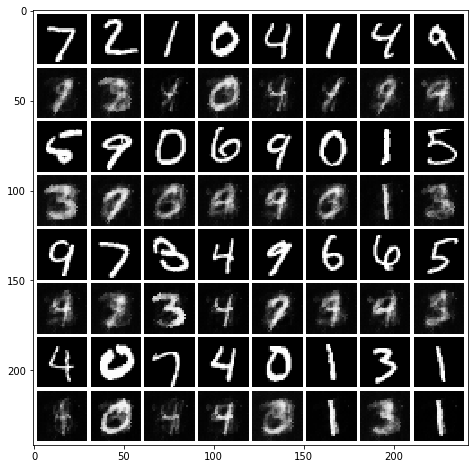

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


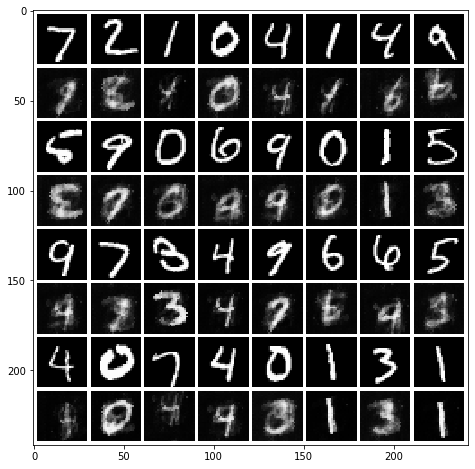

Signal error:
  MSE: 0.06220308319461765, std: 0.025133816330332542
  MAE: 0.1312749617081863, std: 0.04055425660796873
  SSIM: 0.30973743859519565, std: 0.16263368181819293
  Sharpness: 0.14495527269317418, std: 0.03647108335053546
  PhCo-MSE: 0.06939059328533403, std: 0.033479386655012155
  PhCo-MAE: 0.1398612064185727, std: 0.04826431172022773
  PhCo-SSIM: 0.3086084929522934, std: 0.16071354584678751
  CroCo-MSE: 0.05058747679549924, std: 0.01977216960281412
  CroCo-MAE: 0.1184731403227488, std: 0.03591642291385363
  CroCo-SSIM: 0.38863705840628016, std: 0.1388444395826357

Magnitude error:
  MSE Magnitude: 19.514458272551888, std: 7.245320233745555

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.06220 | 0.1313 | 0.3097 | 0.1450 | 0.06939 | 0.1399 | 0.3086 | 0.05059 | 0.1185 | 0.3886 | 19.51 |
Start training with ts of 32 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


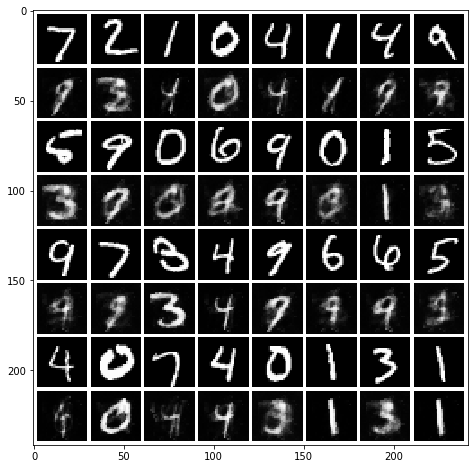

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


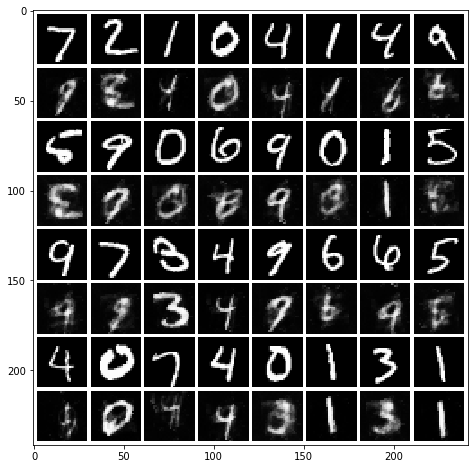

Signal error:
  MSE: 0.06435644156044873, std: 0.025539655742493887
  MAE: 0.12374896733854257, std: 0.04115090376358116
  SSIM: 0.3421189563652706, std: 0.1852123021610783
  Sharpness: 0.13942764696357093, std: 0.03694068706688434
  PhCo-MSE: 0.06714550982837864, std: 0.03200917497924786
  PhCo-MAE: 0.12718685816435027, std: 0.047547865489745746
  PhCo-SSIM: 0.36191634045484333, std: 0.18117952174921623
  CroCo-MSE: 0.050402558258838326, std: 0.020041493645772426
  CroCo-MAE: 0.10827749613417836, std: 0.03661184943478882
  CroCo-SSIM: 0.4371211607643408, std: 0.1593597436161965

Magnitude error:
  MSE Magnitude: 18.259310380064996, std: 7.24639892559406

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.06436 | 0.1237 | 0.3421 | 0.1394 | 0.06715 | 0.1272 | 0.3619 | 0.05040 | 0.1083 | 0.4371 | 18.26 |
Start training with ts of 32 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


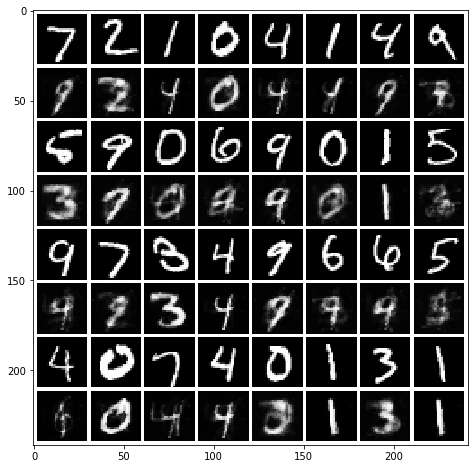

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


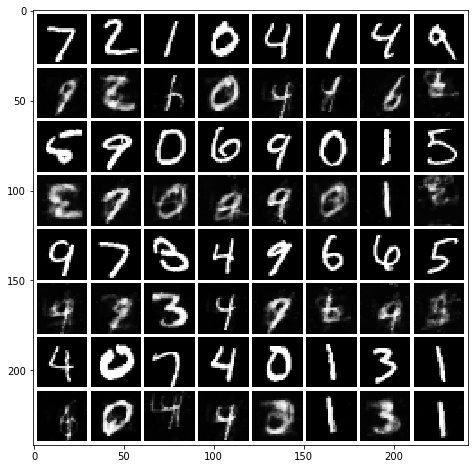

Signal error:
  MSE: 0.06534330924591814, std: 0.02634184532480759
  MAE: 0.120801147898419, std: 0.04055991388979419
  SSIM: 0.3582139764066977, std: 0.18931753213813743
  Sharpness: 0.13851097319305272, std: 0.037375279687009544
  PhCo-MSE: 0.06787293643787962, std: 0.03286738756797143
  PhCo-MAE: 0.1238308841793696, std: 0.047256180017659015
  PhCo-SSIM: 0.3807585411491982, std: 0.18268709657298443
  CroCo-MSE: 0.05016672976512382, std: 0.020190999142346285
  CroCo-MAE: 0.1039473473556427, std: 0.0355341347420552
  CroCo-SSIM: 0.4600605454860752, std: 0.1615118474352968

Magnitude error:
  MSE Magnitude: 17.291787476340875, std: 6.972422910763868

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.06534 | 0.1208 | 0.3582 | 0.1385 | 0.06787 | 0.1238 | 0.3808 | 0.05017 | 0.1039 | 0.4601 | 17.29 |
Start training with ts of 64 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


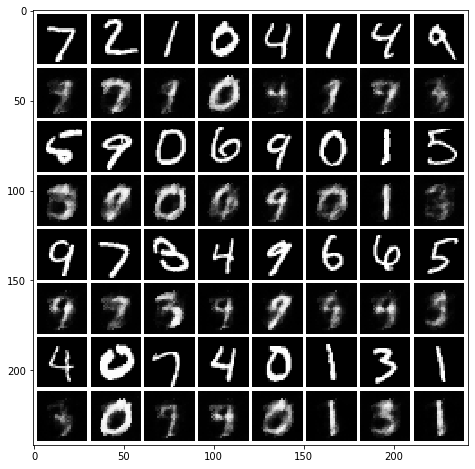

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


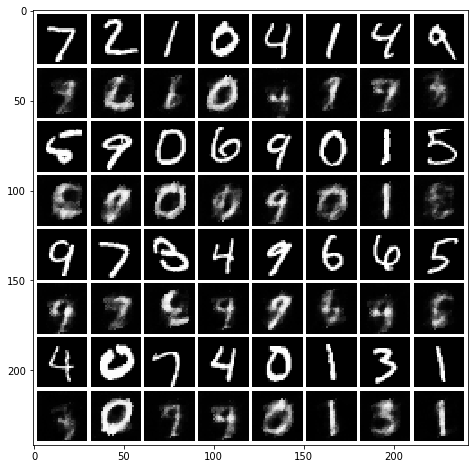

Signal error:
  MSE: 0.05904647124134499, std: 0.026543139456344737
  MAE: 0.11093468738908996, std: 0.03848711131809993
  SSIM: 0.4188779692754424, std: 0.1797399328992927
  Sharpness: 0.13486355288372284, std: 0.03845974949810371
  PhCo-MSE: 0.06517385011443366, std: 0.03418177876864396
  PhCo-MAE: 0.11830670120252762, std: 0.04617073969251852
  PhCo-SSIM: 0.4120958885674546, std: 0.18160987297181272
  CroCo-MSE: 0.04753542556136381, std: 0.019545397821217676
  CroCo-MAE: 0.09810958873094933, std: 0.031927872912289774
  CroCo-SSIM: 0.49564265729508694, std: 0.14909671632809388

Magnitude error:
  MSE Magnitude: 18.359116631784886, std: 7.354933211852177

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05905 | 0.1109 | 0.4189 | 0.1349 | 0.06517 | 0.1183 | 0.4121 | 0.04754 | 0.09811 | 0.4956 | 18.36 |
Start training with ts of 64 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


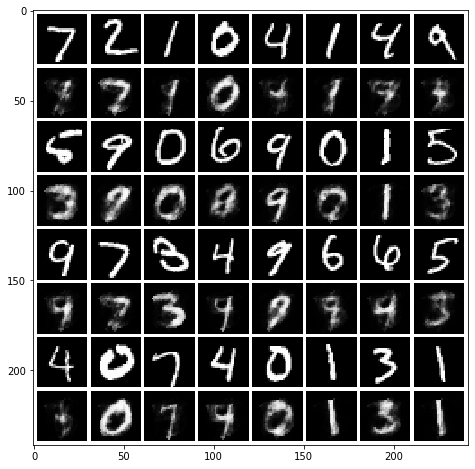

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


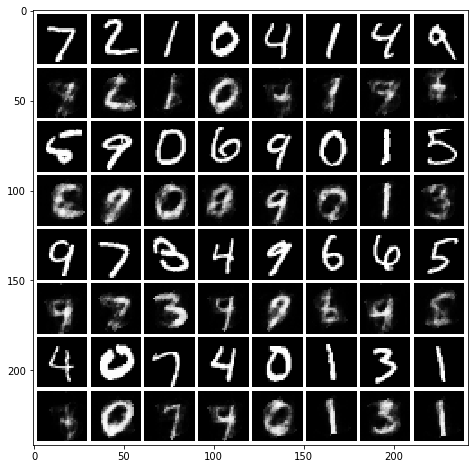

Signal error:
  MSE: 0.057347756752278656, std: 0.026775578663293
  MAE: 0.10635628803720465, std: 0.03839843078527529
  SSIM: 0.4485095607757269, std: 0.18788746814351648
  Sharpness: 0.1306714497027338, std: 0.03724377104130291
  PhCo-MSE: 0.059475214663962106, std: 0.03198053953712221
  PhCo-MAE: 0.1090232422684494, std: 0.04373698580741313
  PhCo-SSIM: 0.45916659916212976, std: 0.1868919702019315
  CroCo-MSE: 0.04428631051268894, std: 0.018915085611824294
  CroCo-MAE: 0.091687594573159, std: 0.03132004120046288
  CroCo-SSIM: 0.5346663663528946, std: 0.15539209471495627

Magnitude error:
  MSE Magnitude: 16.165057893929937, std: 6.739818524657663

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05735 | 0.1064 | 0.4485 | 0.1307 | 0.05948 | 0.1090 | 0.4592 | 0.04429 | 0.09169 | 0.5347 | 16.17 |
Start training with ts of 64 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


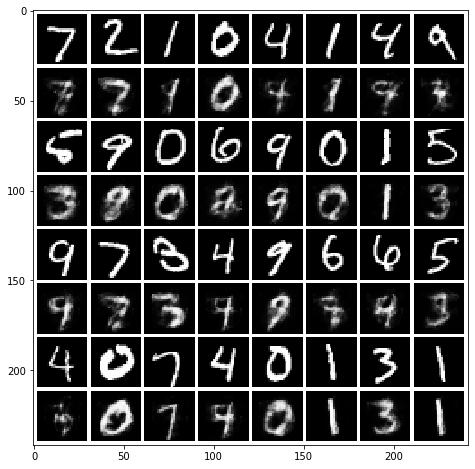

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


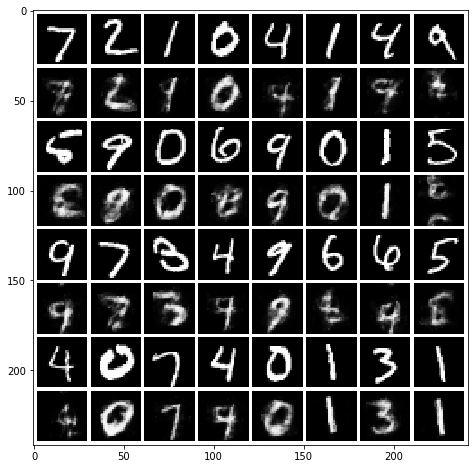

Signal error:
  MSE: 0.05728892148636078, std: 0.026446186394198164
  MAE: 0.10476196533636539, std: 0.03841857550047608
  SSIM: 0.45983344494973233, std: 0.1929806730267391
  Sharpness: 0.12980668539274307, std: 0.03737310573526408
  PhCo-MSE: 0.05805966761295167, std: 0.029869271687433918
  PhCo-MAE: 0.1058862956788289, std: 0.04195830875077937
  PhCo-SSIM: 0.47606178211102557, std: 0.1886995213994082
  CroCo-MSE: 0.043564671808098865, std: 0.01890148259282703
  CroCo-MAE: 0.08936920346877741, std: 0.0316551360359865
  CroCo-SSIM: 0.5495207750168427, std: 0.16039007425720214

Magnitude error:
  MSE Magnitude: 15.277637244927867, std: 6.6278303219012775

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05729 | 0.1048 | 0.4598 | 0.1298 | 0.05806 | 0.1059 | 0.4761 | 0.04356 | 0.08937 | 0.5495 | 15.28 |
Start training with ts of 128 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


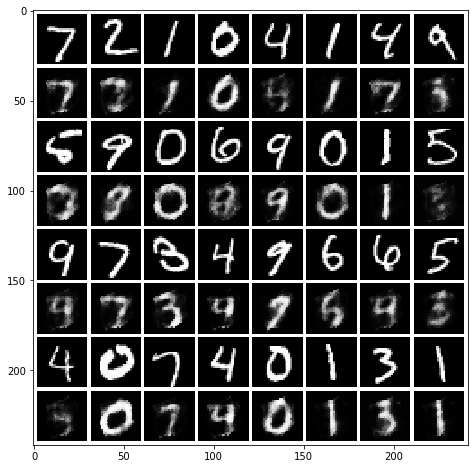

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


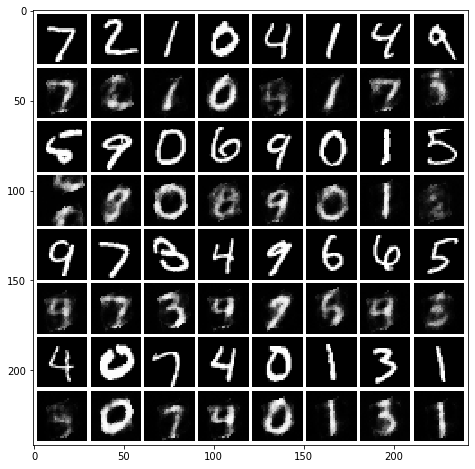

Signal error:
  MSE: 0.055130460198597575, std: 0.026407869159061695
  MAE: 0.1053025784149213, std: 0.036887168361563145
  SSIM: 0.4483303865141063, std: 0.17781645293563927
  Sharpness: 0.1341969245279076, std: 0.03639917914902534
  PhCo-MSE: 0.06186436645111826, std: 0.03295408791094969
  PhCo-MAE: 0.11316858557438536, std: 0.04321017877523044
  PhCo-SSIM: 0.43465609242169045, std: 0.17909821009444127
  CroCo-MSE: 0.044353089586820715, std: 0.019248464809769036
  CroCo-MAE: 0.09317379418644123, std: 0.02998457573375934
  CroCo-SSIM: 0.5197076077788332, std: 0.1434714531637263

Magnitude error:
  MSE Magnitude: 16.517382797755843, std: 7.394824839205021

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05513 | 0.1053 | 0.4483 | 0.1342 | 0.06186 | 0.1132 | 0.4347 | 0.04435 | 0.09317 | 0.5197 | 16.52 |
Start training with ts of 128 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


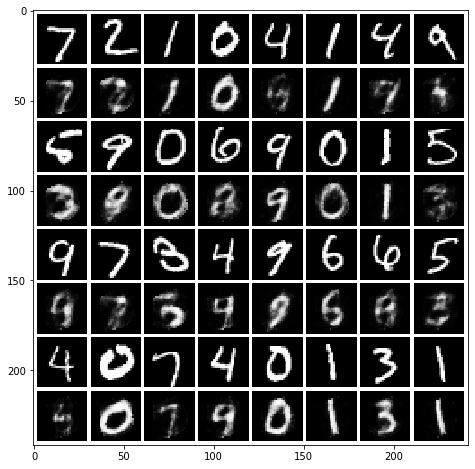

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


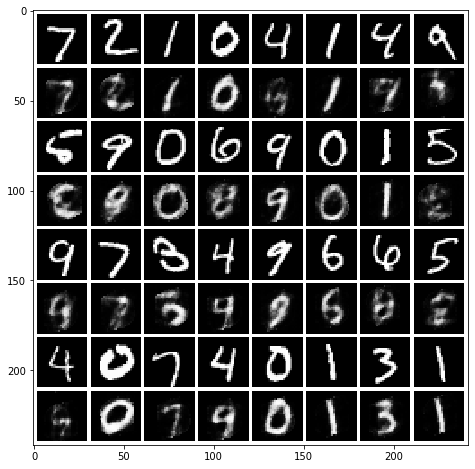

Signal error:
  MSE: 0.052727985427964086, std: 0.025985999580225308
  MAE: 0.09949388828317751, std: 0.0371456298133294
  SSIM: 0.49153488882367624, std: 0.19404663477017442
  Sharpness: 0.1281081056537586, std: 0.03732327203762955
  PhCo-MSE: 0.05624775357432554, std: 0.033563217701169004
  PhCo-MAE: 0.10350146409473382, std: 0.04443280961124877
  PhCo-SSIM: 0.4924662187003235, std: 0.1950457772541778
  CroCo-MSE: 0.04099610380126251, std: 0.01851339062490722
  CroCo-MAE: 0.08613797866382811, std: 0.030284637972847864
  CroCo-SSIM: 0.5690832738121044, std: 0.15904941818577353

Magnitude error:
  MSE Magnitude: 14.76839335199887, std: 6.969223843137395

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05273 | 0.09949 | 0.4915 | 0.1281 | 0.05625 | 0.1035 | 0.4925 | 0.04100 | 0.08614 | 0.5691 | 14.77 |
Start training with ts of 128 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


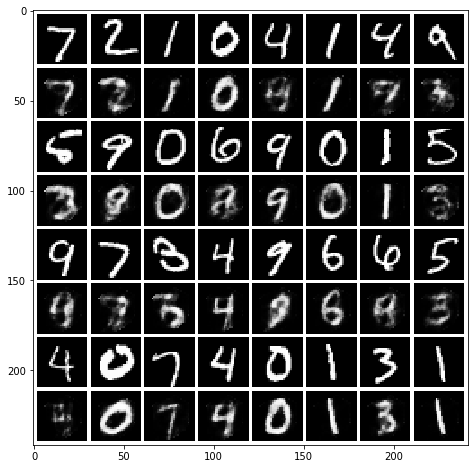

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


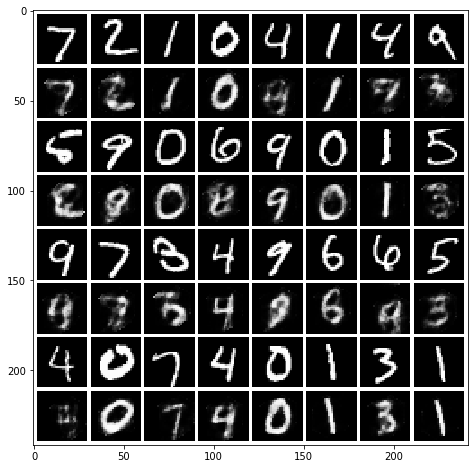

Signal error:
  MSE: 0.05233520249430512, std: 0.02590269561095164
  MAE: 0.0973520689040015, std: 0.037475794158281006
  SSIM: 0.5072091911802774, std: 0.19760008290838832
  Sharpness: 0.1275055721846582, std: 0.03814605840410069
  PhCo-MSE: 0.05512472386794798, std: 0.032521581526576054
  PhCo-MAE: 0.10047373547786265, std: 0.04386442366292707
  PhCo-SSIM: 0.511663924733323, std: 0.2023038766838073
  CroCo-MSE: 0.04017403234274752, std: 0.018816876421583723
  CroCo-MAE: 0.08354975233760342, std: 0.031074435871226096
  CroCo-SSIM: 0.5883431998577635, std: 0.16291518384415074

Magnitude error:
  MSE Magnitude: 13.34808898028713, std: 6.422097896136959

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05234 | 0.09735 | 0.5072 | 0.1275 | 0.05512 | 0.1005 | 0.5117 | 0.04017 | 0.08355 | 0.5883 | 13.35 |
Start training with ts of 256 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


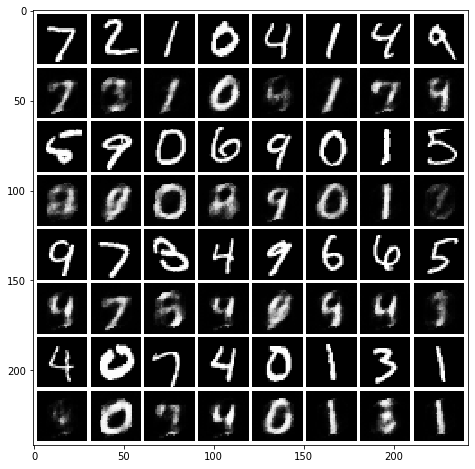

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


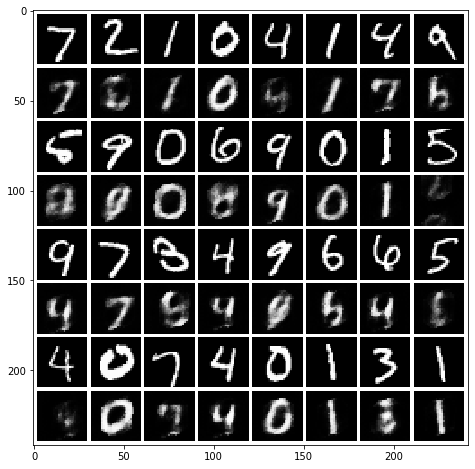

Signal error:
  MSE: 0.05311017838312182, std: 0.02551026438157475
  MAE: 0.09866256188615807, std: 0.036478011165190824
  SSIM: 0.5007413625105399, std: 0.18389317984923628
  Sharpness: 0.12973923271762106, std: 0.037054049391532035
  PhCo-MSE: 0.061510068824645714, std: 0.034582140103241135
  PhCo-MAE: 0.10808454700236325, std: 0.04472749169853675
  PhCo-SSIM: 0.4747506099819063, std: 0.18992051729888293
  CroCo-MSE: 0.043360550629586214, std: 0.019290273283492716
  CroCo-MAE: 0.08766131599804794, std: 0.030476610978779996
  CroCo-SSIM: 0.5655566819899455, std: 0.15101396177735577

Magnitude error:
  MSE Magnitude: 16.239054468520646, std: 7.6691821430639155

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05311 | 0.09866 | 0.5007 | 0.1297 | 0.06151 | 0.1081 | 0.4748 | 0.04336 | 0.08766 | 0.5656 | 16.24 |
Start training with ts of 256 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


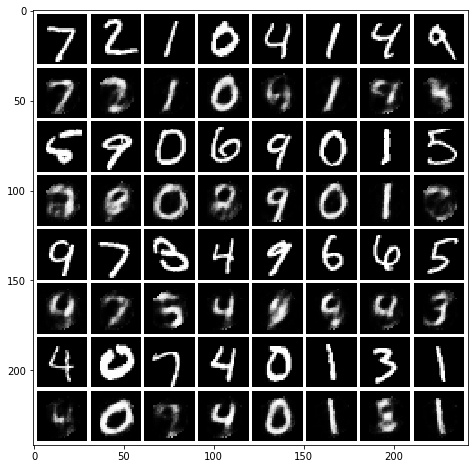

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


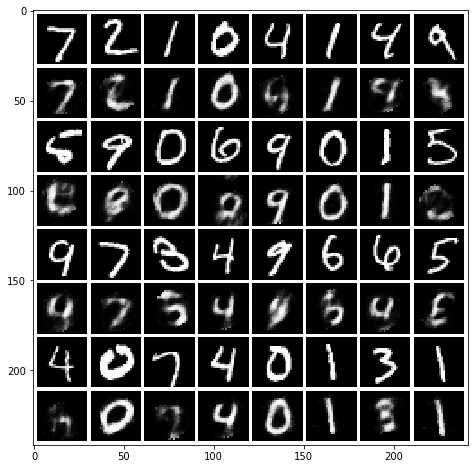

Signal error:
  MSE: 0.04834580067426941, std: 0.02443945032052189
  MAE: 0.09281218412979797, std: 0.03543198364417661
  SSIM: 0.5382761578024688, std: 0.1878243284463705
  Sharpness: 0.12401701913365246, std: 0.03723300364254566
  PhCo-MSE: 0.05185989561414317, std: 0.03213456299058167
  PhCo-MAE: 0.09664466576941777, std: 0.042784708532984876
  PhCo-SSIM: 0.5337976450447197, std: 0.1946668118616687
  CroCo-MSE: 0.03789205155953823, std: 0.018011746632158314
  CroCo-MAE: 0.08071934653889912, std: 0.02942249121734162
  CroCo-SSIM: 0.6088217727106416, std: 0.1540042747281019

Magnitude error:
  MSE Magnitude: 13.55896796541806, std: 6.677417811771744

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04835 | 0.09281 | 0.5383 | 0.1240 | 0.05186 | 0.09664 | 0.5338 | 0.03789 | 0.08072 | 0.6088 | 13.56 |
Start training with ts of 256 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


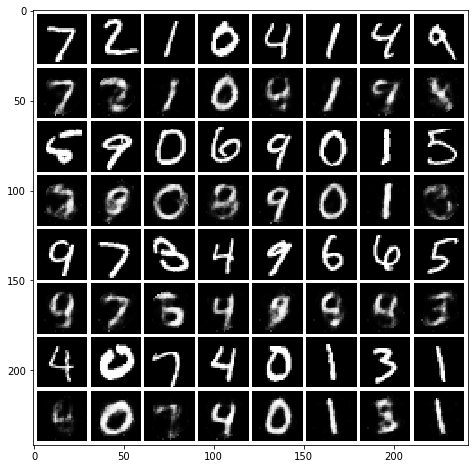

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


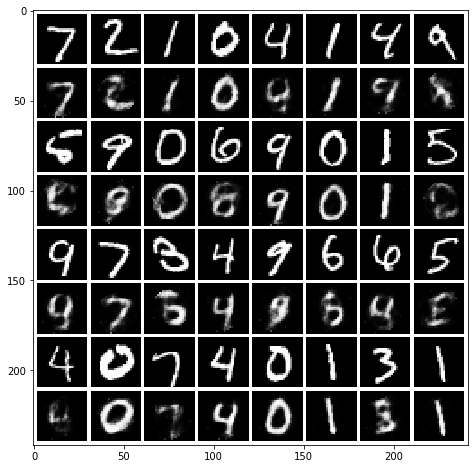

Signal error:
  MSE: 0.047801268965940835, std: 0.024525341616007033
  MAE: 0.0897402150567359, std: 0.03521405255170719
  SSIM: 0.5525349154123523, std: 0.19383151580411437
  Sharpness: 0.1222667422844262, std: 0.037352940618035214
  PhCo-MSE: 0.04904388399495474, std: 0.03010307416243085
  PhCo-MAE: 0.09086112558270543, std: 0.04048618052897611
  PhCo-SSIM: 0.558415396821351, std: 0.19560422820180912
  CroCo-MSE: 0.03666016059651156, std: 0.017974844894018703
  CroCo-MAE: 0.07679857643597643, std: 0.02925175960515527
  CroCo-SSIM: 0.6288807018710123, std: 0.1583268672406185

Magnitude error:
  MSE Magnitude: 12.208325809317156, std: 6.467600460280222

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04780 | 0.08974 | 0.5525 | 0.1223 | 0.04904 | 0.09086 | 0.5584 | 0.03666 | 0.07680 | 0.6289 | 12.21 |
Start training with ts of 512 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


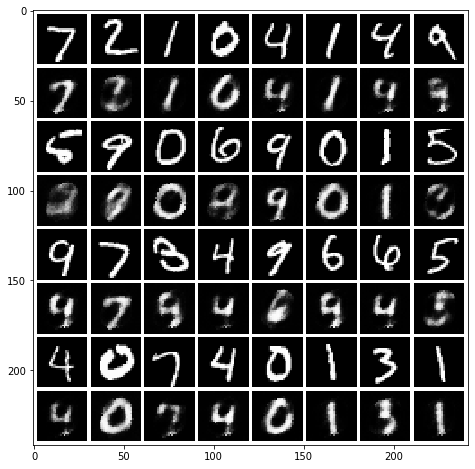

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


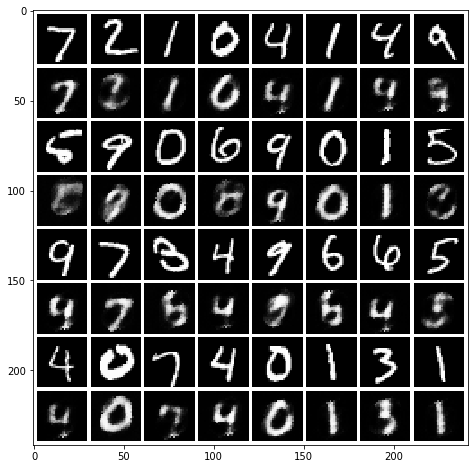

Signal error:
  MSE: 0.05292394240768772, std: 0.024928018691765946
  MAE: 0.0977926258892694, std: 0.03501729973527333
  SSIM: 0.5076203145647599, std: 0.1711425282182548
  Sharpness: 0.13226038980659316, std: 0.03629021978320743
  PhCo-MSE: 0.06251687145731921, std: 0.034535022355829566
  PhCo-MAE: 0.10853083700931165, std: 0.04370492684395371
  PhCo-SSIM: 0.4730597771062278, std: 0.18296729088843858
  CroCo-MSE: 0.044300207766355015, std: 0.019372316306039677
  CroCo-MAE: 0.08806910181920102, std: 0.029779438650765183
  CroCo-SSIM: 0.5635131742267996, std: 0.14154331956921126

Magnitude error:
  MSE Magnitude: 16.386933527069726, std: 7.459251147984445

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05292 | 0.09779 | 0.5076 | 0.1323 | 0.06252 | 0.1085 | 0.4731 | 0.04430 | 0.08807 | 0.5635 | 16.39 |
Start training with ts of 512 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


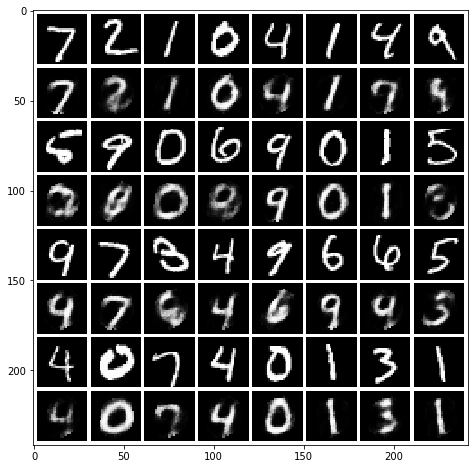

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


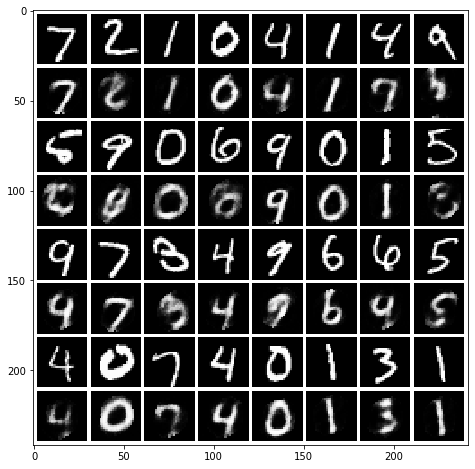

Signal error:
  MSE: 0.046533678223113384, std: 0.02400694395736455
  MAE: 0.08806391968028038, std: 0.03431337956466699
  SSIM: 0.5669939857259283, std: 0.1828850108027761
  Sharpness: 0.12322124607949445, std: 0.037146125879534905
  PhCo-MSE: 0.05111307258016495, std: 0.03131278592497923
  PhCo-MAE: 0.09301467287423293, std: 0.04103707237770665
  PhCo-SSIM: 0.5540861699182682, std: 0.18858984651047409
  CroCo-MSE: 0.03711746182511888, std: 0.0178544181818275
  CroCo-MAE: 0.07715465770797891, std: 0.028640828700937294
  CroCo-SSIM: 0.6301654903350277, std: 0.149816102707943

Magnitude error:
  MSE Magnitude: 12.783496262039284, std: 6.743458301468743

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04653 | 0.08806 | 0.5670 | 0.1232 | 0.05111 | 0.09301 | 0.5541 | 0.03712 | 0.07715 | 0.6302 | 12.78 |
Start training with ts of 512 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


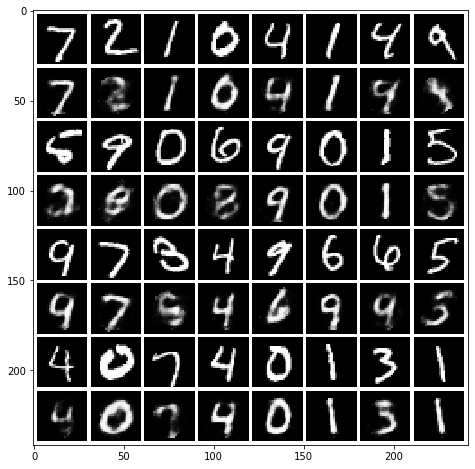

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


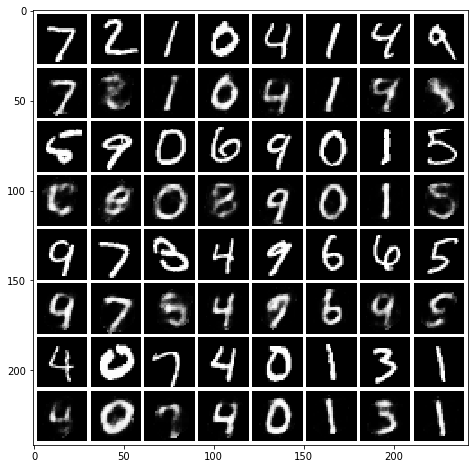

Signal error:
  MSE: 0.044686017612093565, std: 0.024116363524380225
  MAE: 0.08393347730179812, std: 0.0345599712714311
  SSIM: 0.593130746363434, std: 0.1900353998136622
  Sharpness: 0.11783897831373193, std: 0.037517170250774286
  PhCo-MSE: 0.04604896846126394, std: 0.030708978185044585
  PhCo-MAE: 0.08508368795537535, std: 0.04115585801540835
  PhCo-SSIM: 0.5957287622998106, std: 0.20242843270926217
  CroCo-MSE: 0.034322346164117334, std: 0.017847287184519847
  CroCo-MAE: 0.07174134033357404, std: 0.028792119819162902
  CroCo-SSIM: 0.6624350887813573, std: 0.15687867552537946

Magnitude error:
  MSE Magnitude: 11.020813933685755, std: 6.259314748882344

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04469 | 0.08393 | 0.5931 | 0.1178 | 0.04605 | 0.08508 | 0.5957 | 0.03432 | 0.07174 | 0.6624 | 11.02 |
Start training with ts of 1000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


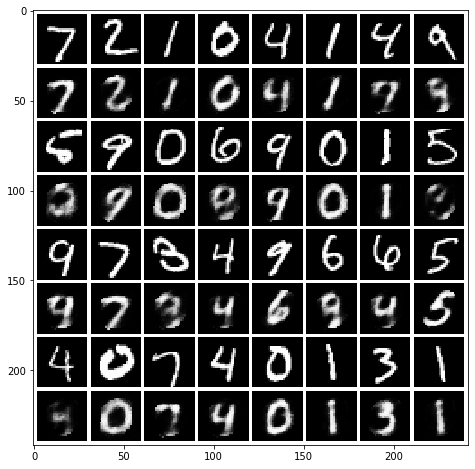

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


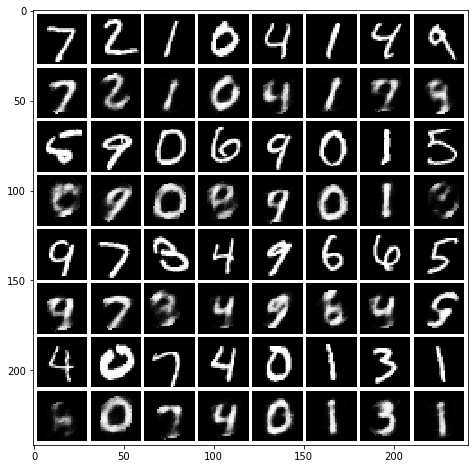

Signal error:
  MSE: 0.04891588310010775, std: 0.02362867132933664
  MAE: 0.0910214878476836, std: 0.03295336868415174
  SSIM: 0.5547725779175221, std: 0.16841256040556593
  Sharpness: 0.12902799429944717, std: 0.03654721628823659
  PhCo-MSE: 0.05895617797114028, std: 0.03373348759410405
  PhCo-MAE: 0.10213822370496928, std: 0.04226506681480774
  PhCo-SSIM: 0.5142024224150024, std: 0.18357992342365592
  CroCo-MSE: 0.040747503305738064, std: 0.01820372949841694
  CroCo-MAE: 0.081716006005081, std: 0.02775755428225879
  CroCo-SSIM: 0.6074023705965133, std: 0.13843963089721137

Magnitude error:
  MSE Magnitude: 14.391100399289016, std: 6.525254727912584

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04892 | 0.09102 | 0.5548 | 0.1290 | 0.05896 | 0.1021 | 0.5142 | 0.04075 | 0.08172 | 0.6074 | 14.39 |
Start training with ts of 1000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


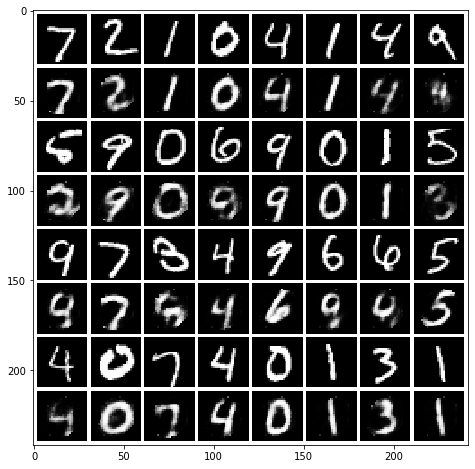

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


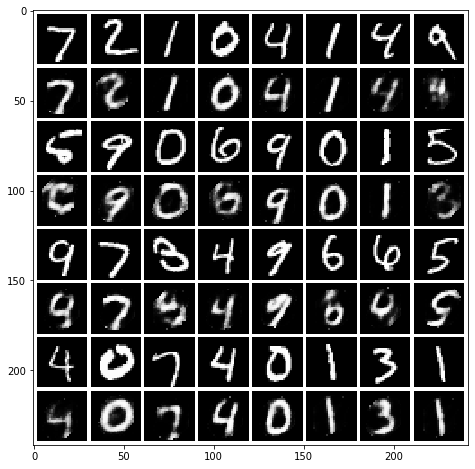

Signal error:
  MSE: 0.04535168809729839, std: 0.023817345948505497
  MAE: 0.0834910478497477, std: 0.03369634567065201
  SSIM: 0.5939917978505638, std: 0.17662876256606086
  Sharpness: 0.12562403861720023, std: 0.03831896881224459
  PhCo-MSE: 0.05074256122861698, std: 0.03294932910966703
  PhCo-MAE: 0.08913492071951623, std: 0.04164705813130274
  PhCo-SSIM: 0.5794084920131899, std: 0.19052748045302828
  CroCo-MSE: 0.036240064772300684, std: 0.017775914789687076
  CroCo-MAE: 0.07293740110435465, std: 0.027823036308272358
  CroCo-SSIM: 0.6530325716829932, std: 0.14335330392017573

Magnitude error:
  MSE Magnitude: 11.123304506584937, std: 5.6782818611029215

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04535 | 0.08349 | 0.5940 | 0.1256 | 0.05074 | 0.08913 | 0.5794 | 0.03624 | 0.07294 | 0.6530 | 11.12 |
Start training with ts of 1000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


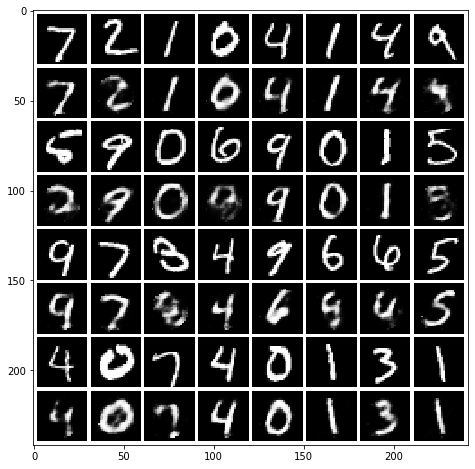

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


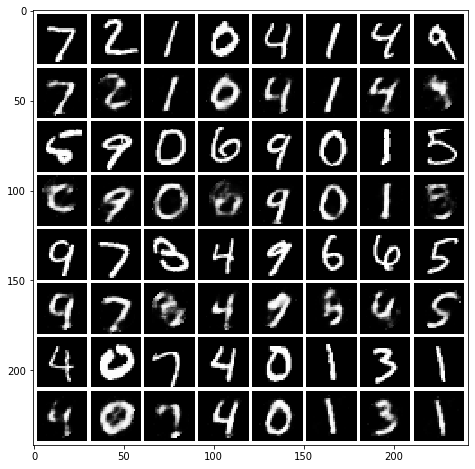

Signal error:
  MSE: 0.04309569410588665, std: 0.023350899944609434
  MAE: 0.07828327778315725, std: 0.03290160206284103
  SSIM: 0.6215860863834443, std: 0.18224137426848386
  Sharpness: 0.11772549865813156, std: 0.03719402698721864
  PhCo-MSE: 0.043955890906090644, std: 0.029934283762817968
  PhCo-MAE: 0.07875414524914959, std: 0.03865461550113452
  PhCo-SSIM: 0.6277681772583765, std: 0.18756386633100092
  CroCo-MSE: 0.03341257310671608, std: 0.017352960433856313
  CroCo-MAE: 0.06698997118655825, std: 0.02724671310304336
  CroCo-SSIM: 0.6858029073682468, std: 0.14996281353122107

Magnitude error:
  MSE Magnitude: 9.899371343492753, std: 5.6185340612334915

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04310 | 0.07828 | 0.6216 | 0.1177 | 0.04396 | 0.07875 | 0.6278 | 0.03341 | 0.06699 | 0.6858 | 9.899 |
Start training with ts of 2000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


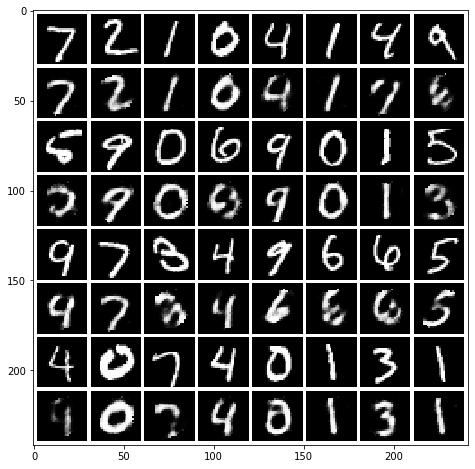

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


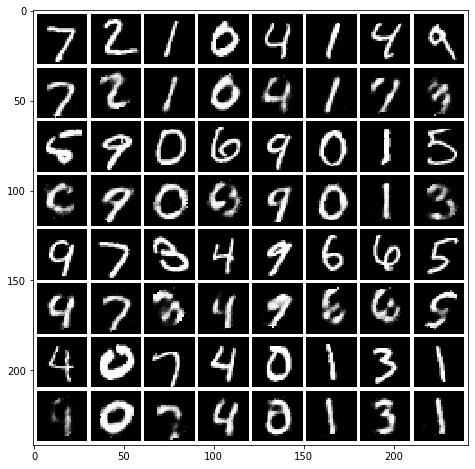

Signal error:
  MSE: 0.04523964133886693, std: 0.023732351107494363
  MAE: 0.07921552869811421, std: 0.03213651241159791
  SSIM: 0.6221649628097247, std: 0.17078691471935492
  Sharpness: 0.1238587119645791, std: 0.039152287373540914
  PhCo-MSE: 0.0511079185350809, std: 0.034078695025128766
  PhCo-MAE: 0.08540223839918326, std: 0.04165086387556931
  PhCo-SSIM: 0.6021032435970477, std: 0.1891932089876366
  CroCo-MSE: 0.03663211354796658, std: 0.01807064334415444
  CroCo-MAE: 0.06931006297782005, std: 0.026581640106903556
  CroCo-SSIM: 0.676099408303463, std: 0.1411325519435175

Magnitude error:
  MSE Magnitude: 10.76755164660841, std: 5.5417289717111196

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04524 | 0.07922 | 0.6222 | 0.1239 | 0.05111 | 0.08540 | 0.6021 | 0.03663 | 0.06931 | 0.6761 | 10.77 |
Start training with ts of 2000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


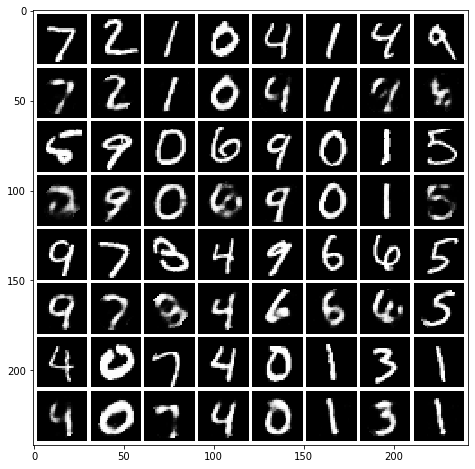

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


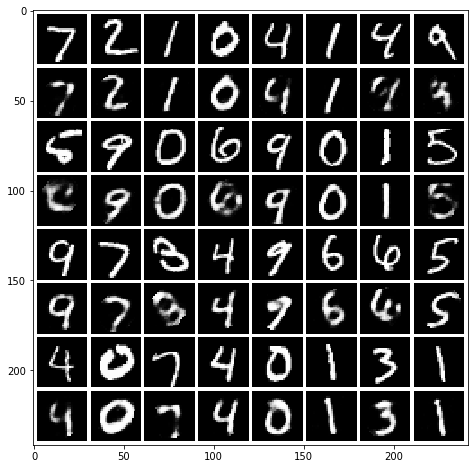

Signal error:
  MSE: 0.04163827553634292, std: 0.023015697339576806
  MAE: 0.07289769320686901, std: 0.03134255628519455
  SSIM: 0.6553767377195561, std: 0.16931978031647912
  Sharpness: 0.11594686575146551, std: 0.03767642237378571
  PhCo-MSE: 0.04244984086153636, std: 0.027816363879318354
  PhCo-MAE: 0.07335133859578491, std: 0.03550476535175087
  PhCo-SSIM: 0.6552184479472949, std: 0.17805539169543758
  CroCo-MSE: 0.03253280726585217, std: 0.016814441993248802
  CroCo-MAE: 0.06232905207980366, std: 0.025343138090978188
  CroCo-SSIM: 0.7117454922162378, std: 0.13752926510991073

Magnitude error:
  MSE Magnitude: 9.104686343416645, std: 5.190385271555247

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04164 | 0.07290 | 0.6554 | 0.1159 | 0.04245 | 0.07335 | 0.6552 | 0.03253 | 0.06233 | 0.7117 | 9.105 |
Start training with ts of 2000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


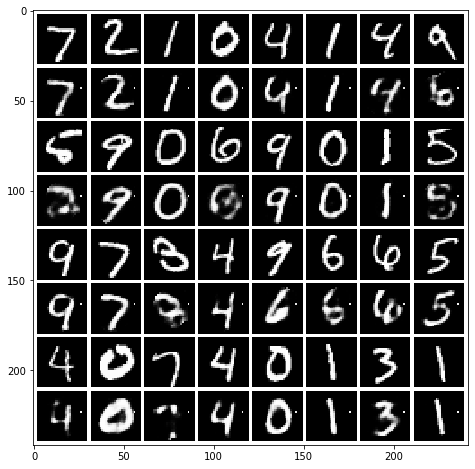

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


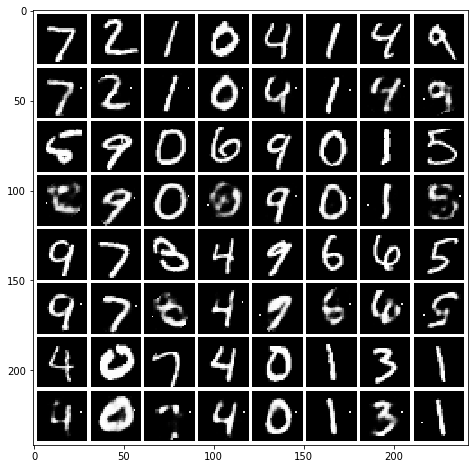

Signal error:
  MSE: 0.040943435130657235, std: 0.022959903779258342
  MAE: 0.07213424520705303, std: 0.03166220960126526
  SSIM: 0.6425336781682438, std: 0.16536054235753095
  Sharpness: 0.11701911503924237, std: 0.03637201136262594
  PhCo-MSE: 0.043687041258863246, std: 0.03523947622692165
  PhCo-MAE: 0.07468631934989389, std: 0.04335160972532265
  PhCo-SSIM: 0.6367608454424463, std: 0.19952390980430332
  CroCo-MSE: 0.031076046642965593, std: 0.016166033591496976
  CroCo-MAE: 0.06059606572853227, std: 0.025093357007017293
  CroCo-SSIM: 0.7014443908053833, std: 0.13123314524152752

Magnitude error:
  MSE Magnitude: 8.014011732752731, std: 4.588828147858368

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04094 | 0.07213 | 0.6425 | 0.1170 | 0.04369 | 0.07469 | 0.6368 | 0.03108 | 0.06060 | 0.7014 | 8.014 |
Start training with ts of 5000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


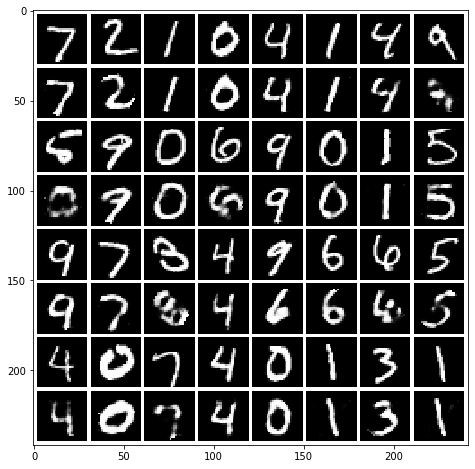

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


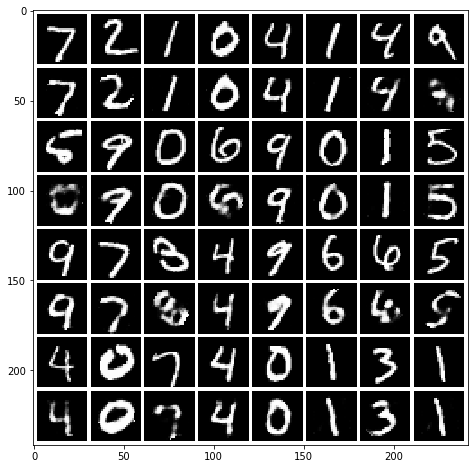

Signal error:
  MSE: 0.04090680217996123, std: 0.023457834672398075
  MAE: 0.06959084736809018, std: 0.030932076522331528
  SSIM: 0.6757097877247675, std: 0.16268815716177884
  Sharpness: 0.1185844361703616, std: 0.038477769839659934
  PhCo-MSE: 0.04124853973621612, std: 0.026551507653486378
  PhCo-MAE: 0.0695584576096735, std: 0.03344488254370355
  PhCo-SSIM: 0.677435371584993, std: 0.16734985492423024
  CroCo-MSE: 0.032190029464572945, std: 0.016402793975490243
  CroCo-MAE: 0.05956483422687597, std: 0.024130437175810097
  CroCo-SSIM: 0.7281283708960566, std: 0.12849578315143798

Magnitude error:
  MSE Magnitude: 8.373505894759663, std: 4.564475959839578

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04091 | 0.06959 | 0.6757 | 0.1186 | 0.04125 | 0.06956 | 0.6774 | 0.03219 | 0.05956 | 0.7281 | 8.374 |
Start training with ts of 5000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


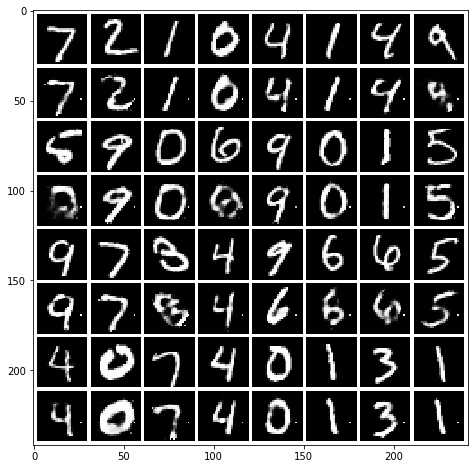

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


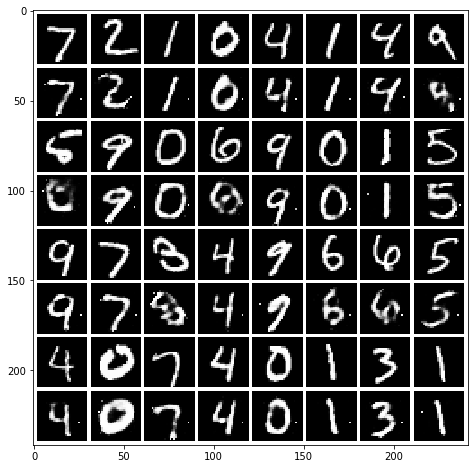

Signal error:
  MSE: 0.03972964379909172, std: 0.023649188606514524
  MAE: 0.06782829359508469, std: 0.031228943361812644
  SSIM: 0.6671854033666204, std: 0.15729254889141017
  Sharpness: 0.11931809559197501, std: 0.03655622168794545
  PhCo-MSE: 0.03782440682789456, std: 0.025564756350957788
  PhCo-MAE: 0.06536503050665488, std: 0.032102078063312486
  PhCo-SSIM: 0.678952289431284, std: 0.1580330662708983
  CroCo-MSE: 0.030416048954521102, std: 0.015368428131710183
  CroCo-MAE: 0.05710115983583819, std: 0.023094344260701078
  CroCo-SSIM: 0.7214432317815485, std: 0.115890851656652

Magnitude error:
  MSE Magnitude: 7.53389976789494, std: 4.184096339392843

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03973 | 0.06783 | 0.6672 | 0.1193 | 0.03782 | 0.06537 | 0.6790 | 0.03042 | 0.05710 | 0.7214 | 7.534 |
Start training with ts of 5000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


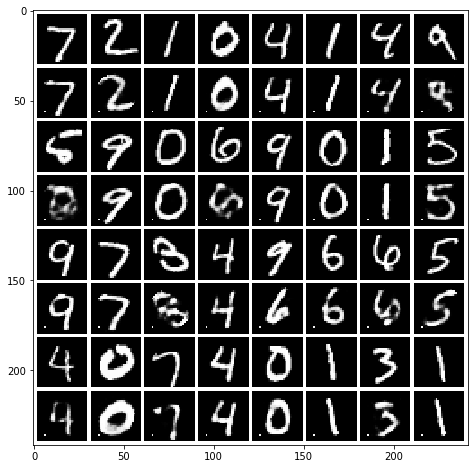

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


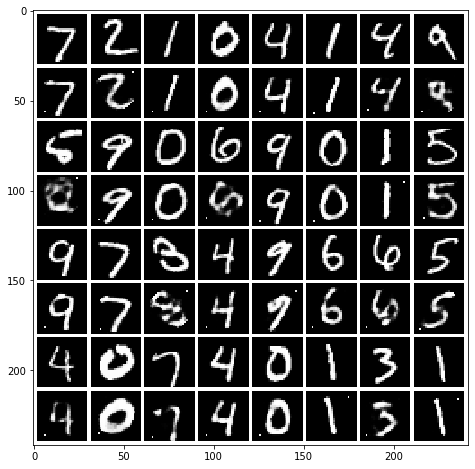

Signal error:
  MSE: 0.03690844834682139, std: 0.02206151422527686
  MAE: 0.06515174852847849, std: 0.030069753161744178
  SSIM: 0.6815011574895942, std: 0.15824292746812302
  Sharpness: 0.11373305313856844, std: 0.03505615774506481
  PhCo-MSE: 0.03473418908652093, std: 0.02465486125960549
  PhCo-MAE: 0.06226256899481086, std: 0.031920043977797206
  PhCo-SSIM: 0.6985661959956148, std: 0.16358720154842307
  CroCo-MSE: 0.027832056046918296, std: 0.014238387261802562
  CroCo-MAE: 0.054483808746226714, std: 0.022385642044096765
  CroCo-SSIM: 0.7376795283272214, std: 0.12030700708595922

Magnitude error:
  MSE Magnitude: 6.867382027750515, std: 3.950509990724591

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03691 | 0.06515 | 0.6815 | 0.1137 | 0.03473 | 0.06226 | 0.6986 | 0.02783 | 0.05448 | 0.7377 | 6.867 |
Start training with ts of 10000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


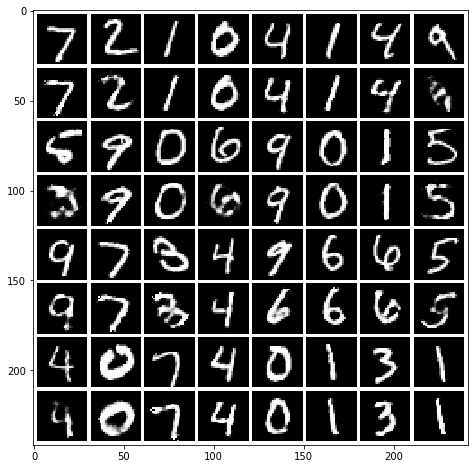

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


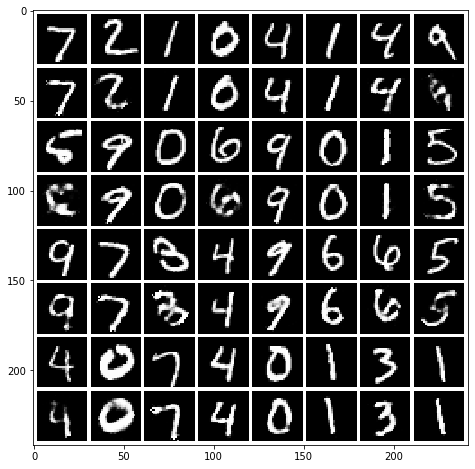

Signal error:
  MSE: 0.03734810638320596, std: 0.02247921584256709
  MAE: 0.06390702482531196, std: 0.029406334848273315
  SSIM: 0.7071233071980098, std: 0.15498255865403668
  Sharpness: 0.11658737381022682, std: 0.03774355363552228
  PhCo-MSE: 0.03685492951399283, std: 0.025340103395976102
  PhCo-MAE: 0.06298101056108862, std: 0.03173714680745551
  PhCo-SSIM: 0.7139075077749498, std: 0.1583922725934234
  CroCo-MSE: 0.029356438672039076, std: 0.015228639182640018
  CroCo-MAE: 0.05472157895928831, std: 0.022417642537088528
  CroCo-SSIM: 0.7552457599752264, std: 0.1196962972688094

Magnitude error:
  MSE Magnitude: 7.233805395903725, std: 3.9827547338205087

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03735 | 0.06391 | 0.7071 | 0.1166 | 0.03685 | 0.06298 | 0.7139 | 0.02936 | 0.05472 | 0.7552 | 7.234 |
Start training with ts of 10000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


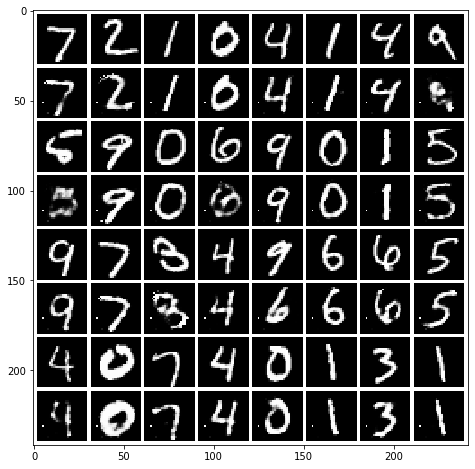

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


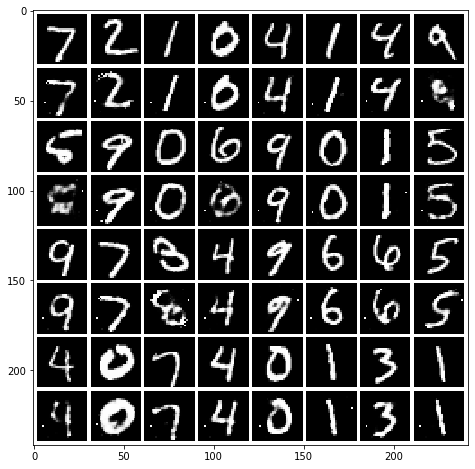

Signal error:
  MSE: 0.03600317463974534, std: 0.02188261958595547
  MAE: 0.06272903101034899, std: 0.029158856432781426
  SSIM: 0.6876851389105235, std: 0.15009525836124232
  Sharpness: 0.1163876798604488, std: 0.0355902471524543
  PhCo-MSE: 0.03456180731132008, std: 0.02565258580072332
  PhCo-MAE: 0.060688925346767064, std: 0.03202331220878331
  PhCo-SSIM: 0.7030787036136406, std: 0.15178010285640084
  CroCo-MSE: 0.027902307072281474, std: 0.014131077456099274
  CroCo-MAE: 0.053302781837373914, std: 0.02131707880676847
  CroCo-SSIM: 0.7388649182044484, std: 0.1114142606054742

Magnitude error:
  MSE Magnitude: 6.761187236430774, std: 3.730476287421955

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03600 | 0.06273 | 0.6877 | 0.1164 | 0.03456 | 0.06069 | 0.7031 | 0.02790 | 0.05330 | 0.7389 | 6.761 |
Start training with ts of 10000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


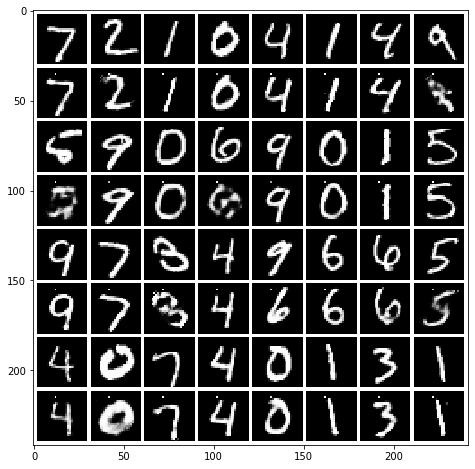

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


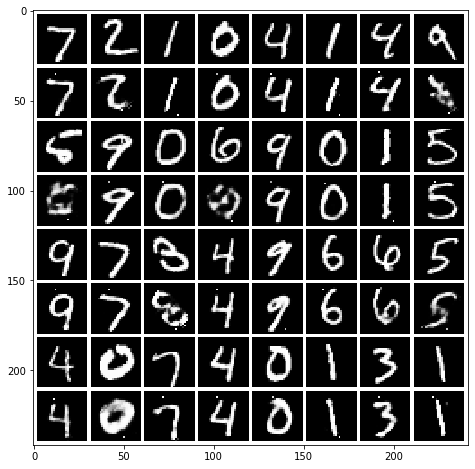

Signal error:
  MSE: 0.03339836389432094, std: 0.020639611093963617
  MAE: 0.06050010354283586, std: 0.028262468572238377
  SSIM: 0.7199418266361819, std: 0.15050482721732958
  Sharpness: 0.1096125432211019, std: 0.03221989569314951
  PhCo-MSE: 0.031166656403911475, std: 0.02461993627966997
  PhCo-MAE: 0.05739943641128775, std: 0.031409152692787684
  PhCo-SSIM: 0.7398594780148681, std: 0.15124553946630379
  CroCo-MSE: 0.025424540446692845, std: 0.013266371928981965
  CroCo-MAE: 0.05095477870236209, std: 0.020797482335128563
  CroCo-SSIM: 0.7715291106612838, std: 0.11226014392403251

Magnitude error:
  MSE Magnitude: 6.158996406315116, std: 3.7491446837490585

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03340 | 0.06050 | 0.7199 | 0.1096 | 0.03117 | 0.05740 | 0.7399 | 0.02542 | 0.05095 | 0.7715 | 6.159 |
Start training with ts of 30000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


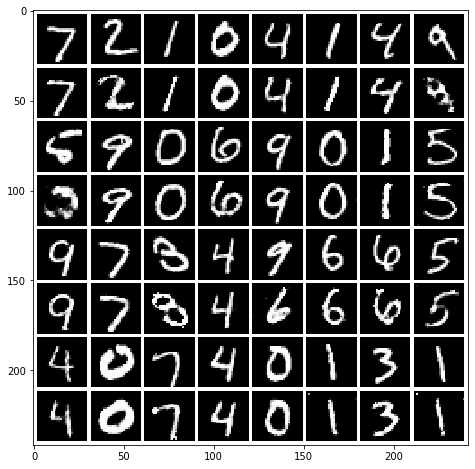

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


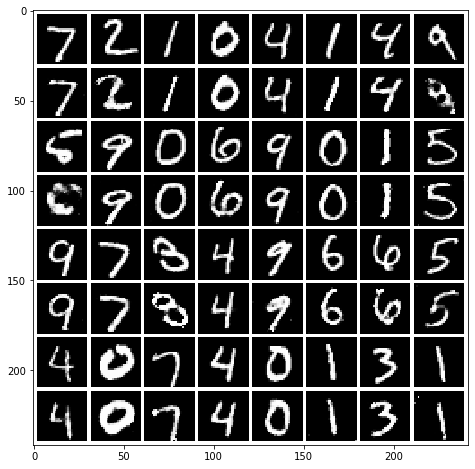

Signal error:
  MSE: 0.03264603864408855, std: 0.02142775022879749
  MAE: 0.05794805232744693, std: 0.027723837851592617
  SSIM: 0.7453801084330808, std: 0.1437445193469217
  Sharpness: 0.11187303739908663, std: 0.03603492112713572
  PhCo-MSE: 0.031044118788031483, std: 0.02461209303518536
  PhCo-MAE: 0.05571414622500015, std: 0.030133500979511486
  PhCo-SSIM: 0.7596778949866149, std: 0.140388021200974
  CroCo-MSE: 0.02528521879321488, std: 0.013486935113509707
  CroCo-MAE: 0.04942265336103446, std: 0.01999971894177618
  CroCo-SSIM: 0.7902444906801642, std: 0.10283894411313593

Magnitude error:
  MSE Magnitude: 5.987843209387868, std: 3.470138036105212

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03265 | 0.05795 | 0.7454 | 0.1119 | 0.03104 | 0.05571 | 0.7597 | 0.02529 | 0.04942 | 0.7902 | 5.988 |
Start training with ts of 30000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


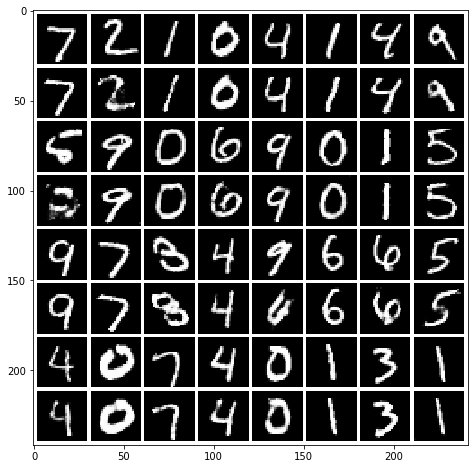

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


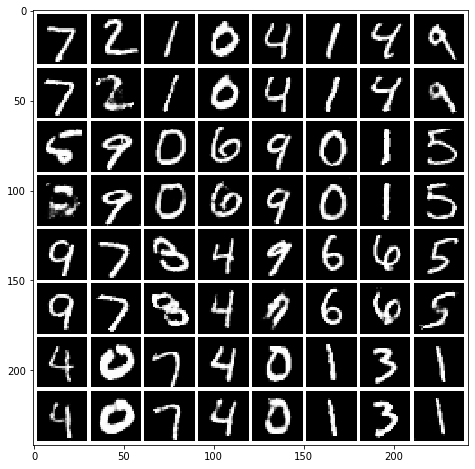

Signal error:
  MSE: 0.03034104261291759, std: 0.021132252320664943
  MAE: 0.055310821435341495, std: 0.027539269386163297
  SSIM: 0.7598980035849257, std: 0.1417117754302878
  Sharpness: 0.1048575871256551, std: 0.033914968219766646
  PhCo-MSE: 0.026918977056311633, std: 0.018791097542841445
  PhCo-MAE: 0.05103998798858811, std: 0.02409031557249478
  PhCo-SSIM: 0.7811293506898155, std: 0.12854141312136147
  CroCo-MSE: 0.022733008629757023, std: 0.012597765069925427
  CroCo-MAE: 0.046309877880958084, std: 0.018862671273115528
  CroCo-SSIM: 0.8066461069865245, std: 0.09860967292714713

Magnitude error:
  MSE Magnitude: 5.2019835094570706, std: 3.1260489431832847

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03034 | 0.05531 | 0.7599 | 0.1049 | 0.02692 | 0.05104 | 0.7811 | 0.02273 | 0.04631 | 0.8066 | 5.202 |
Start training with ts of 30000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


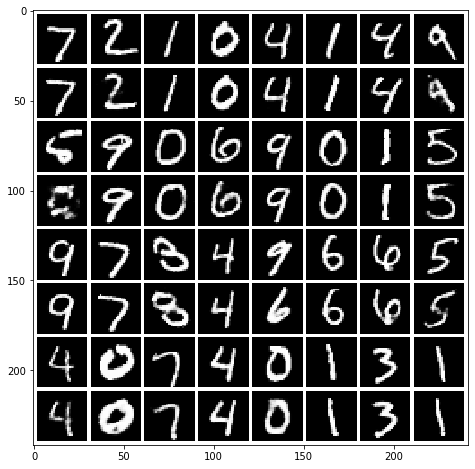

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


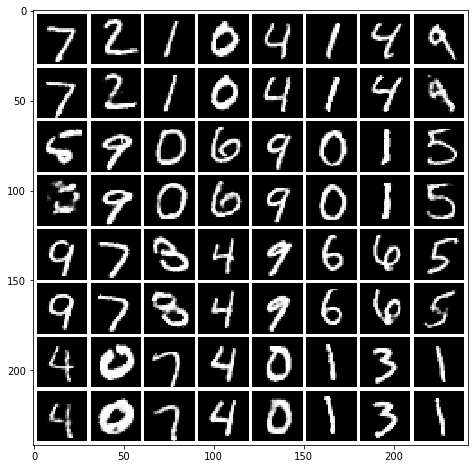

Signal error:
  MSE: 0.028093640629094807, std: 0.019706872793206123
  MAE: 0.05341982201753126, std: 0.026378488522594126
  SSIM: 0.7730349594002675, std: 0.1394536695620269
  Sharpness: 0.0986110790545647, std: 0.03214241650202512
  PhCo-MSE: 0.023823220678650614, std: 0.018085250073791272
  PhCo-MAE: 0.04800308217727434, std: 0.023887151887973128
  PhCo-SSIM: 0.80251919062291, std: 0.12059116813529498
  CroCo-MSE: 0.020412298676546925, std: 0.011697441336666042
  CroCo-MAE: 0.04405938510080887, std: 0.018425725858572967
  CroCo-SSIM: 0.822779505858372, std: 0.09652201462640045

Magnitude error:
  MSE Magnitude: 4.571823369327977, std: 2.9321156186068076

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02809 | 0.05342 | 0.7730 | 0.09861 | 0.02382 | 0.04800 | 0.8025 | 0.02041 | 0.04406 | 0.8228 | 4.572 |
Start training with ts of 60000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


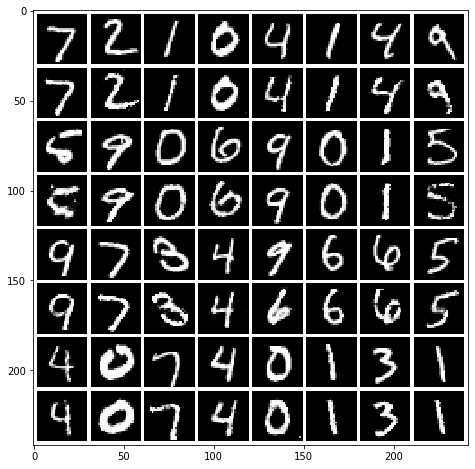

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


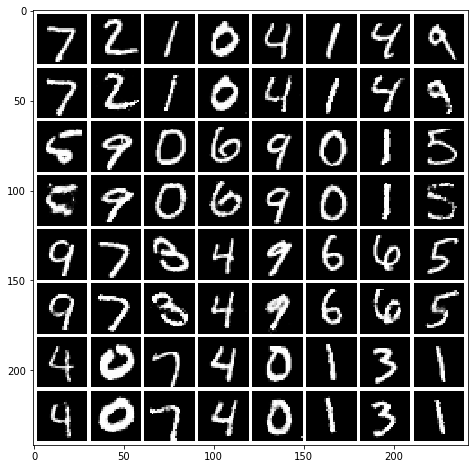

Signal error:
  MSE: 0.029826445992057415, std: 0.021147923310750927
  MAE: 0.0541021949820788, std: 0.0269461730751329
  SSIM: 0.767985641999329, std: 0.13717231996384957
  Sharpness: 0.10850535674898629, std: 0.03408023365878034
  PhCo-MSE: 0.026324266399115004, std: 0.017245178090685397
  PhCo-MAE: 0.04990621871456824, std: 0.022285975927780033
  PhCo-SSIM: 0.7881442426250926, std: 0.11607048492132419
  CroCo-MSE: 0.02278479061124017, std: 0.011966751206792327
  CroCo-MAE: 0.045877033105170995, std: 0.017764545357028313
  CroCo-SSIM: 0.811183842348013, std: 0.08957537236037964

Magnitude error:
  MSE Magnitude: 5.319048569344269, std: 3.0441832541997416

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02983 | 0.05410 | 0.7680 | 0.1085 | 0.02632 | 0.04991 | 0.7881 | 0.02278 | 0.04588 | 0.8112 | 5.319 |
Start training with ts of 60000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


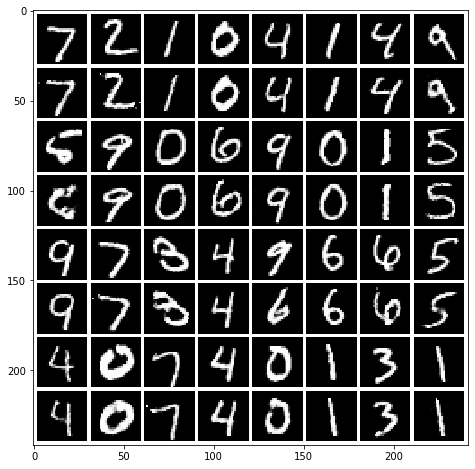

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


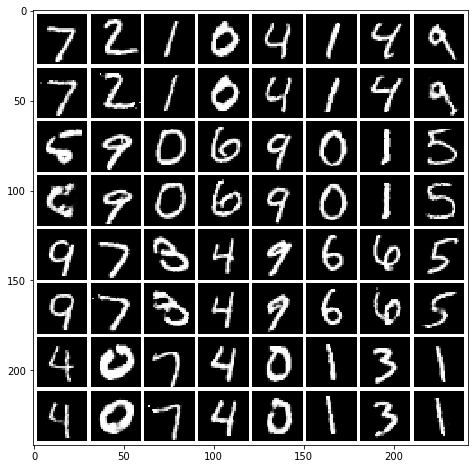

Signal error:
  MSE: 0.02807595635454163, std: 0.020269667196006164
  MAE: 0.052569525762010016, std: 0.025785957409985343
  SSIM: 0.7762378540178312, std: 0.1336443708429347
  Sharpness: 0.10137583189013487, std: 0.03287476004167478
  PhCo-MSE: 0.024060800547886174, std: 0.016472003820090782
  PhCo-MAE: 0.047760887156073295, std: 0.02144982901795092
  PhCo-SSIM: 0.8001853365522646, std: 0.11052390881973112
  CroCo-MSE: 0.020863371585392088, std: 0.011441122049372417
  CroCo-MAE: 0.04398294792008528, std: 0.017108646556826958
  CroCo-SSIM: 0.8212724625982617, std: 0.08711165645955277

Magnitude error:
  MSE Magnitude: 4.75615895660826, std: 2.887800353484566

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02808 | 0.05257 | 0.7762 | 0.1014 | 0.02406 | 0.04776 | 0.8002 | 0.02086 | 0.04398 | 0.8213 | 4.756 |
Start training with ts of 60000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


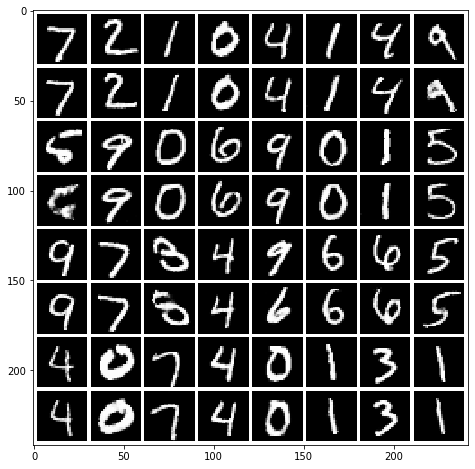

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


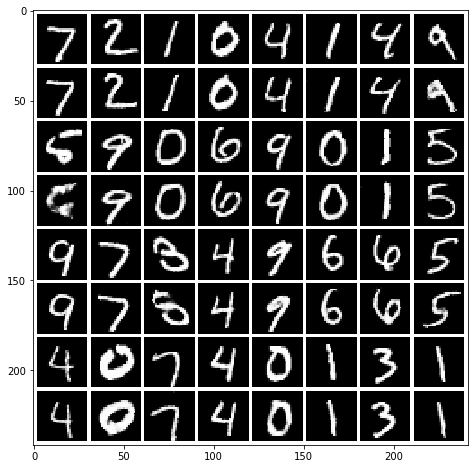

Signal error:
  MSE: 0.02620957886369979, std: 0.020005192804270495
  MAE: 0.05040928365997388, std: 0.026034801737569124
  SSIM: 0.789013934091431, std: 0.13404404879454715
  Sharpness: 0.09653908848612897, std: 0.03223752945116666
  PhCo-MSE: 0.02237637873145104, std: 0.018472522223123733
  PhCo-MAE: 0.04564950473286444, std: 0.023544651158870413
  PhCo-SSIM: 0.8139203646730028, std: 0.11540117153884237
  CroCo-MSE: 0.019005908750159506, std: 0.010913951853407202
  CroCo-MAE: 0.041717061183589976, std: 0.0169979791947916
  CroCo-SSIM: 0.8339891640990177, std: 0.08549646575215339

Magnitude error:
  MSE Magnitude: 4.185118245004866, std: 2.6438482405656005

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02621 | 0.05041 | 0.7890 | 0.09654 | 0.02238 | 0.04565 | 0.8139 | 0.01901 | 0.04172 | 0.8340 | 4.185 |


In [11]:
### LOAD MODEL ####

train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
gen_sizes = [512, 1024, 2048]
disc_sizes = [16, 32, 64]

for ts in train_sizes:
    for gs, ds in zip(gen_sizes, disc_sizes):
        print("Start training with ts of", ts, "and gs of", gs)

        gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=gs)

        # TODO: map storage location to correct GPU!
        name = "FCGenerator{}MNIST_{}".format(gs, ts)
        gen.load_state_dict(torch.load("../cache/cGAN/" + name + ".sd",
                                       map_location={'cuda:0': device.__str__()}));
        
        # Calculate test predictions 
        test_predicted, test_original = test_generator(gen, device, dataloader['test'])
        
        # Print predictions #
        to_plot = np.stack([test_original[:32, 0].reshape(4, 8, 28, 28), 
                            test_predicted[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/mnist/" + name + ".png")
        
        print("Registered:")
        results_reg = register_croco(test_predicted[:32], test_original[:32])
        to_plot = np.stack([test_original[:32, 0].reshape(4, 8, 28, 28), 
                            results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/mnist/" + name + ".png")
        
        # Benchmark test predictions #
        benchmark(pred=test_predicted[:1024], true=test_original[:1024], check_all=True)

## Evaluation for different cGAN models (random z and 1024 samples)

| ts | gs | MSE | MAE | SSIM | SHRP | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magn |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 32 | 512 | 0.06220 | 0.1313 | 0.3097 | 0.1450 | 0.06939 | 0.1399 | 0.3086 | 0.05059 | 0.1185 | 0.3886 | 19.51 |
| 32 | 1024 | 0.06436 | 0.1237 | 0.3421 | 0.1394 | 0.06715 | 0.1272 | 0.3619 | 0.05040 | 0.1083 | 0.4371 | 18.26 |
| 32 | 2048 | 0.06534 | 0.1208 | 0.3582 | 0.1385 | 0.06787 | 0.1238 | 0.3808 | 0.05017 | 0.1039 | 0.4601 | 17.29 |
| 64 | 512 | 0.05905 | 0.1109 | 0.4189 | 0.1349 | 0.06517 | 0.1183 | 0.4121 | 0.04754 | 0.09811 | 0.4956 | 18.36 |
| 64 | 1024 | 0.05735 | 0.1064 | 0.4485 | 0.1307 | 0.05948 | 0.1090 | 0.4592 | 0.04429 | 0.09169 | 0.5347 | 16.17 |
| 64 | 2048 | 0.05729 | 0.1048 | 0.4598 | 0.1298 | 0.05806 | 0.1059 | 0.4761 | 0.04356 | 0.08937 | 0.5495 | 15.28 |
| 128 | 512 | 0.05513 | 0.1053 | 0.4483 | 0.1342 | 0.06186 | 0.1132 | 0.4347 | 0.04435 | 0.09317 | 0.5197 | 16.52 |
| 128 | 1024 | 0.05273 | 0.09949 | 0.4915 | 0.1281 | 0.05625 | 0.1035 | 0.4925 | 0.04100 | 0.08614 | 0.5691 | 14.77 |
| 128 | 2048 | 0.05234 | 0.09735 | 0.5072 | 0.1275 | 0.05512 | 0.1005 | 0.5117 | 0.04017 | 0.08355 | 0.5883 | 13.35 |
| 256 | 512 | 0.05311 | 0.09866 | 0.5007 | 0.1297 | 0.06151 | 0.1081 | 0.4748 | 0.04336 | 0.08766 | 0.5656 | 16.24 |
| 256 | 1024 | 0.04835 | 0.09281 | 0.5383 | 0.1240 | 0.05186 | 0.09664 | 0.5338 | 0.03789 | 0.08072 | 0.6088 | 13.56 |
| 256 | 2048 | 0.04780 | 0.08974 | 0.5525 | 0.1223 | 0.04904 | 0.09086 | 0.5584 | 0.03666 | 0.07680 | 0.6289 | 12.21 |
| 512 | 512 | 0.05292 | 0.09779 | 0.5076 | 0.1323 | 0.06252 | 0.1085 | 0.4731 | 0.04430 | 0.08807 | 0.5635 | 16.39 |
| 512 | 1024 | 0.04653 | 0.08806 | 0.5670 | 0.1232 | 0.05111 | 0.09301 | 0.5541 | 0.03712 | 0.07715 | 0.6302 | 12.78 |
| 512 | 2048 | 0.04469 | 0.08393 | 0.5931 | 0.1178 | 0.04605 | 0.08508 | 0.5957 | 0.03432 | 0.07174 | 0.6624 | 11.02 |
| 1000 | 512 | 0.04892 | 0.09102 | 0.5548 | 0.1290 | 0.05896 | 0.1021 | 0.5142 | 0.04075 | 0.08172 | 0.6074 | 14.39 |
| 1000 | 1024 | 0.04535 | 0.08349 | 0.5940 | 0.1256 | 0.05074 | 0.08913 | 0.5794 | 0.03624 | 0.07294 | 0.6530 | 11.12 |
| 1000 | 2048 | 0.04310 | 0.07828 | 0.6216 | 0.1177 | 0.04396 | 0.07875 | 0.6278 | 0.03341 | 0.06699 | 0.6858 | 9.899 |
| 2000 | 512 | 0.04524 | 0.07922 | 0.6222 | 0.1239 | 0.05111 | 0.08540 | 0.6021 | 0.03663 | 0.06931 | 0.6761 | 10.77 |
| 2000 | 1024 | 0.04164 | 0.07290 | 0.6554 | 0.1159 | 0.04245 | 0.07335 | 0.6552 | 0.03253 | 0.06233 | 0.7117 | 9.105 |
| 2000 | 2048 | 0.04094 | 0.07213 | 0.6425 | 0.1170 | 0.04369 | 0.07469 | 0.6368 | 0.03108 | 0.06060 | 0.7014 | 8.014 |
| 5000 | 512 | 0.04091 | 0.06959 | 0.6757 | 0.1186 | 0.04125 | 0.06956 | 0.6774 | 0.03219 | 0.05956 | 0.7281 | 8.374 |
| 5000 | 1024 | 0.03973 | 0.06783 | 0.6672 | 0.1193 | 0.03782 | 0.06537 | 0.6790 | 0.03042 | 0.05710 | 0.7214 | 7.534 |
| 5000 | 2048 | 0.03691 | 0.06515 | 0.6815 | 0.1137 | 0.03473 | 0.06226 | 0.6986 | 0.02783 | 0.05448 | 0.7377 | 6.867 |
| 10000 | 512 |  0.03735 | 0.06391 | 0.7071 | 0.1166 | 0.03685 | 0.06298 | 0.7139 | 0.02936 | 0.05472 | 0.7552 | 7.234 |
| 10000 | 1024 | 0.03600 | 0.06273 | 0.6877 | 0.1164 | 0.03456 | 0.06069 | 0.7031 | 0.02790 | 0.05330 | 0.7389 | 6.761 |
| 10000 | 2048 | 0.03340 | 0.06050 | 0.7199 | 0.1096 | 0.03117 | 0.05740 | 0.7399 | 0.02542 | 0.05095 | 0.7715 | 6.159 |
| 30000 | 512 | 0.03265 | 0.05795 | 0.7454 | 0.1119 | 0.03104 | 0.05571 | 0.7597 | 0.02529 | 0.04942 | 0.7902 | 5.988 |
| 30000 | 1024 | 0.03034 | 0.05531 | 0.7599 | 0.1049 | 0.02692 | 0.05104 | 0.7811 | 0.02273 | 0.04631 | 0.8066 | 5.202 |
| 30000 | 2048 | 0.02809 | 0.05342 | 0.7730 | 0.09861 | 0.02382 | 0.04800 | 0.8025 | 0.02041 | 0.04406 | 0.8228 | 4.572 |
| 60000 | 512 | 0.02983 | 0.05410 | 0.7680 | 0.1085 | 0.02632 | 0.04991 | 0.7881 | 0.02278 | 0.04588 | 0.8112 | 5.319 |
| 60000 | 1024 | 0.02808 | 0.05257 | 0.7762 | 0.1014 | 0.02406 | 0.04776 | 0.8002 | 0.02086 | 0.04398 | 0.8213 | 4.756 |
| 60000 | 2048 | 0.02621 | 0.05041 | 0.7890 | 0.09654 | 0.02238 | 0.04565 | 0.8139 | 0.01901 | 0.04172 | 0.8340 | 4.185 |

In [9]:
# Latent z optimization

def genopt(sample_magnitudes, gen, disc, device, init_x=None, max_steps=5000, max_loss=0.0, mue=1.0, lr=1.0):
    
    if disc is not None:
        disc.to(device)
        disc.eval()
    gen.to(device)
    gen.eval()
    
    if init_x is None:
        z = torch.randn((sample_magnitudes.shape), requires_grad=True, device=device)
    else:
        raise NotImplementedError
    
    optimizer = optim.Adam([z], lr=lr)
    
    losses = []
    last_out = gen(torch.cat([z, sample_magnitudes], dim=1))
    
    for i in range(max_steps):
        magnitudes = calc_mags(last_out)

        mse_all = torch.mean((magnitudes - sample_magnitudes) ** 2, dim=(1, 2, 3))
        reconstruction = torch.sum(mse_all)
        #adversarial = -torch.mean(torch.log(disc(torch.cat([last_out, sample_magnitudes], dim=1))))
        #loss = reconstruction + mue * adversarial
        loss = reconstruction + mue * torch.mean(z ** 2)
        
        if loss < max_loss:
            break
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        last_out = gen(torch.cat([z, sample_magnitudes], dim=1))
        
        losses.append(loss.item())
    
    return last_out.detach(), losses, mse_all

Start optimization with ts of 32 and gs of 512
Version 0.4
Batch 1/1 finished


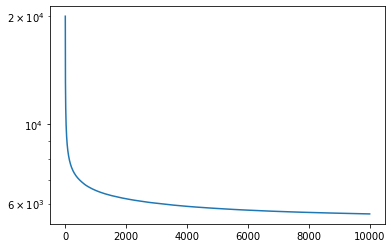

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


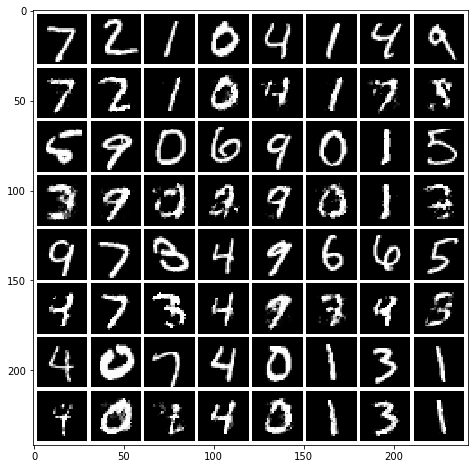

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


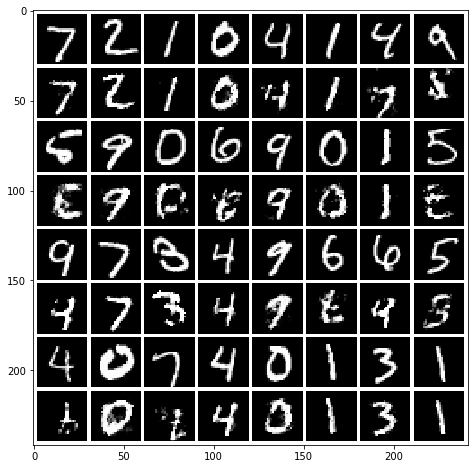

Start optimization with ts of 32 and gs of 1024
Version 0.4
Batch 1/1 finished


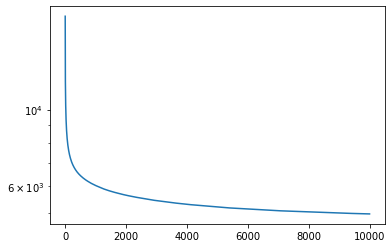

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


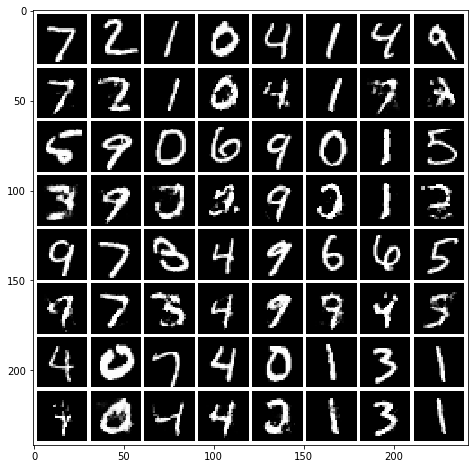

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


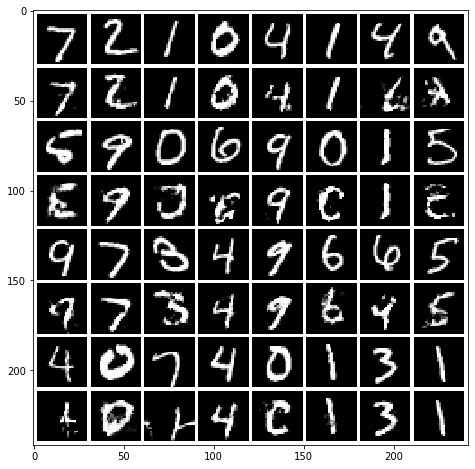

Start optimization with ts of 32 and gs of 2048
Version 0.4
Batch 1/1 finished


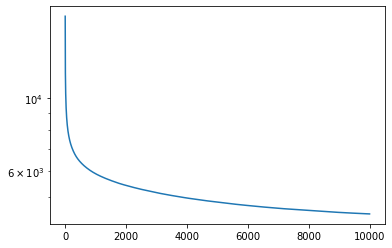

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


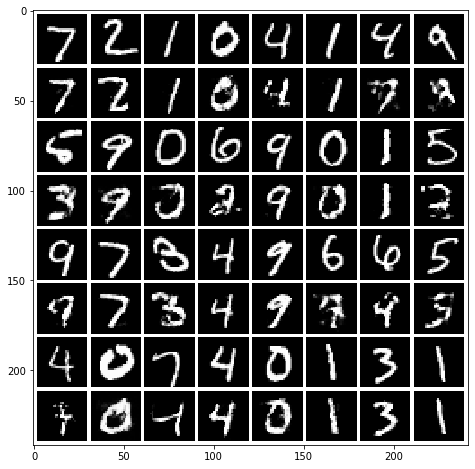

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


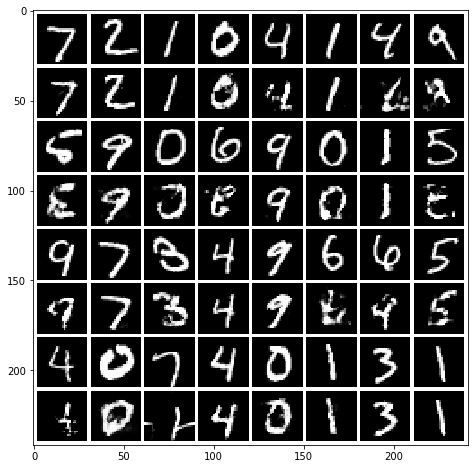

Start optimization with ts of 64 and gs of 512
Version 0.4
Batch 1/1 finished


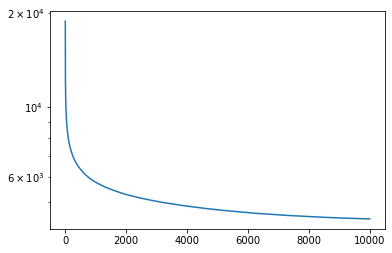

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


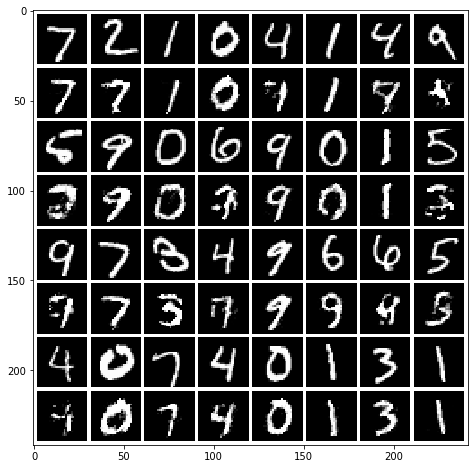

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


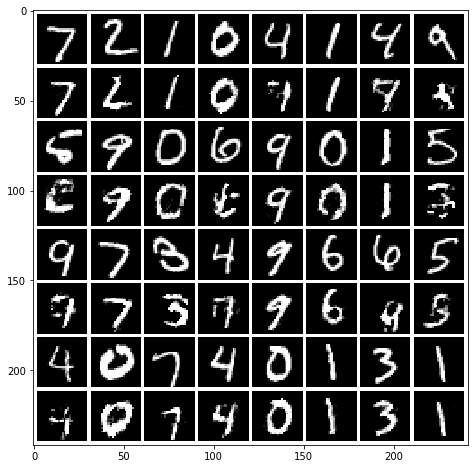

Start optimization with ts of 64 and gs of 1024
Version 0.4
Batch 1/1 finished


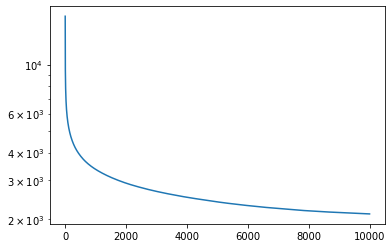

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


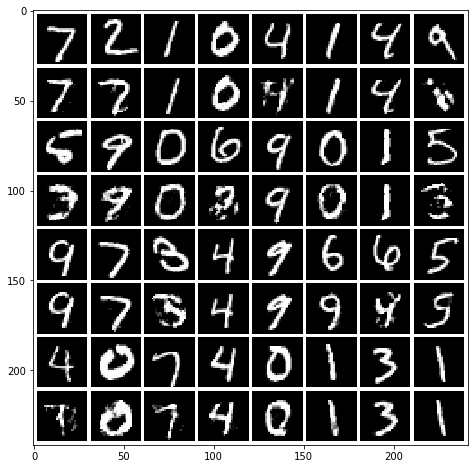

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


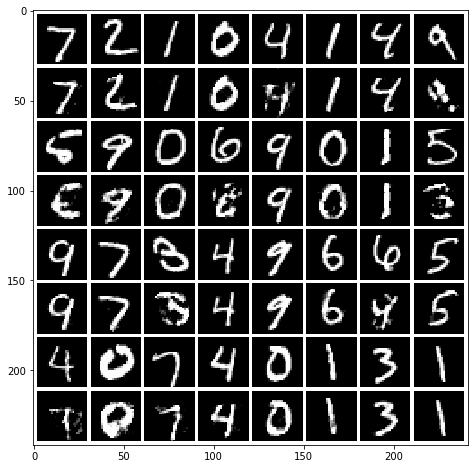

Start optimization with ts of 64 and gs of 2048
Version 0.4
Batch 1/1 finished


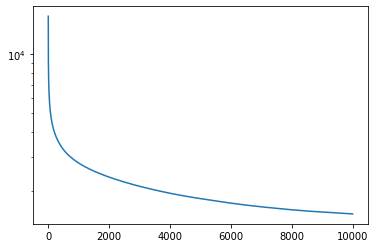

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


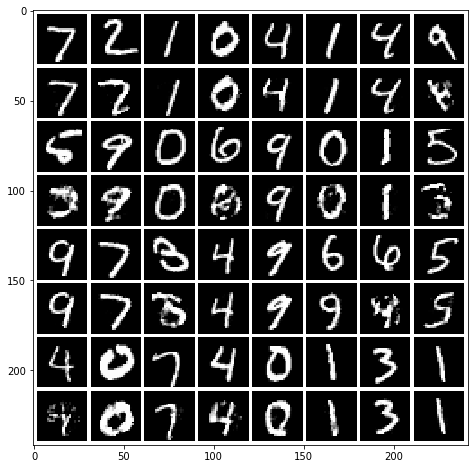

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


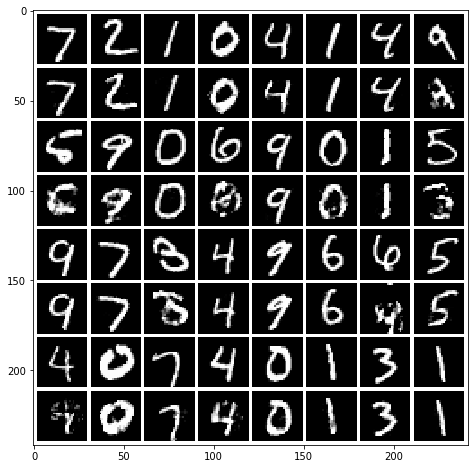

Start optimization with ts of 128 and gs of 512
Version 0.4
Batch 1/1 finished


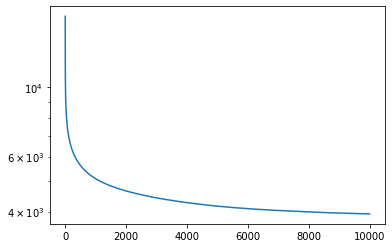

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


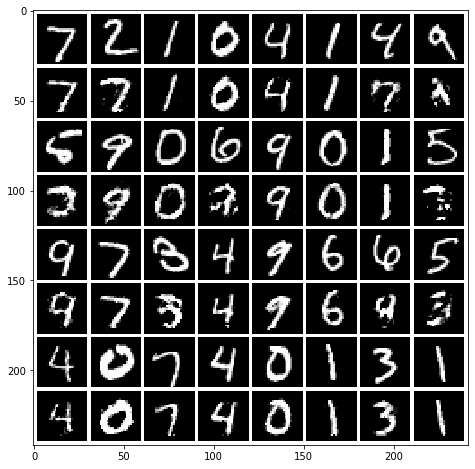

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


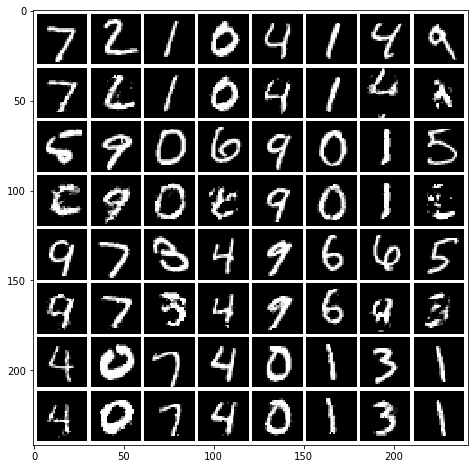

Start optimization with ts of 128 and gs of 1024
Version 0.4
Batch 1/1 finished


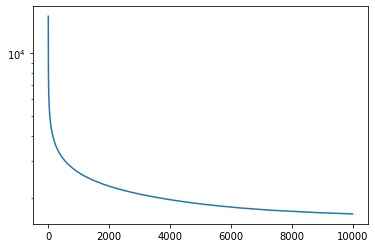

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


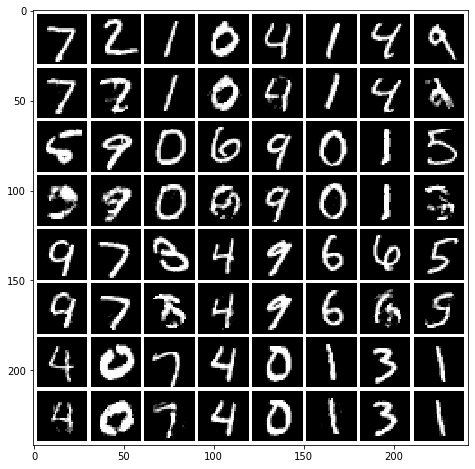

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


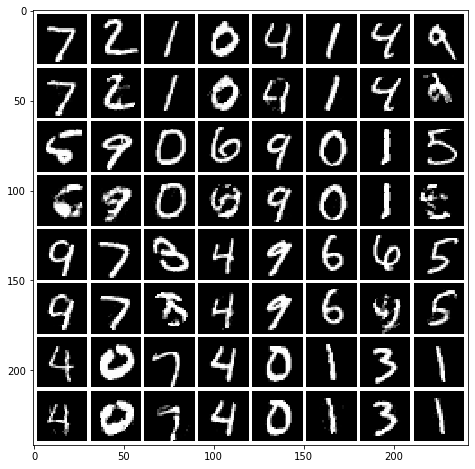

Start optimization with ts of 128 and gs of 2048
Version 0.4
Batch 1/1 finished


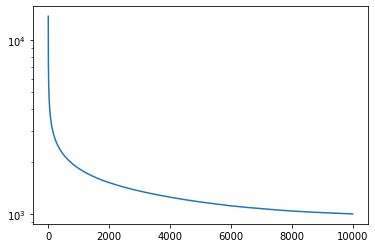

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


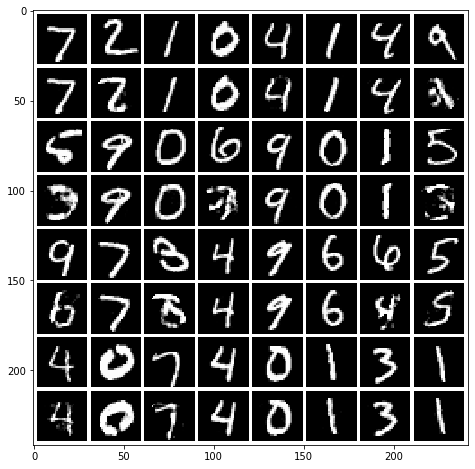

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


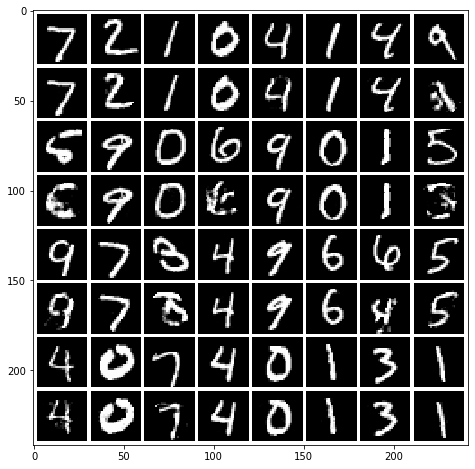

Start optimization with ts of 256 and gs of 512
Version 0.4
Batch 1/1 finished


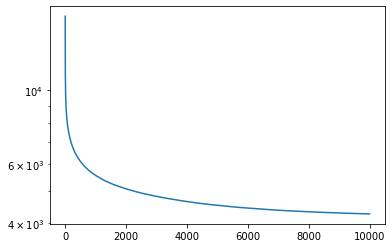

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


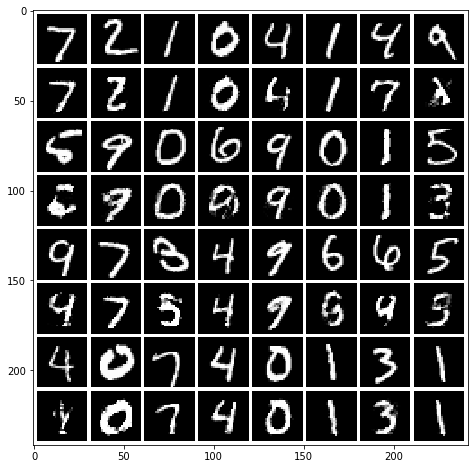

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


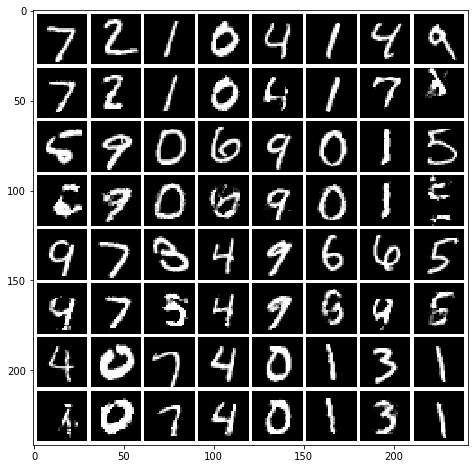

Start optimization with ts of 256 and gs of 1024
Version 0.4
Batch 1/1 finished


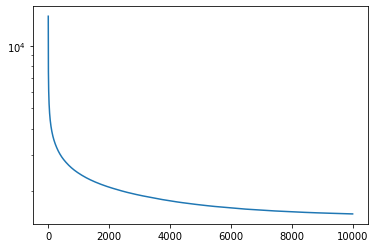

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


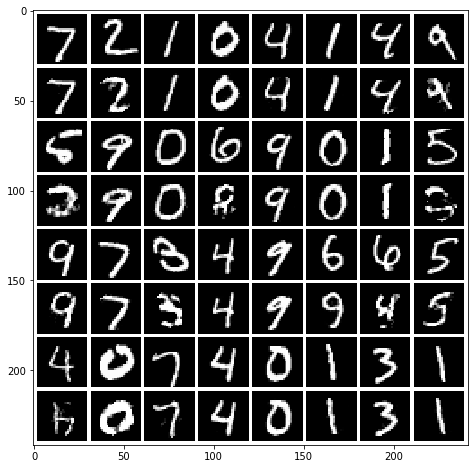

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


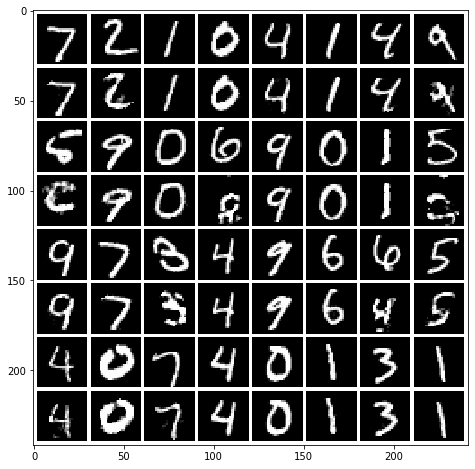

Start optimization with ts of 256 and gs of 2048
Version 0.4
Batch 1/1 finished


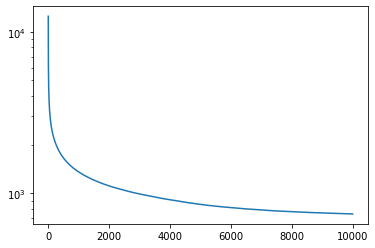

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


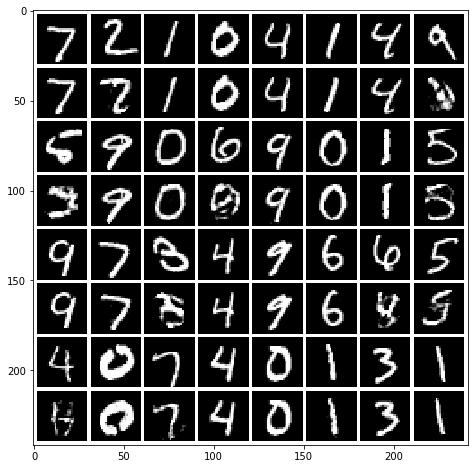

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


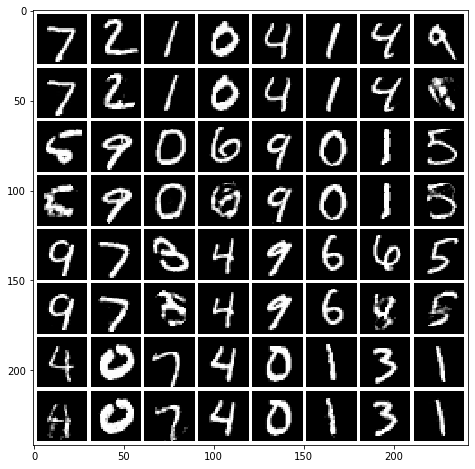

Start optimization with ts of 512 and gs of 512
Version 0.4
Batch 1/1 finished


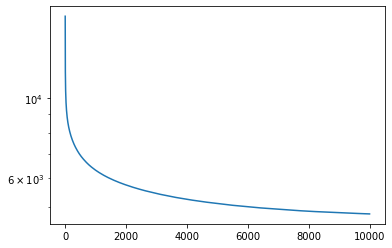

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


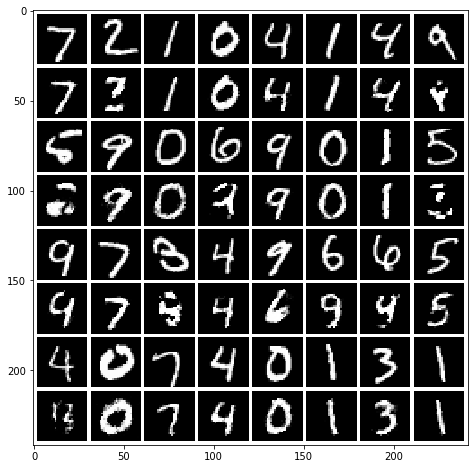

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


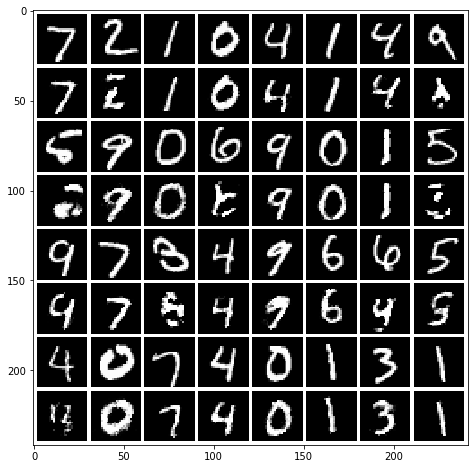

Start optimization with ts of 512 and gs of 1024
Version 0.4
Batch 1/1 finished


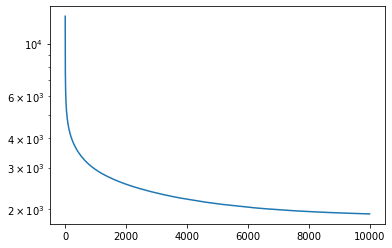

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


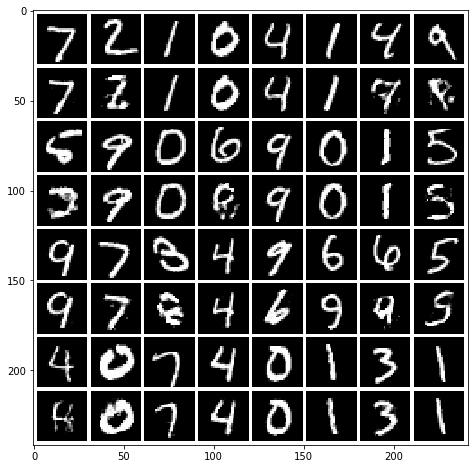

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


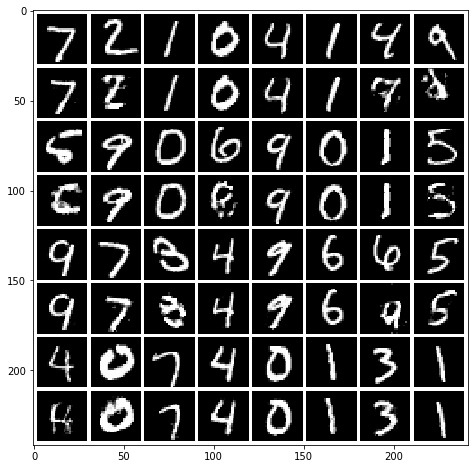

Start optimization with ts of 512 and gs of 2048
Version 0.4
Batch 1/1 finished


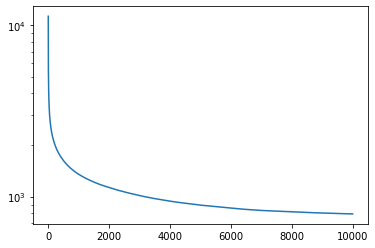

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


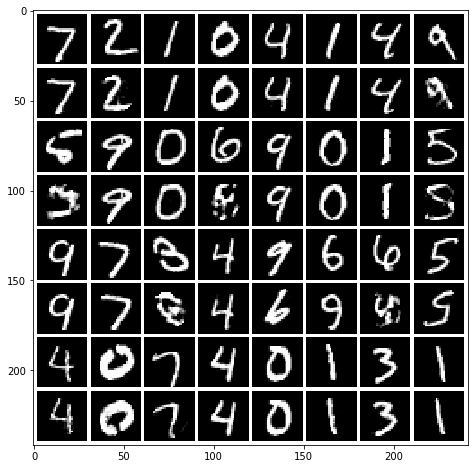

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


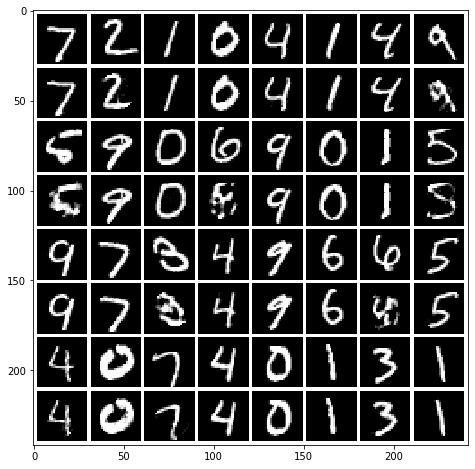

Start optimization with ts of 1000 and gs of 512
Version 0.4
Batch 1/1 finished


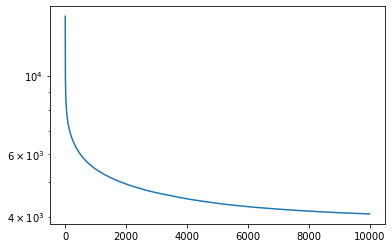

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


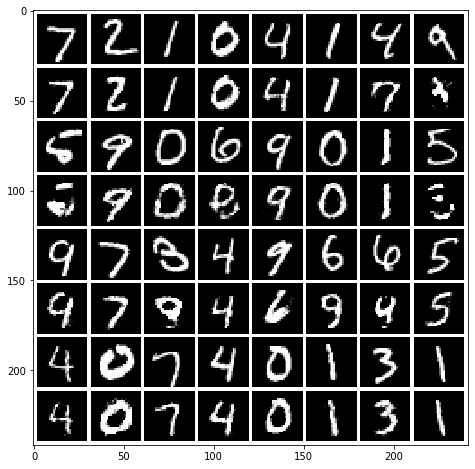

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


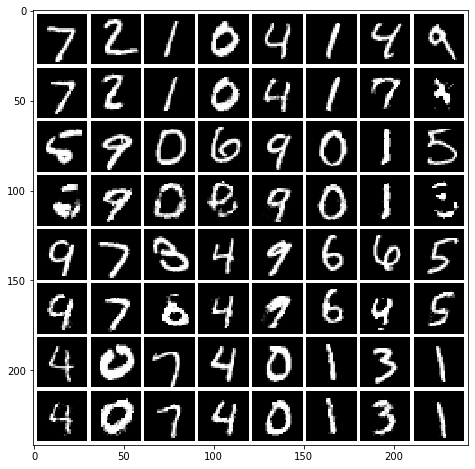

Start optimization with ts of 1000 and gs of 1024
Version 0.4
Batch 1/1 finished


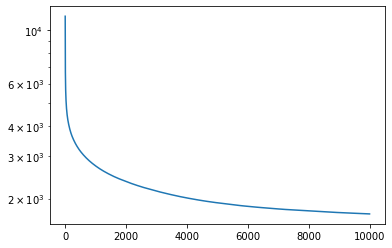

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


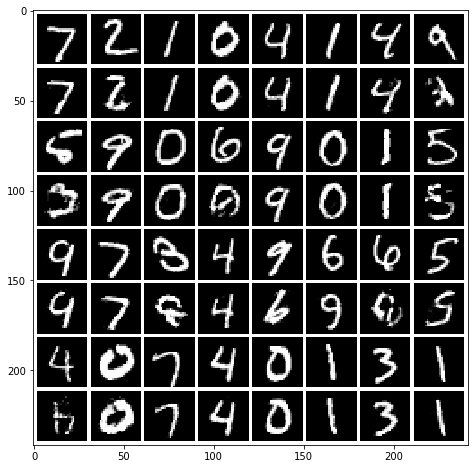

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


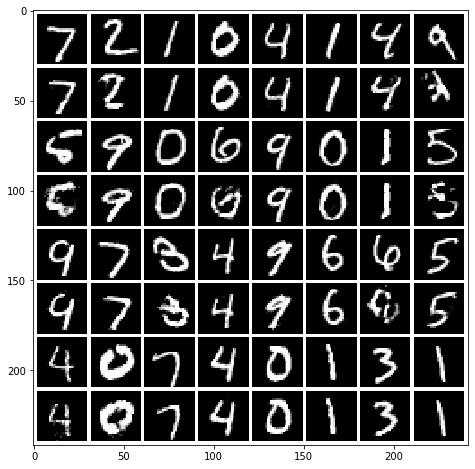

Start optimization with ts of 1000 and gs of 2048
Version 0.4
Batch 1/1 finished


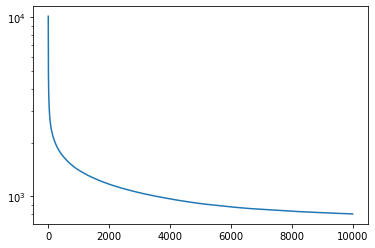

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


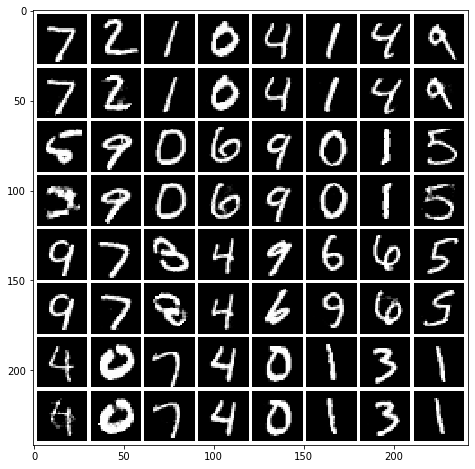

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


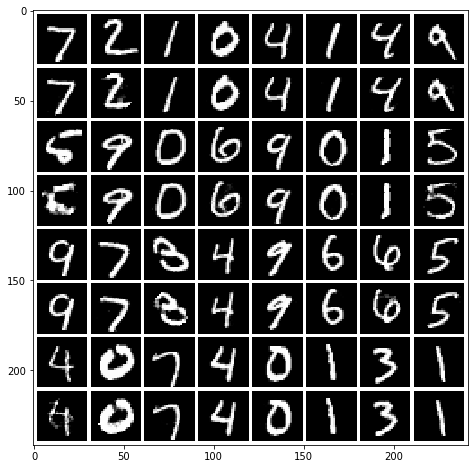

Start optimization with ts of 2000 and gs of 512
Version 0.4
Batch 1/1 finished


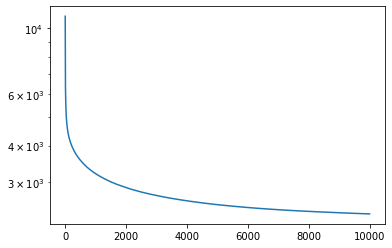

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


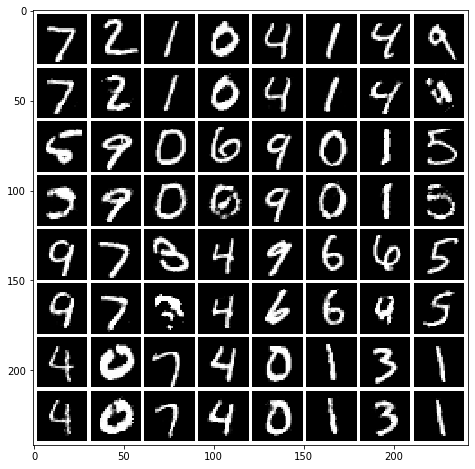

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


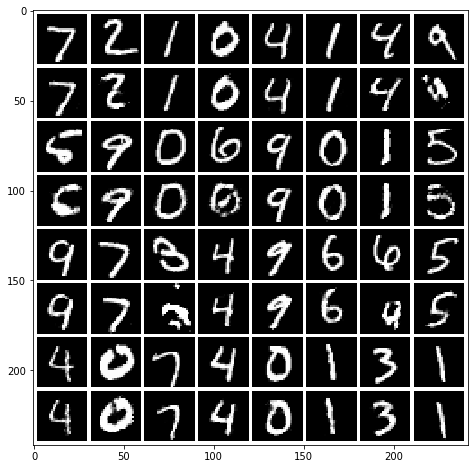

Start optimization with ts of 2000 and gs of 1024
Version 0.4
Batch 1/1 finished


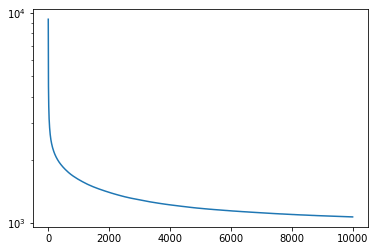

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


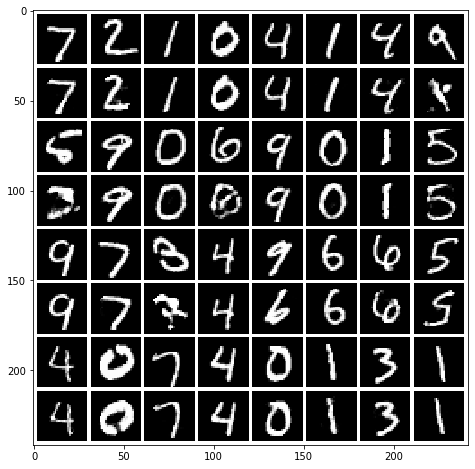

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


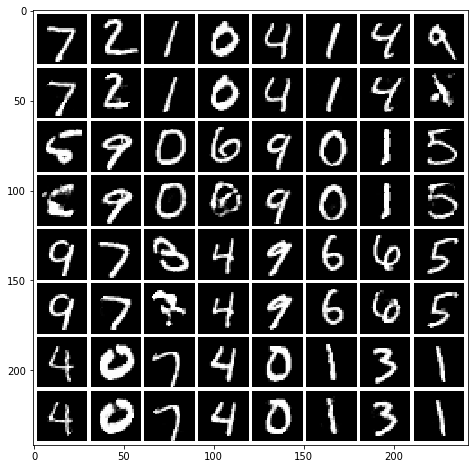

Start optimization with ts of 2000 and gs of 2048
Version 0.4
Batch 1/1 finished


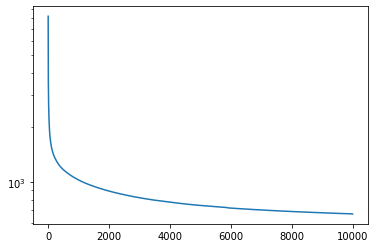

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


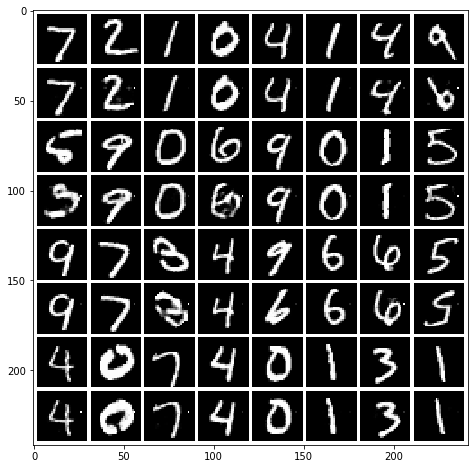

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


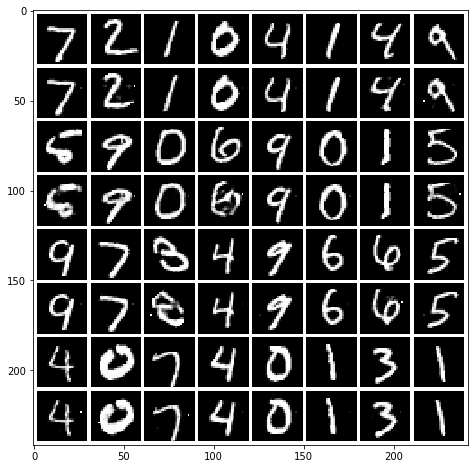

Start optimization with ts of 5000 and gs of 512
Version 0.4
Batch 1/1 finished


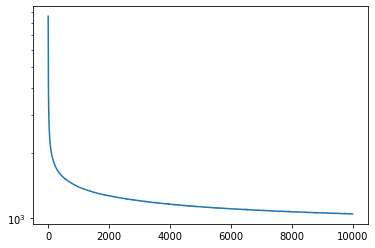

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


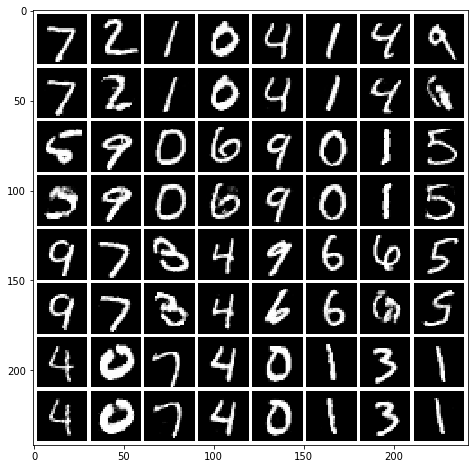

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


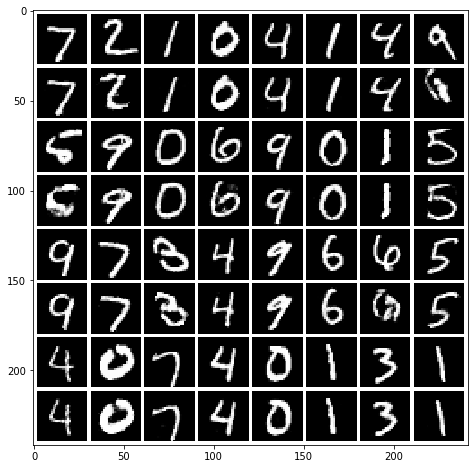

Start optimization with ts of 5000 and gs of 1024
Version 0.4
Batch 1/1 finished


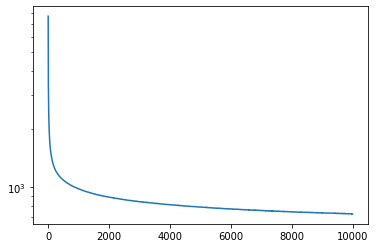

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


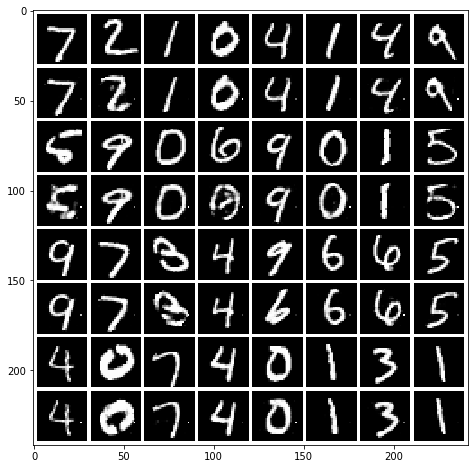

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


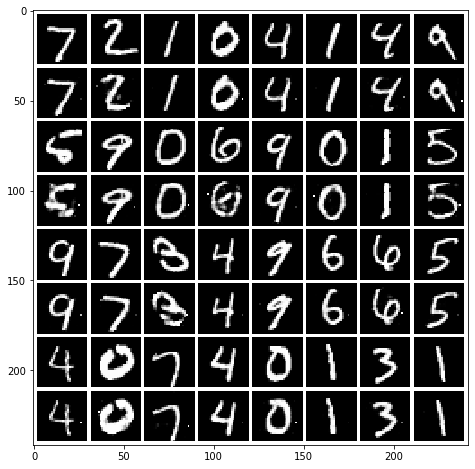

Start optimization with ts of 5000 and gs of 2048
Version 0.4
Batch 1/1 finished


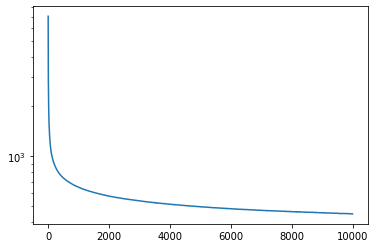

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


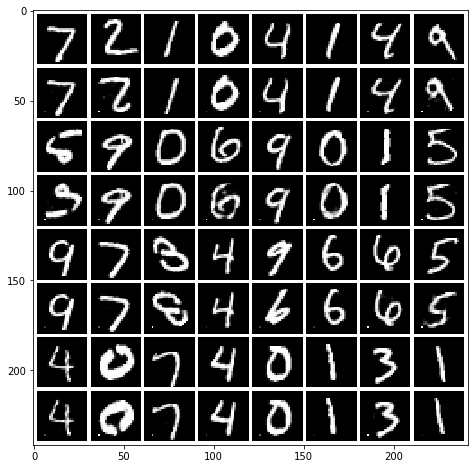

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


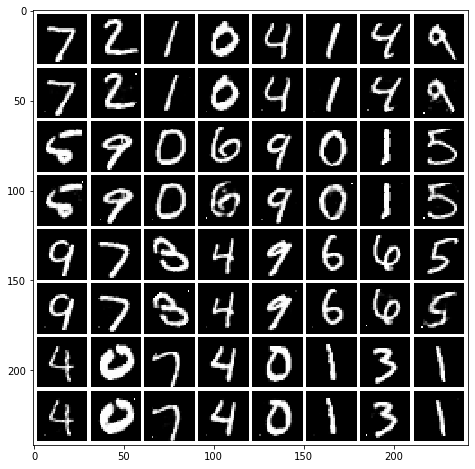

Start optimization with ts of 10000 and gs of 512
Version 0.4
Batch 1/1 finished


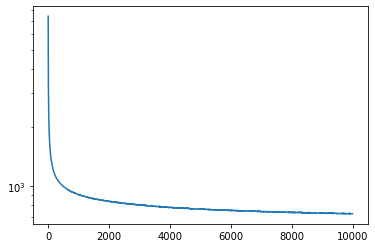

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


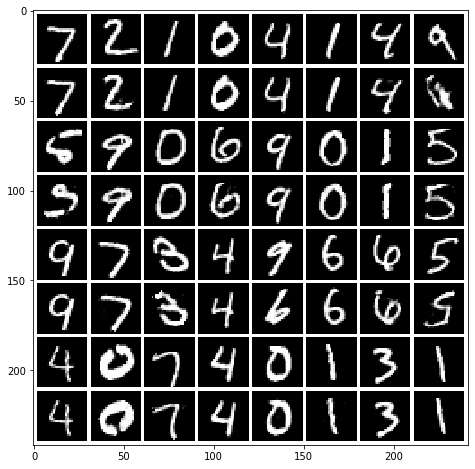

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


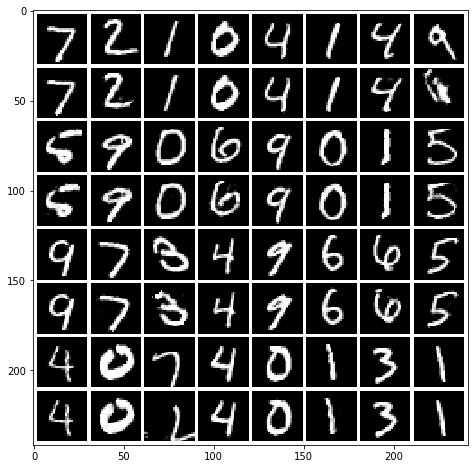

Start optimization with ts of 10000 and gs of 1024
Version 0.4
Batch 1/1 finished


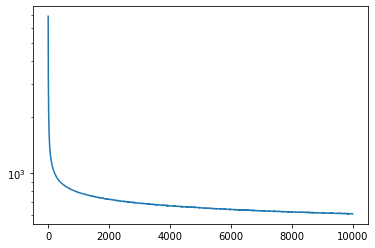

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


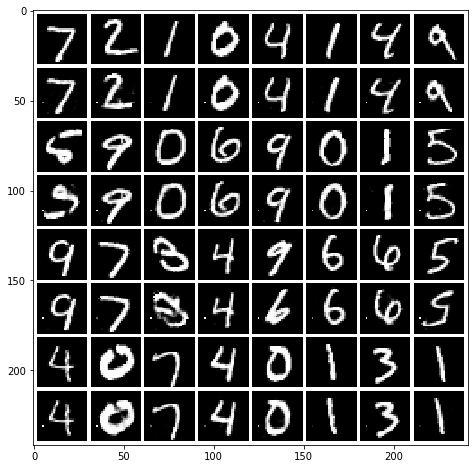

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


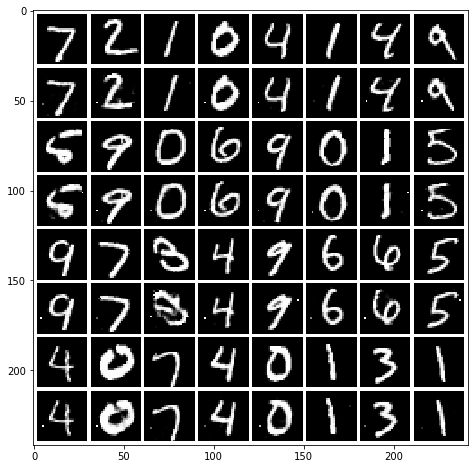

Start optimization with ts of 10000 and gs of 2048
Version 0.4
Batch 1/1 finished


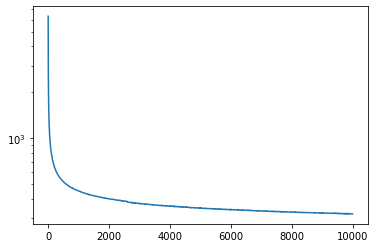

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


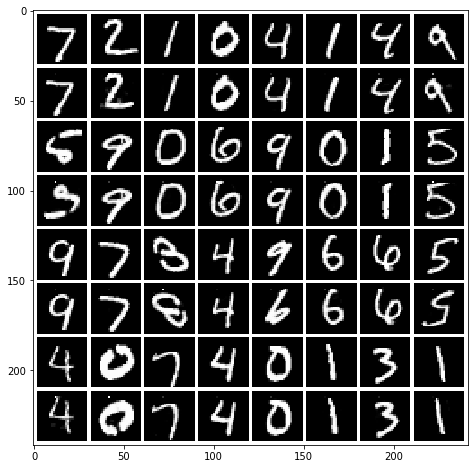

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


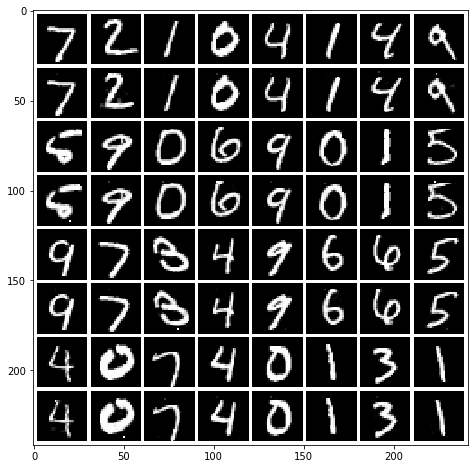

Start optimization with ts of 30000 and gs of 512
Version 0.4
Batch 1/1 finished


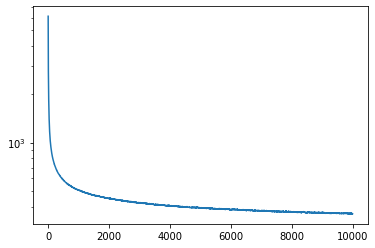

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


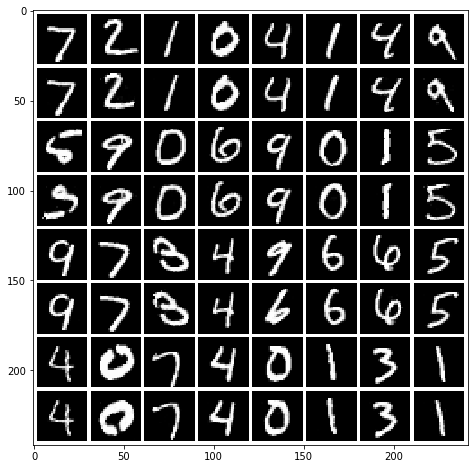

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


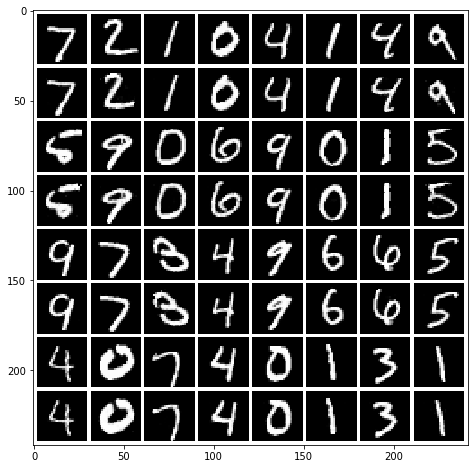

Start optimization with ts of 30000 and gs of 1024
Version 0.4
Batch 1/1 finished


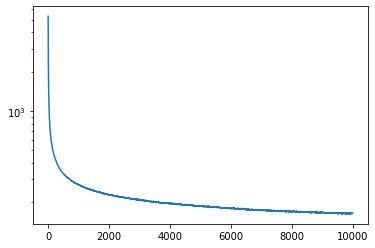

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


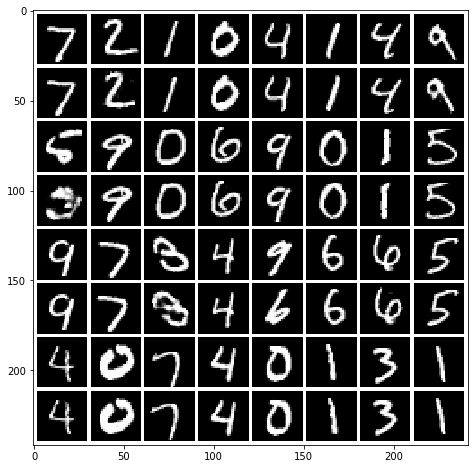

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


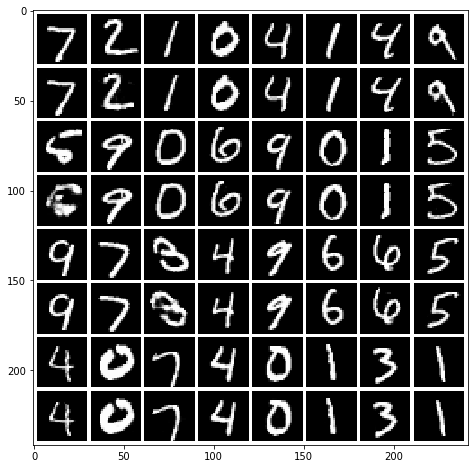

Start optimization with ts of 30000 and gs of 2048
Version 0.4
Batch 1/1 finished


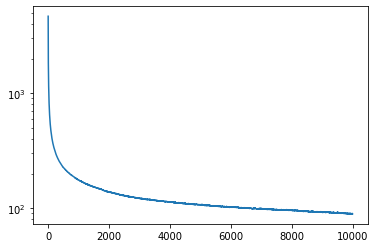

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


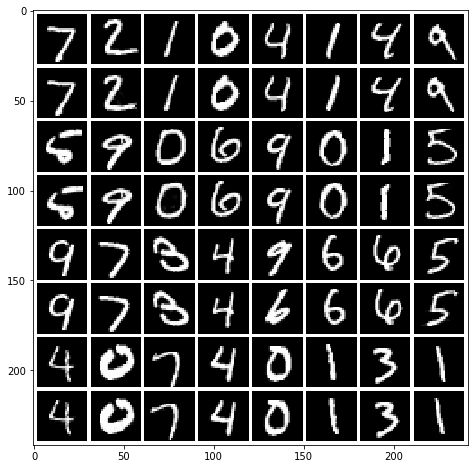

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


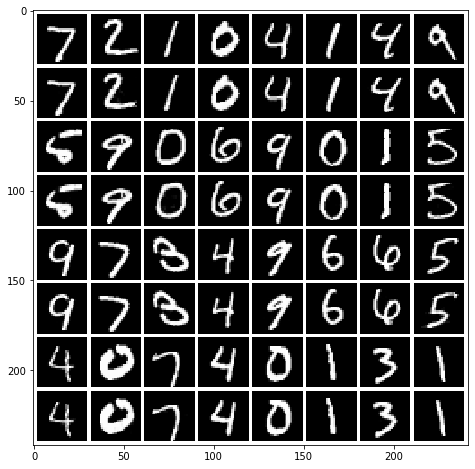

Start optimization with ts of 60000 and gs of 512
Version 0.4
Batch 1/1 finished


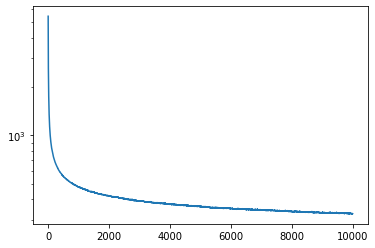

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


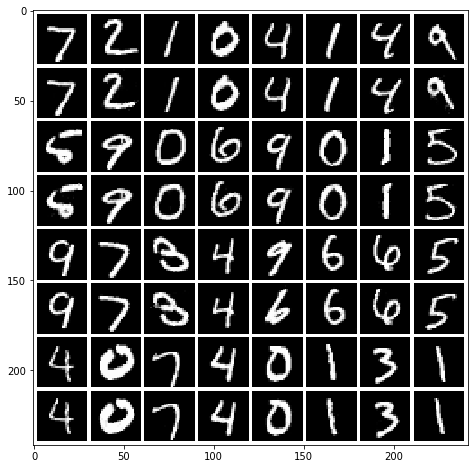

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


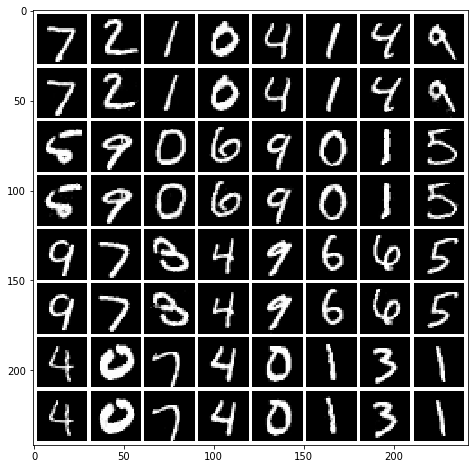

Start optimization with ts of 60000 and gs of 1024
Version 0.4
Batch 1/1 finished


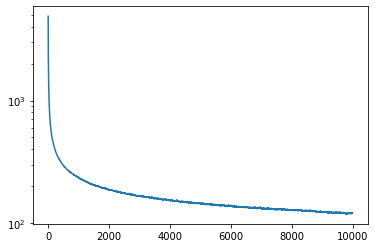

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


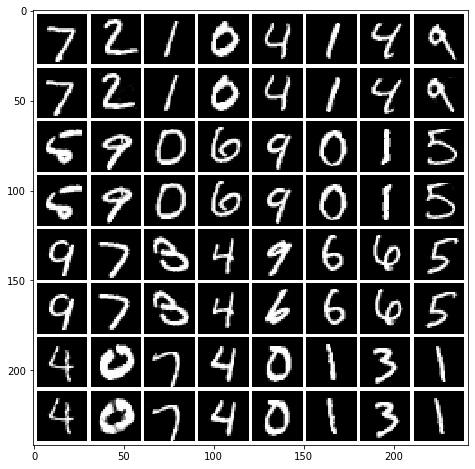

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


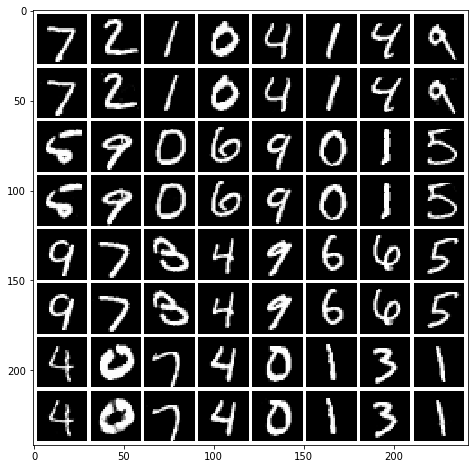

Start optimization with ts of 60000 and gs of 2048
Version 0.4
Batch 1/1 finished


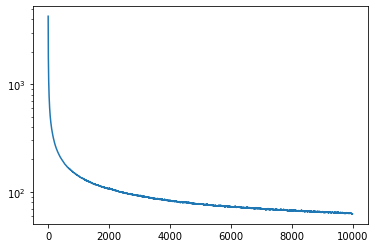

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


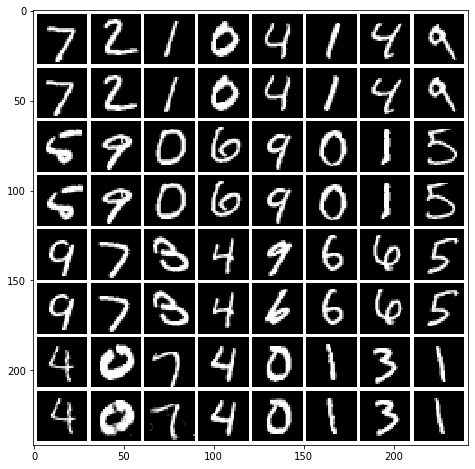

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


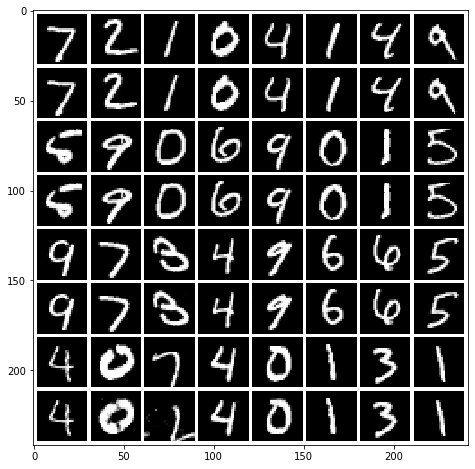

In [10]:
### Latent z optimization ###

train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
gen_sizes = [512, 1024, 2048]

num_batches = 1
batch_size = 1024
max_steps = 10000
max_loss = 0.0
mue = 0.0
lr = 1.0

dataloader, imsize = load(dataset, path='/home/shared/phase-retrieval/data/' + dataset, batch_size=batch_size)

for ts in train_sizes:
    for gs, ds in zip(gen_sizes, disc_sizes):
        print("Start optimization with ts of", ts, "and gs of", gs)

        ###
        
        gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=gs)

        name = "FCGenerator{}MNIST_{}".format(gs, ts)
        gen.load_state_dict(torch.load("../cache/cGAN/" + name + ".sd",
                                       map_location={'cuda:0': device.__str__()}));

        out_original = np.zeros((batch_size * num_batches, *imsize))
        out_results = np.zeros((batch_size * num_batches, *imsize))
        mse_all = np.full((batch_size * num_batches), np.inf)

        for batch_i, batch in enumerate(dataloader['test']):
            test_sample = batch.to(device)  
            test_magnitudes = calc_mags(test_sample)
            out_original[batch_size * batch_i : batch_size * batch_i + batch_size] = test_sample.cpu().numpy()


            cur_out_results, cur_loss, cur_mse_all = genopt(sample_magnitudes=test_magnitudes, gen=gen, disc=None, device=device,
                                                  max_steps=max_steps, max_loss=max_loss, mue=mue, lr=lr)
            cur_out_results = cur_out_results.cpu().numpy()

            out_results[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_out_results
            mse_all[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_mse_all.detach().cpu().numpy()

            print("Batch {0}/{1} finished".format(batch_i + 1, num_batches))
            if batch_i + 1 >= num_batches:
                break

        plt.semilogy(cur_loss)
        plt.show()

        # down here repeating savings:
        ###############################
        
        name = "FCGenerator{}MNIST_{}_10000latentSteps".format(gs, ts)

        pickle.dump(out_results, open("/home/shared/phase-retrieval/test/cGAN_MNIST/" + name + ".sd", "wb"))
        
        # Print predictions #
        to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                            out_results[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/mnist/" + name + ".png")
        
        print("Registered:")
        results_reg = register_croco(out_results[:32], out_original[:32])
        to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                            results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/mnist/" + name + ".png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Load latent opts with ts of 32 and gs of 512


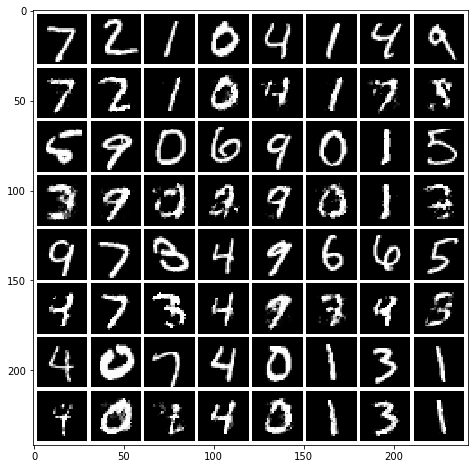

Registered:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


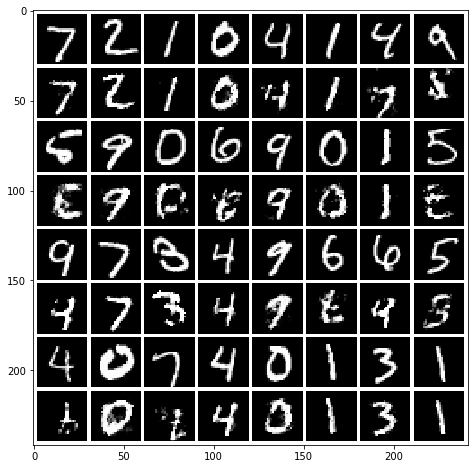

Signal error:
  MSE: 0.07647297001181264, std: 0.04000653221431874
  MAE: 0.10598114299569274, std: 0.04577029204443443
  SSIM: 0.4599137817310901, std: 0.22720088433647584
  Sharpness: 0.1349496967286491, std: 0.05137647551260238
  PhCo-MSE: 0.05813979836472601, std: 0.041973627293794114
  PhCo-MAE: 0.08583001945565916, std: 0.0491516898581201
  PhCo-SSIM: 0.5850157849532733, std: 0.2182661015660946
  CroCo-MSE: 0.04381431920759922, std: 0.026849940637995447
  CroCo-MAE: 0.07065462966266088, std: 0.034362544829258


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6445252906521972, std: 0.1784901630302702

Magnitude error:
  MSE Magnitude: 5.488738516272688, std: 3.523246737195877

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.07647 | 0.1060 | 0.4599 | 0.1349 | 0.05814 | 0.08583 | 0.5850 | 0.04381 | 0.07065 | 0.6445 | 5.489 |
Load latent opts with ts of 32 and gs of 1024


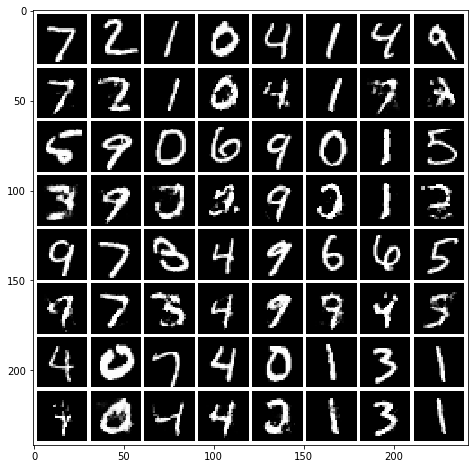

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


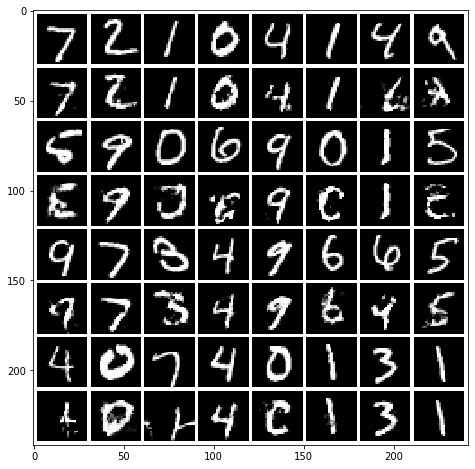

Signal error:
  MSE: 0.07532134095946784, std: 0.04006207131835589
  MAE: 0.10549391062847666, std: 0.04624117181729978
  SSIM: 0.46534835965542387, std: 0.23178877116140015
  Sharpness: 0.1295530488196271, std: 0.05117667700345016
  PhCo-MSE: 0.05464248139031776, std: 0.04024577252650999
  PhCo-MAE: 0.08250180319512976, std: 0.04826091828805429
  PhCo-SSIM: 0.605762454792494, std: 0.21892170944888167
  CroCo-MSE: 0.04163162126183312, std: 0.026260456960512914
  CroCo-MAE: 0.06865758197130821, std: 0.03452664105750549


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6605062923535664, std: 0.18009250738708385

Magnitude error:
  MSE Magnitude: 4.852771277071167, std: 3.3439171768283336

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.07532 | 0.1055 | 0.4653 | 0.1296 | 0.05464 | 0.08250 | 0.6058 | 0.04163 | 0.06866 | 0.6605 | 4.853 |
Load latent opts with ts of 32 and gs of 2048


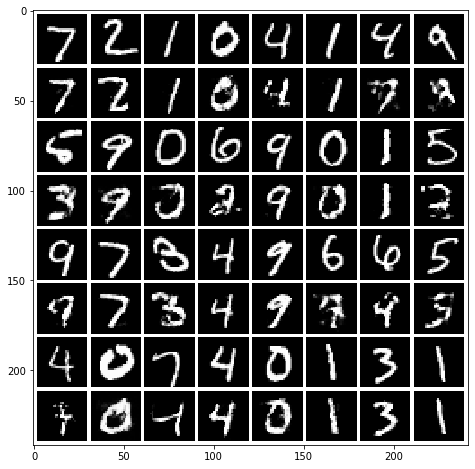

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


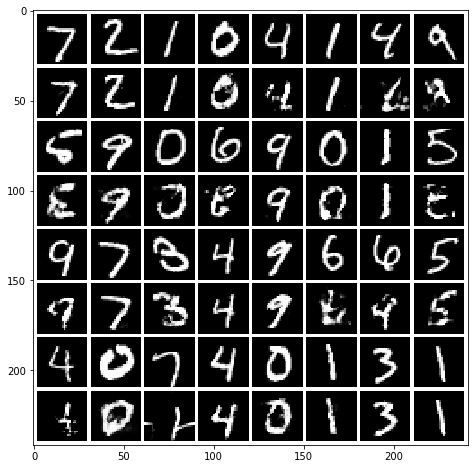

Signal error:
  MSE: 0.07470828098055728, std: 0.040255107320094054
  MAE: 0.10514867408982857, std: 0.04634070075053288
  SSIM: 0.4679989425213895, std: 0.23220748257598262
  Sharpness: 0.1266526873734072, std: 0.052448894121509305
  PhCo-MSE: 0.052425159355923553, std: 0.039601077181187785
  PhCo-MAE: 0.08015220054076384, std: 0.047793627187840124
  PhCo-SSIM: 0.6185830702638264, std: 0.2231797565032406
  CroCo-MSE: 0.03994482574077951, std: 0.026286659734330153
  CroCo-MAE: 0.06689079872618654, std: 0.034667462817058625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.671588861551772, std: 0.18241593923587027

Magnitude error:
  MSE Magnitude: 4.348751145458666, std: 3.2010149589158696

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.07471 | 0.1051 | 0.4680 | 0.1267 | 0.05243 | 0.08015 | 0.6186 | 0.03994 | 0.06689 | 0.6716 | 4.349 |
Load latent opts with ts of 64 and gs of 512


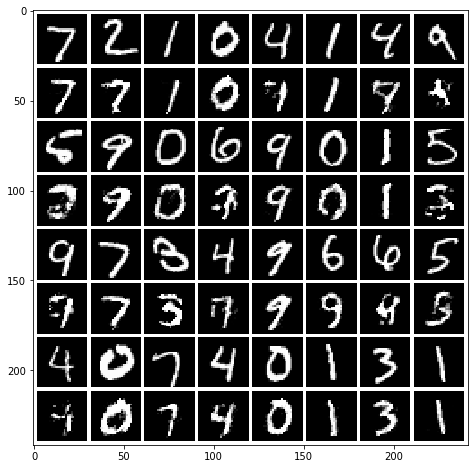

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


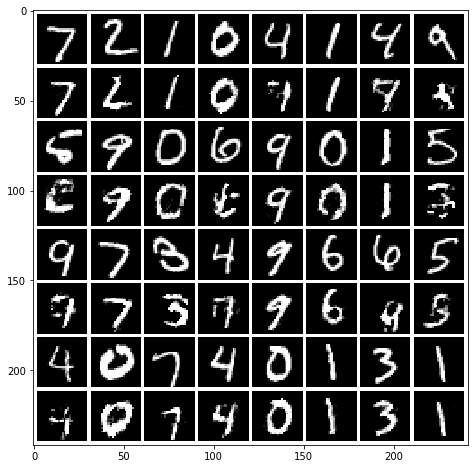

Signal error:
  MSE: 0.07030424279369783, std: 0.04287583592593103
  MAE: 0.09870628219377137, std: 0.048943929553571616
  SSIM: 0.5086395809420019, std: 0.24346363854483233
  Sharpness: 0.1262138383098761, std: 0.052576377908075046
  PhCo-MSE: 0.04858336329854644, std: 0.03698315603533926
  PhCo-MAE: 0.07457767986388475, std: 0.044093177441100494
  PhCo-SSIM: 0.643928910128144, std: 0.2119865971183539
  CroCo-MSE: 0.038155672987421896, std: 0.02540036541522106
  CroCo-MAE: 0.06342864558576314, std: 0.032955809192875954


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6916044092429595, std: 0.17490179937643544

Magnitude error:
  MSE Magnitude: 4.304344002713256, std: 3.026166169507778

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.07030 | 0.09871 | 0.5086 | 0.1262 | 0.04858 | 0.07458 | 0.6439 | 0.03816 | 0.06343 | 0.6916 | 4.304 |
Load latent opts with ts of 64 and gs of 1024


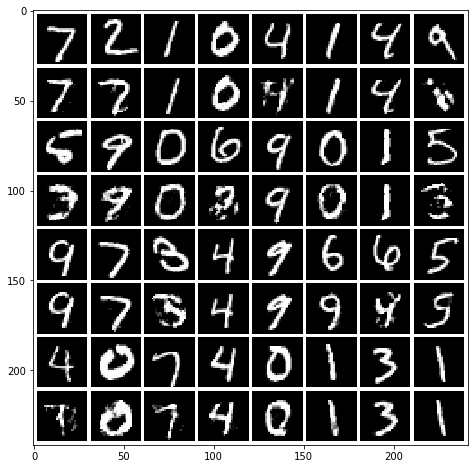

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


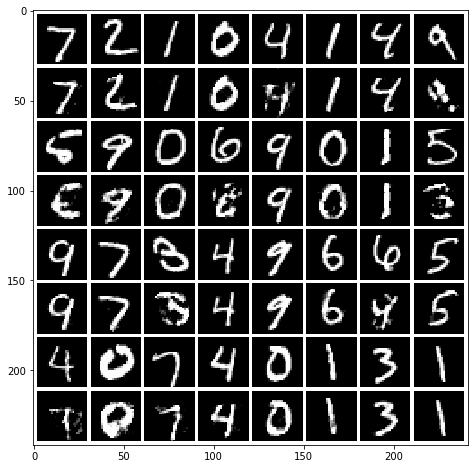

Signal error:
  MSE: 0.06559367603038957, std: 0.04441656025000637
  MAE: 0.0950096714013933, std: 0.051211544170989
  SSIM: 0.5388592035101689, std: 0.2565843688875855
  Sharpness: 0.10527607441110373, std: 0.05378192818528869
  PhCo-MSE: 0.03437362837805477, std: 0.03455057637482769
  PhCo-MAE: 0.05884899834574602, std: 0.0431229468256518
  PhCo-SSIM: 0.737465062801531, std: 0.2103686244376104
  CroCo-MSE: 0.027151374490182303, std: 0.023876734889712148
  CroCo-MAE: 0.05104743036939781, std: 0.03276405489169452


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7705584814539743, std: 0.17493546365500606

Magnitude error:
  MSE Magnitude: 2.060671393650644, std: 1.8260680265180715

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.06559 | 0.09501 | 0.5389 | 0.1053 | 0.03437 | 0.05885 | 0.7375 | 0.02715 | 0.05105 | 0.7706 | 2.061 |
Load latent opts with ts of 64 and gs of 2048


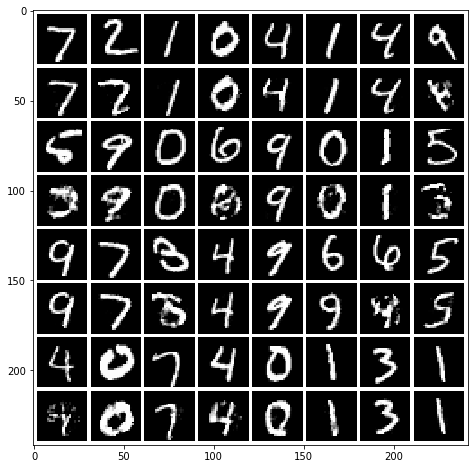

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


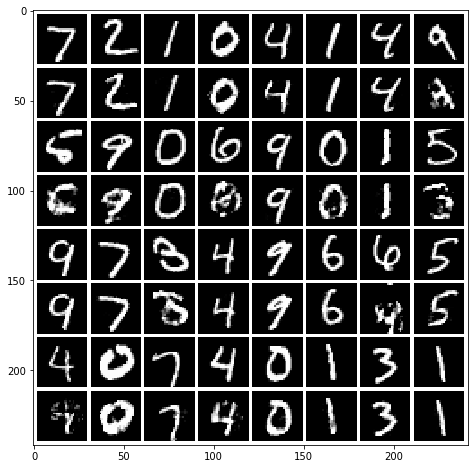

Signal error:
  MSE: 0.06356513259679501, std: 0.044578022459858604
  MAE: 0.09301188164240515, std: 0.05193706975123023
  SSIM: 0.5523983714579287, std: 0.25914144881642154
  Sharpness: 0.0970448348349441, std: 0.05594050443619096
  PhCo-MSE: 0.029981747621614326, std: 0.031750054305648825
  PhCo-MAE: 0.053457063458684756, std: 0.04144083420578272
  PhCo-SSIM: 0.764855216740005, std: 0.2089889705353479
  CroCo-MSE: 0.023947374586978987, std: 0.023381684768552367
  CroCo-MAE: 0.04694092689783552, std: 0.0332546223396998


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7941021563092081, std: 0.17542981622591278

Magnitude error:
  MSE Magnitude: 1.49422229509551, std: 1.481837048288984

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.06357 | 0.09301 | 0.5524 | 0.09704 | 0.02998 | 0.05346 | 0.7649 | 0.02395 | 0.04694 | 0.7941 | 1.494 |
Load latent opts with ts of 128 and gs of 512


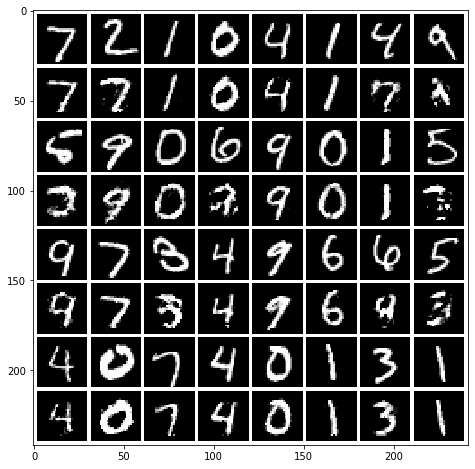

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


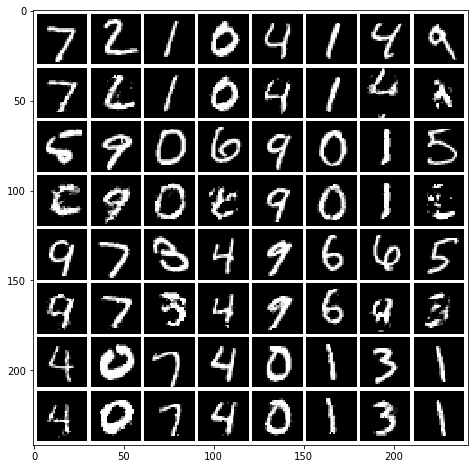

Signal error:
  MSE: 0.06476051719871956, std: 0.04234848932466689
  MAE: 0.09265890560701903, std: 0.04850742229549261
  SSIM: 0.5438437197404845, std: 0.24770792109520687
  Sharpness: 0.12052104108552295, std: 0.052425311539430045
  PhCo-MSE: 0.0437333644311026, std: 0.0360587642799665
  PhCo-MAE: 0.06904532549705955, std: 0.04331291743491825
  PhCo-SSIM: 0.6778187643021443, std: 0.20963188611049438
  CroCo-MSE: 0.034330123263775936, std: 0.024326611434878194
  CroCo-MAE: 0.05900263202462887, std: 0.03207248812969292


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7214109157658313, std: 0.17082780300329561

Magnitude error:
  MSE Magnitude: 3.8392394502823497, std: 2.9145633192437663

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.06476 | 0.09266 | 0.5438 | 0.1205 | 0.04373 | 0.06905 | 0.6778 | 0.03433 | 0.05900 | 0.7214 | 3.839 |
Load latent opts with ts of 128 and gs of 1024


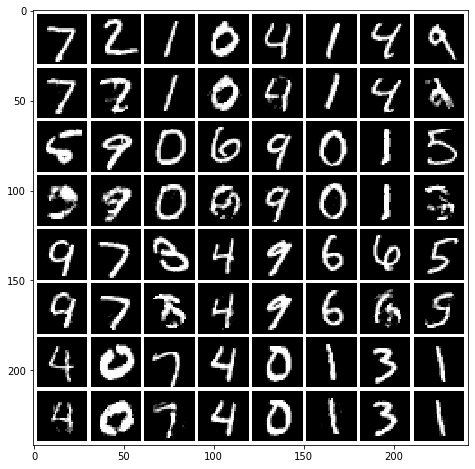

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


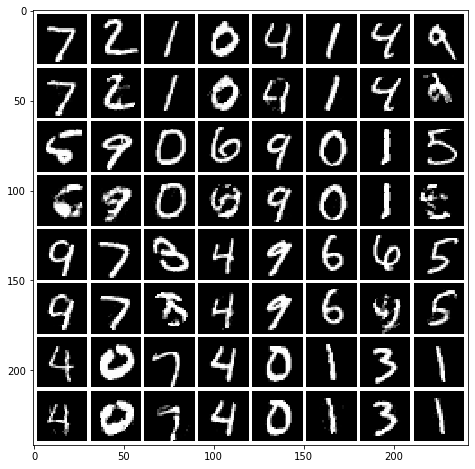

Signal error:
  MSE: 0.05910979449762625, std: 0.04372901407062938
  MAE: 0.08747184918274095, std: 0.050802728790864185
  SSIM: 0.5801161989154351, std: 0.25949828587386853
  Sharpness: 0.09656793648254719, std: 0.05351689241018765
  PhCo-MSE: 0.0287874236160264, std: 0.03041998426931329
  PhCo-MAE: 0.05168397476905512, std: 0.039214903138910455
  PhCo-SSIM: 0.7739131757812222, std: 0.19795750626809286
  CroCo-MSE: 0.023347410090000596, std: 0.02209863288462401
  CroCo-MAE: 0.04579452180467538, std: 0.031253873448460964


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7992990641439022, std: 0.1680880472046692

Magnitude error:
  MSE Magnitude: 1.6316529891678717, std: 1.5591098809125823

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05911 | 0.08747 | 0.5801 | 0.09657 | 0.02879 | 0.05168 | 0.7739 | 0.02335 | 0.04579 | 0.7993 | 1.632 |
Load latent opts with ts of 128 and gs of 2048


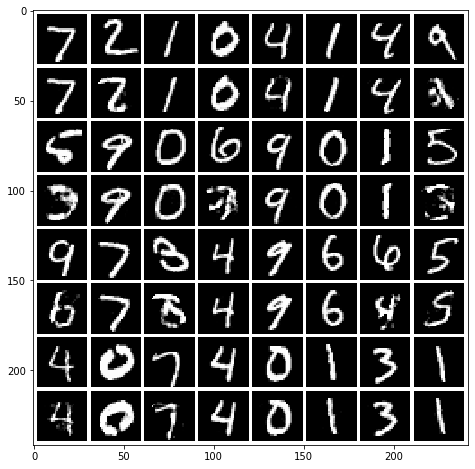

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


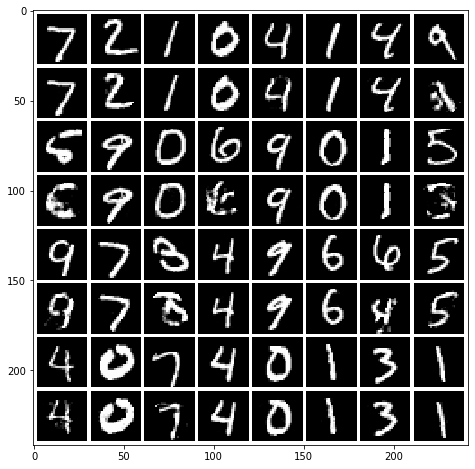

Signal error:
  MSE: 0.056747442352759137, std: 0.04358900050319249
  MAE: 0.08493132225850092, std: 0.05234732091409587
  SSIM: 0.5933324915194405, std: 0.2695828755644683
  Sharpness: 0.08226301375802306, std: 0.05819000265365837
  PhCo-MSE: 0.023722079511998416, std: 0.030134759098788943
  PhCo-MAE: 0.04435639719954753, std: 0.04099822780067133
  PhCo-SSIM: 0.8103241739582279, std: 0.20354747355378425
  CroCo-MSE: 0.019134946969513986, std: 0.022502595674175178
  CroCo-MAE: 0.03940642526408512, std: 0.0335031907050871


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8328616080989125, std: 0.1740469303501583

Magnitude error:
  MSE Magnitude: 0.9830886396911529, std: 1.13820083319825

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05675 | 0.08493 | 0.5933 | 0.08226 | 0.02372 | 0.04436 | 0.8103 | 0.01913 | 0.03941 | 0.8329 | 0.9831 |
Load latent opts with ts of 256 and gs of 512


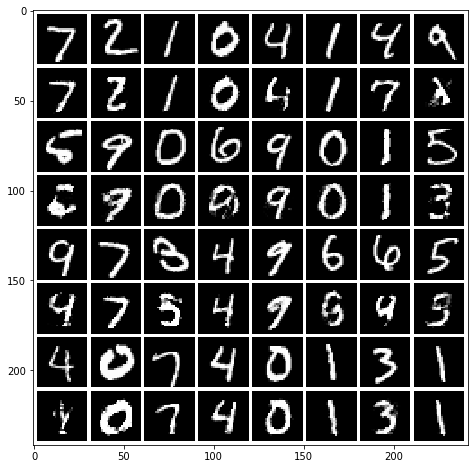

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


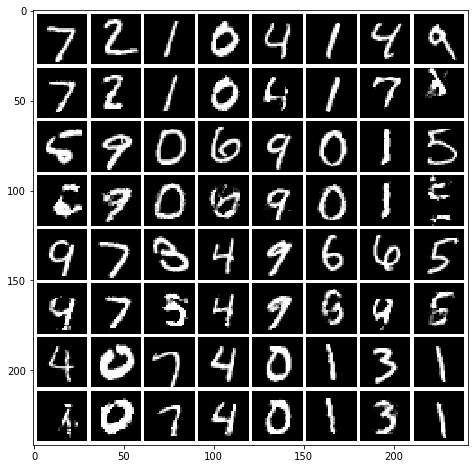

Signal error:
  MSE: 0.06154888242470519, std: 0.039494937873114595
  MAE: 0.08880534903164423, std: 0.04562873458266696
  SSIM: 0.5610948430386312, std: 0.23500897342056173
  Sharpness: 0.12119485580172051, std: 0.0506397469145967
  PhCo-MSE: 0.045088079824679814, std: 0.03629315761858951
  PhCo-MAE: 0.07016488493783282, std: 0.04275979117696847
  PhCo-SSIM: 0.6714202042000706, std: 0.2038505494894275
  CroCo-MSE: 0.03516478032270086, std: 0.024153488938303318
  CroCo-MAE: 0.05955823608722945, std: 0.03132392030050139


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7167759850111175, std: 0.16520255565492967

Magnitude error:
  MSE Magnitude: 4.156406361568102, std: 2.9660885361214877

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.06155 | 0.08881 | 0.5611 | 0.1212 | 0.04509 | 0.07016 | 0.6714 | 0.03516 | 0.05956 | 0.7168 | 4.156 |
Load latent opts with ts of 256 and gs of 1024


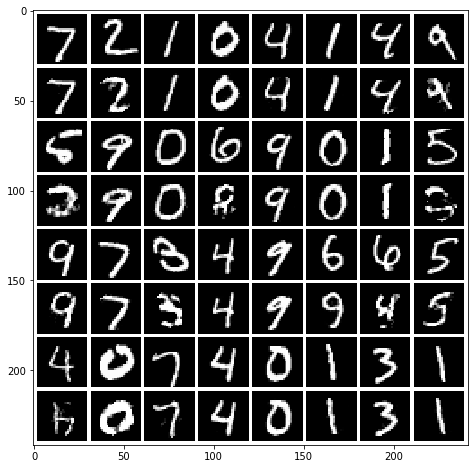

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


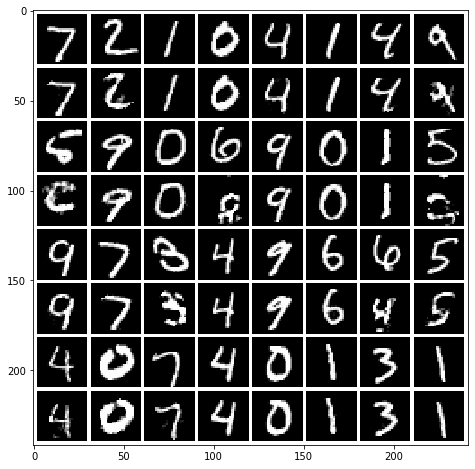

Signal error:
  MSE: 0.053551391591822727, std: 0.04079483351254868
  MAE: 0.08105345454017662, std: 0.04829277507367944
  SSIM: 0.6124168825310863, std: 0.2523865986353081
  Sharpness: 0.09066041646874942, std: 0.05254487829177729
  PhCo-MSE: 0.026075013200111796, std: 0.029884711938656848
  PhCo-MAE: 0.04784426561371442, std: 0.03862798238478359
  PhCo-SSIM: 0.7950651933726997, std: 0.19193531947300188
  CroCo-MSE: 0.020797092801451998, std: 0.0208002356567882
  CroCo-MAE: 0.04213969500858858, std: 0.02987765957057162


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8195133096569023, std: 0.15971453624770116

Magnitude error:
  MSE Magnitude: 1.5185719180447381, std: 1.5626132761722287

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05355 | 0.08105 | 0.6124 | 0.09066 | 0.02608 | 0.04784 | 0.7951 | 0.02080 | 0.04214 | 0.8195 | 1.519 |
Load latent opts with ts of 256 and gs of 2048


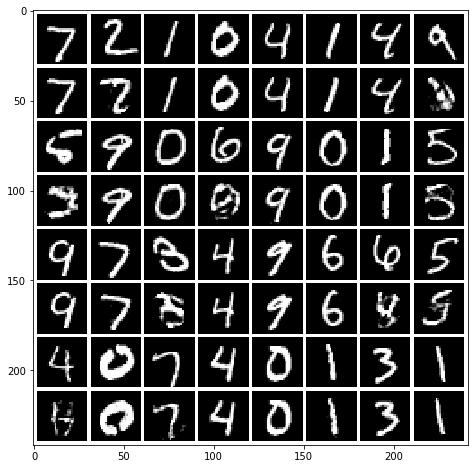

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


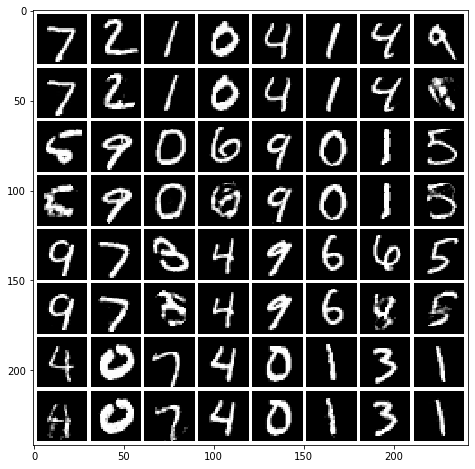

Signal error:
  MSE: 0.051083461535297386, std: 0.041627766449444735
  MAE: 0.07794165248163074, std: 0.05119763044389745
  SSIM: 0.6304360554982917, std: 0.2599086721819387
  Sharpness: 0.06865257465912873, std: 0.0570526161421396
  PhCo-MSE: 0.01818372165896126, std: 0.026592030008878328
  PhCo-MAE: 0.03588716199333324, std: 0.03778803859725646
  PhCo-SSIM: 0.8524886829176281, std: 0.18796156922761872
  CroCo-MSE: 0.014986478640834962, std: 0.020427105973975384
  CroCo-MAE: 0.032435612546022036, std: 0.03187664038701402
  CroCo-SSIM: 0.8682903687944015, std: 0.16143546095319164

Magnitude error:
  MSE Magnitude: 0.7287086038269909, std: 0.9889934906323912

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05108 | 0.07794 | 0.6304 | 0.06865 | 0.01818 | 0.03589 | 0.8525 | 0.01499 | 0.03244 | 0.8683 | 0.7287 |
Load latent opts with ts of 512 and gs of 512


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


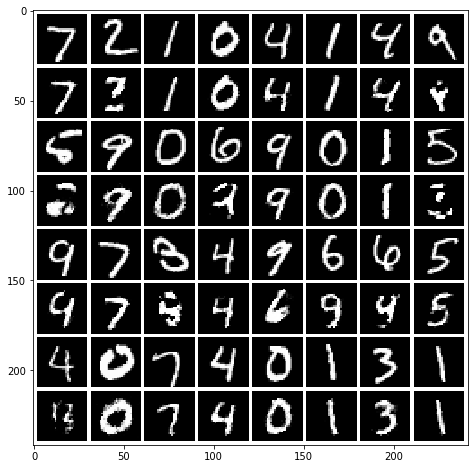

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


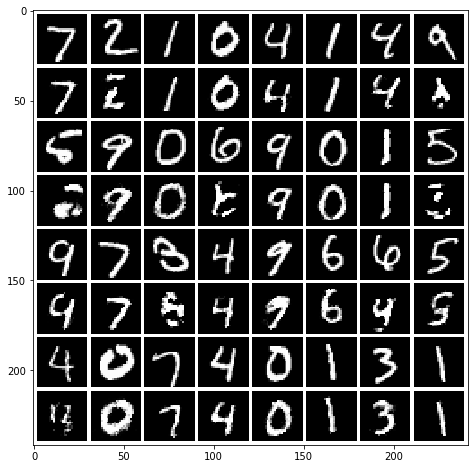

Signal error:
  MSE: 0.06213456698648451, std: 0.039382616882601446
  MAE: 0.08902502180968513, std: 0.045439370738906415
  SSIM: 0.558545043735219, std: 0.2354104167223523
  Sharpness: 0.12412602498461608, std: 0.04999847345675605
  PhCo-MSE: 0.04797394576616662, std: 0.0385531168366143
  PhCo-MAE: 0.07310390837841685, std: 0.044653531157919195
  PhCo-SSIM: 0.6550435758279782, std: 0.2055391301907846
  CroCo-MSE: 0.037054916254157313, std: 0.02486082552531842
  CroCo-MAE: 0.06151977974061042, std: 0.0314831370057682


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7032106614679607, std: 0.16727383271950136

Magnitude error:
  MSE Magnitude: 4.667825731887685, std: 3.300280018776972

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.06213 | 0.08903 | 0.5585 | 0.1241 | 0.04797 | 0.07310 | 0.6550 | 0.03705 | 0.06152 | 0.7032 | 4.668 |
Load latent opts with ts of 512 and gs of 1024


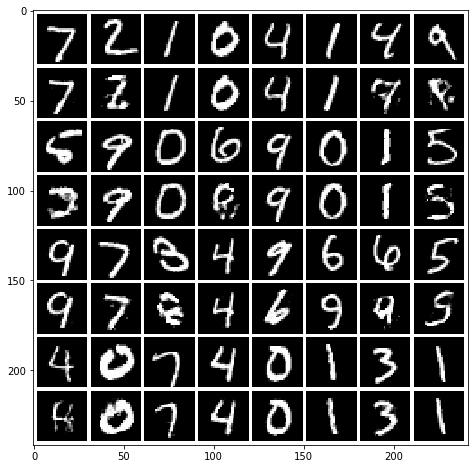

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


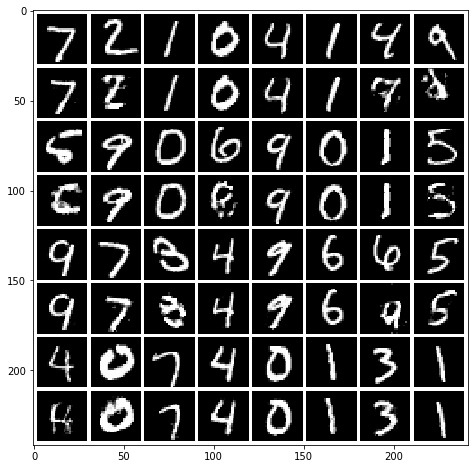

Signal error:
  MSE: 0.05103299724996874, std: 0.03839071937150064
  MAE: 0.07805785698623394, std: 0.04558451856190424
  SSIM: 0.6269972780158517, std: 0.23914187433950915
  Sharpness: 0.09597583812118057, std: 0.050924671798870294
  PhCo-MSE: 0.02929696657645588, std: 0.03134870396289963
  PhCo-MAE: 0.05180519337746793, std: 0.03939376360374169
  PhCo-SSIM: 0.7739959025708526, std: 0.19501813402469695
  CroCo-MSE: 0.023252576242315543, std: 0.021310429459328706
  CroCo-MAE: 0.045360401775283735, std: 0.02977212693432565


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8032104933191302, std: 0.15723820015394147

Magnitude error:
  MSE Magnitude: 1.8668955506312308, std: 1.7921322291207933

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05103 | 0.07806 | 0.6270 | 0.09598 | 0.02930 | 0.05181 | 0.7740 | 0.02325 | 0.04536 | 0.8032 | 1.867 |
Load latent opts with ts of 512 and gs of 2048


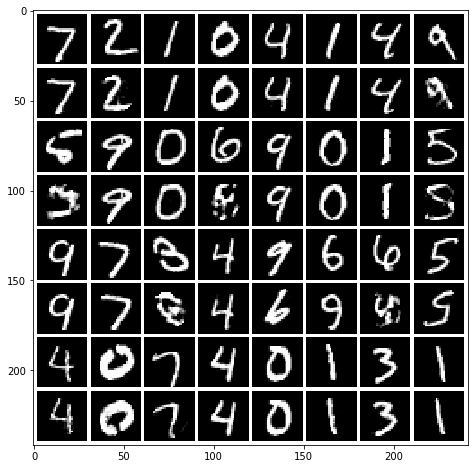

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


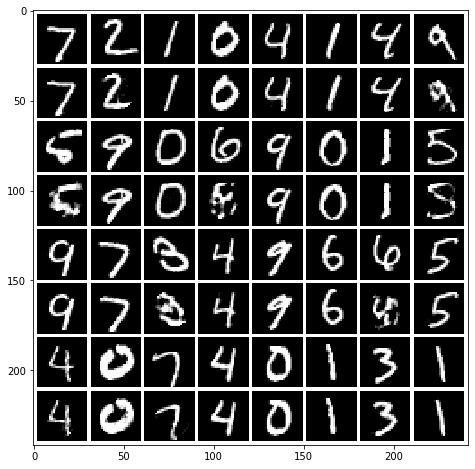

Signal error:
  MSE: 0.04717734581910724, std: 0.04015163420137401
  MAE: 0.07323414241190129, std: 0.04933068410696987
  SSIM: 0.655468329027078, std: 0.2516676589499244
  Sharpness: 0.06695996755951306, std: 0.05407324729082432
  PhCo-MSE: 0.017071878256061566, std: 0.025997519529831436
  PhCo-MAE: 0.03429720054624874, std: 0.03625075655983742
  PhCo-SSIM: 0.8605465761898464, std: 0.17909083657670535
  CroCo-MSE: 0.014117121367716838, std: 0.01919282436217908
  CroCo-MAE: 0.03119721361345308, std: 0.029869642068771685


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.87453961301774, std: 0.1534113552462566

Magnitude error:
  MSE Magnitude: 0.7752417795377055, std: 1.0775327578194256

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04718 | 0.07323 | 0.6555 | 0.06696 | 0.01707 | 0.03430 | 0.8605 | 0.01412 | 0.03120 | 0.8745 | 0.7752 |
Load latent opts with ts of 1000 and gs of 512


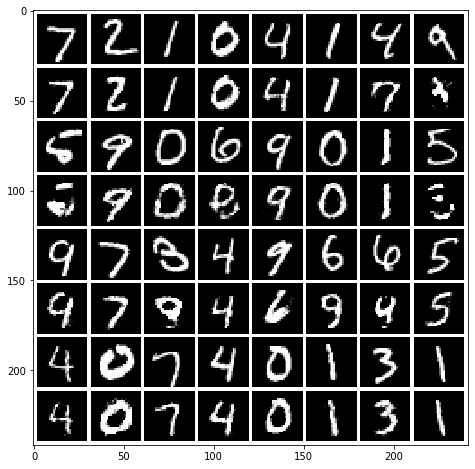

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


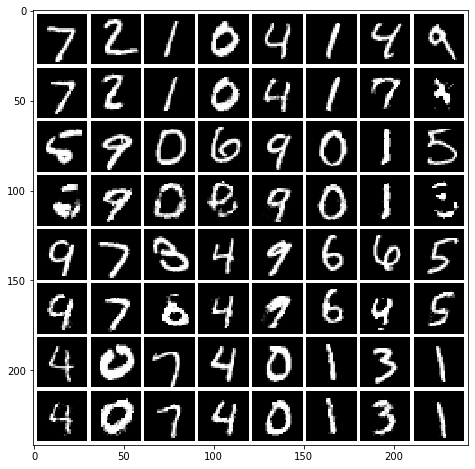

Signal error:
  MSE: 0.055511406606247704, std: 0.03665419567125459
  MAE: 0.082143154005979, std: 0.042415880127567376
  SSIM: 0.5969629760059897, std: 0.22353280300677453
  Sharpness: 0.11634489342426602, std: 0.04846769716698942
  PhCo-MSE: 0.041144844062900726, std: 0.03325021084581172
  PhCo-MAE: 0.06558554560927894, std: 0.03930639778402907
  PhCo-SSIM: 0.6936438594079296, std: 0.19595315679601702
  CroCo-MSE: 0.032374651353815086, std: 0.02288815087572065
  CroCo-MAE: 0.05618025205480955, std: 0.02953033888344224


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7363397199342054, std: 0.1594555724075033

Magnitude error:
  MSE Magnitude: 3.977877455406018, std: 2.8989473042339804

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.05551 | 0.08214 | 0.5970 | 0.1163 | 0.04114 | 0.06559 | 0.6936 | 0.03237 | 0.05618 | 0.7363 | 3.978 |
Load latent opts with ts of 1000 and gs of 1024


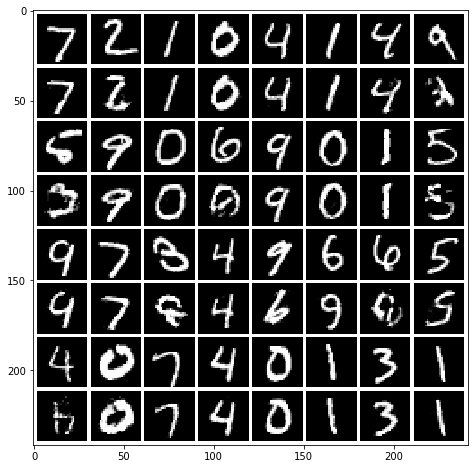

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


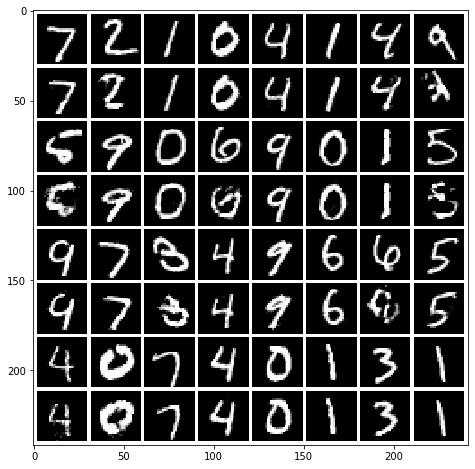

Signal error:
  MSE: 0.04625445163932988, std: 0.0364817573334934
  MAE: 0.07279640098870196, std: 0.04348052113031285
  SSIM: 0.6549281032723431, std: 0.23190920977573243
  Sharpness: 0.09163725485309038, std: 0.04924690476394795
  PhCo-MSE: 0.025344619444791803, std: 0.0280829939914038
  PhCo-MAE: 0.04730383382848369, std: 0.035825269116592735
  PhCo-SSIM: 0.7989689320336982, std: 0.17691216097000778
  CroCo-MSE: 0.020683422336014515, std: 0.01973455772719875
  CroCo-MAE: 0.04221506710370431, std: 0.027960856955449562


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8218032401028406, std: 0.14795043607049

Magnitude error:
  MSE Magnitude: 1.687802767220976, std: 1.636857517361142

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04625 | 0.07280 | 0.6549 | 0.09164 | 0.02534 | 0.04730 | 0.7990 | 0.02068 | 0.04222 | 0.8218 | 1.688 |
Load latent opts with ts of 1000 and gs of 2048


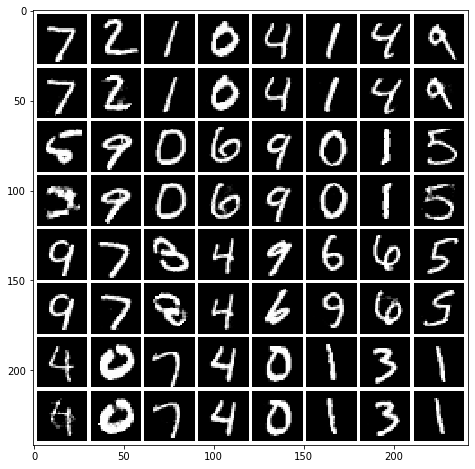

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


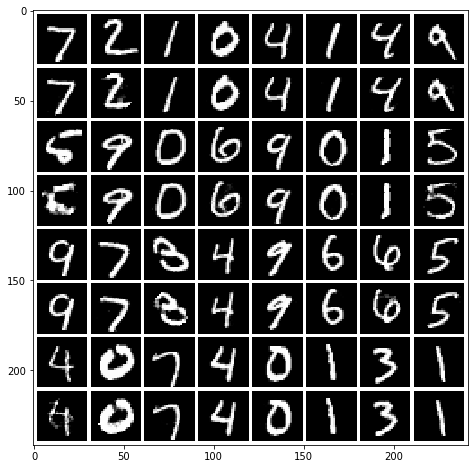

Signal error:
  MSE: 0.04140957780943057, std: 0.035475706254139476
  MAE: 0.06668782762410973, std: 0.044185107096791326
  SSIM: 0.68906228259608, std: 0.2310736923206997
  Sharpness: 0.06452882002947434, std: 0.05151201550889283
  PhCo-MSE: 0.01503727980522428, std: 0.023177385894553145
  PhCo-MAE: 0.03174715880403149, std: 0.032809423559262016
  PhCo-SSIM: 0.8748021000514496, std: 0.1637960289857938
  CroCo-MSE: 0.012608001928651998, std: 0.017476353999744704
  CroCo-MAE: 0.02913333663648013, std: 0.027502421731854423


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8870862570549265, std: 0.14141147076256275

Magnitude error:
  MSE Magnitude: 0.7804270556869242, std: 1.0525084307662242

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04141 | 0.06669 | 0.6891 | 0.06453 | 0.01504 | 0.03175 | 0.8748 | 0.01261 | 0.02913 | 0.8871 | 0.7804 |
Load latent opts with ts of 2000 and gs of 512


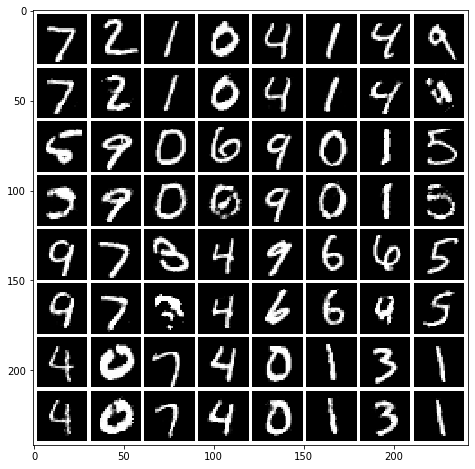

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


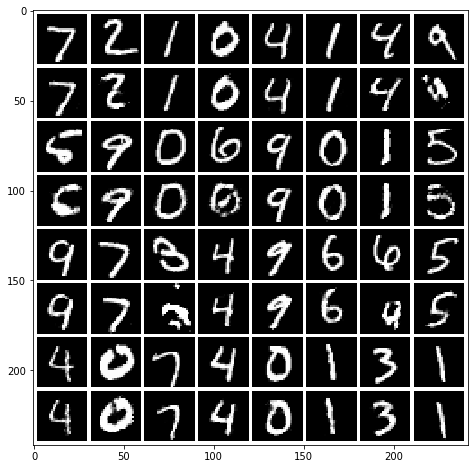

Signal error:
  MSE: 0.04520708620144143, std: 0.03504404729444174
  MAE: 0.07139923980729995, std: 0.04167891987328604
  SSIM: 0.6639449374561943, std: 0.22057938238237712
  Sharpness: 0.0983199190734873, std: 0.04732878083488902
  PhCo-MSE: 0.028317079379338576, std: 0.028907629237062943
  PhCo-MAE: 0.0510841459849913, std: 0.03589502296163981
  PhCo-SSIM: 0.7803274935099085, std: 0.17692462795280298
  CroCo-MSE: 0.02285212701387048, std: 0.01980133347291178
  CroCo-MAE: 0.0451826963848352, std: 0.027254022566459608


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8056818344742465, std: 0.14640723905515002

Magnitude error:
  MSE Magnitude: 2.2909650752967043, std: 1.9404059800014224

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04521 | 0.07140 | 0.6639 | 0.09832 | 0.02832 | 0.05108 | 0.7803 | 0.02285 | 0.04518 | 0.8057 | 2.291 |
Load latent opts with ts of 2000 and gs of 1024


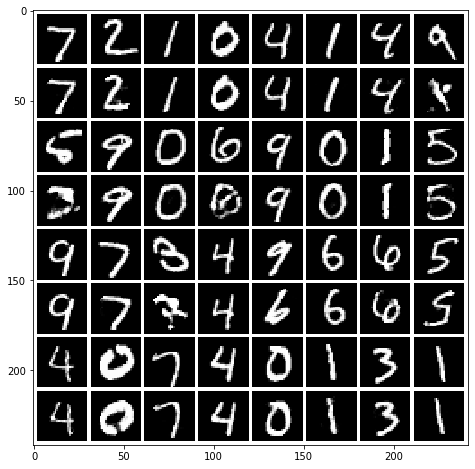

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


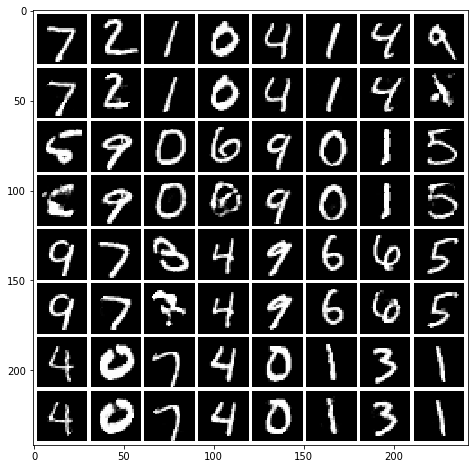

Signal error:
  MSE: 0.03985074218560869, std: 0.0339955800426379
  MAE: 0.06488663835047871, std: 0.04183324853723462
  SSIM: 0.7005083890270529, std: 0.2202898454588834
  Sharpness: 0.07067740217939336, std: 0.04780942033994285
  PhCo-MSE: 0.01618740960624832, std: 0.023308590344813192
  PhCo-MAE: 0.034215157970371786, std: 0.03162148767124955
  PhCo-SSIM: 0.866877534834632, std: 0.15621689233932226
  CroCo-MSE: 0.013356392971597136, std: 0.016661046145728102
  CroCo-MAE: 0.031127325352861716, std: 0.025301827873795354


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8809180714445146, std: 0.13015954229225002

Magnitude error:
  MSE Magnitude: 1.0452356040427526, std: 1.2774649181649809

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03985 | 0.06489 | 0.7005 | 0.07068 | 0.01619 | 0.03422 | 0.8669 | 0.01336 | 0.03113 | 0.8809 | 1.045 |
Load latent opts with ts of 2000 and gs of 2048


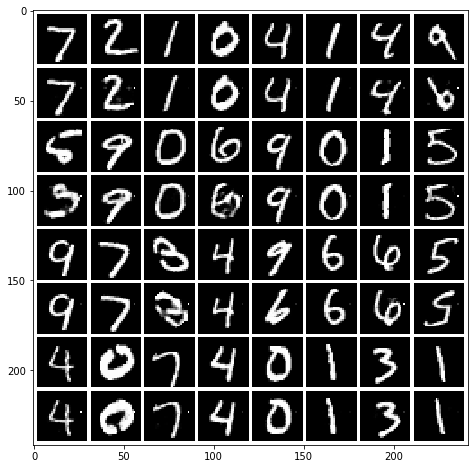

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


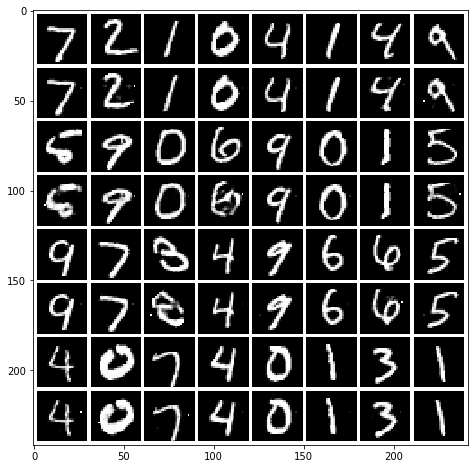

Signal error:
  MSE: 0.03800751282998724, std: 0.0346220425003583
  MAE: 0.0625490267876136, std: 0.04383190870394413
  SSIM: 0.7089191390247518, std: 0.22726754679731936
  Sharpness: 0.05665497854288576, std: 0.04559727022012538
  PhCo-MSE: 0.011130936447720228, std: 0.01991382267134597
  PhCo-MAE: 0.026289527578561567, std: 0.028970486179074644
  PhCo-SSIM: 0.895525992789467, std: 0.14581203424382602
  CroCo-MSE: 0.009394095847471976, std: 0.014599687222100107
  CroCo-MAE: 0.024341121118230086, std: 0.02391518056832315


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.9043835359933665, std: 0.12422081700170888

Magnitude error:
  MSE Magnitude: 0.6532878048613882, std: 0.8326584523411691

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03801 | 0.06255 | 0.7089 | 0.05665 | 0.01113 | 0.02629 | 0.8955 | 0.009394 | 0.02434 | 0.9044 | 0.6533 |
Load latent opts with ts of 5000 and gs of 512


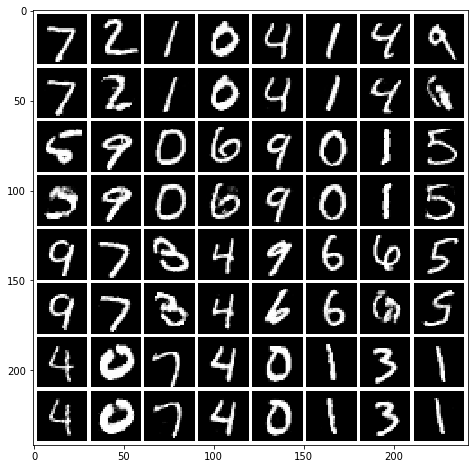

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


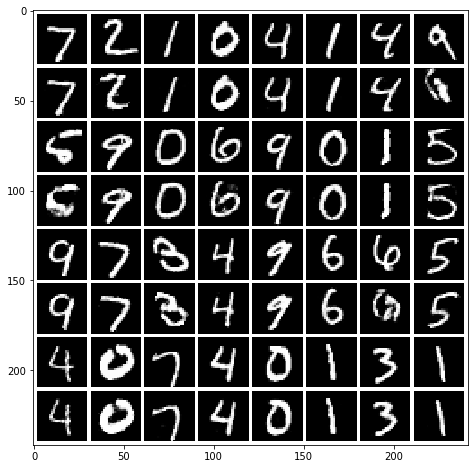

Signal error:
  MSE: 0.03642799729445408, std: 0.032326860992157834
  MAE: 0.0612906389221876, std: 0.04012768421514637
  SSIM: 0.7233620723962668, std: 0.21176859666602046
  Sharpness: 0.07134569408245464, std: 0.04382921070411726
  PhCo-MSE: 0.015005101269527886, std: 0.021213103077256563
  PhCo-MAE: 0.03350198608097894, std: 0.028893278046692814
  PhCo-SSIM: 0.8755354353820264, std: 0.14480023746969092
  CroCo-MSE: 0.012547962414401315, std: 0.015036859799985793
  CroCo-MAE: 0.030803724334949226, std: 0.023224345236359266


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8880792253920209, std: 0.11990359524493238

Magnitude error:
  MSE Magnitude: 1.021074706567795, std: 1.0687331280687165

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03643 | 0.06129 | 0.7234 | 0.07135 | 0.01501 | 0.03350 | 0.8755 | 0.01255 | 0.03080 | 0.8881 | 1.021 |
Load latent opts with ts of 5000 and gs of 1024


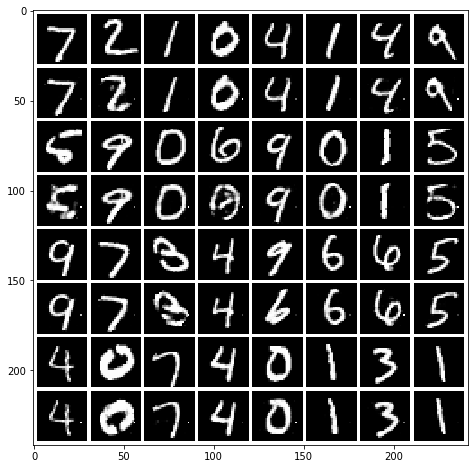

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


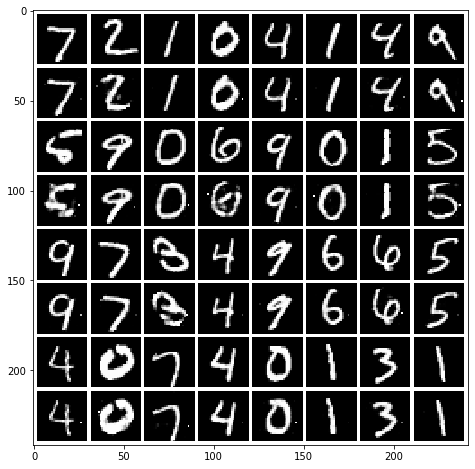

Signal error:
  MSE: 0.034577079829154284, std: 0.03359896166105244
  MAE: 0.05849807158883877, std: 0.042603728010948465
  SSIM: 0.7318014423685957, std: 0.21948799665053567
  Sharpness: 0.058564294117640844, std: 0.04118873322594603
  PhCo-MSE: 0.010263670465552828, std: 0.017390945267154612
  PhCo-MAE: 0.02583104034903754, std: 0.025365764488120782
  PhCo-SSIM: 0.8996213311213671, std: 0.13187668104976283
  CroCo-MSE: 0.008658647315709436, std: 0.012508065535117019
  CroCo-MAE: 0.024071279324272058, std: 0.020942624235934598


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.9083563819119856, std: 0.11073129252128373

Magnitude error:
  MSE Magnitude: 0.7089999256411135, std: 0.7704828303873587

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03458 | 0.05850 | 0.7318 | 0.05856 | 0.01026 | 0.02583 | 0.8996 | 0.008659 | 0.02407 | 0.9084 | 0.7090 |
Load latent opts with ts of 5000 and gs of 2048


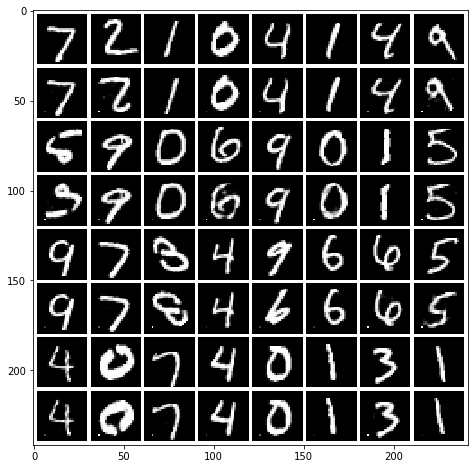

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


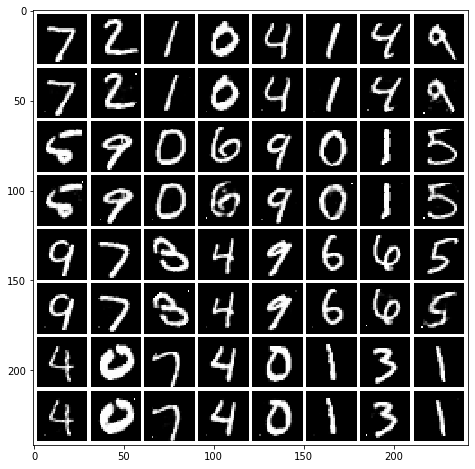

Signal error:
  MSE: 0.03330442691576587, std: 0.0330273395544861
  MAE: 0.05653284545640694, std: 0.04266978772939875
  SSIM: 0.7395395562469769, std: 0.2199633342554922
  Sharpness: 0.04550318886384997, std: 0.03741294833300042
  PhCo-MSE: 0.006810385041251766, std: 0.01472847726928442
  PhCo-MAE: 0.01951389249717424, std: 0.02237087266054802
  PhCo-SSIM: 0.9296509552120131, std: 0.1115627794191603
  CroCo-MSE: 0.005747317325229213, std: 0.010377137449967122
  CroCo-MAE: 0.01834090484969484, std: 0.018502722609472687


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.9348533268625969, std: 0.09474883498258295

Magnitude error:
  MSE Magnitude: 0.43727272478199053, std: 0.49276624593617807

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03330 | 0.05653 | 0.7395 | 0.04550 | 0.006810 | 0.01951 | 0.9297 | 0.005747 | 0.01834 | 0.9349 | 0.4373 |
Load latent opts with ts of 10000 and gs of 512


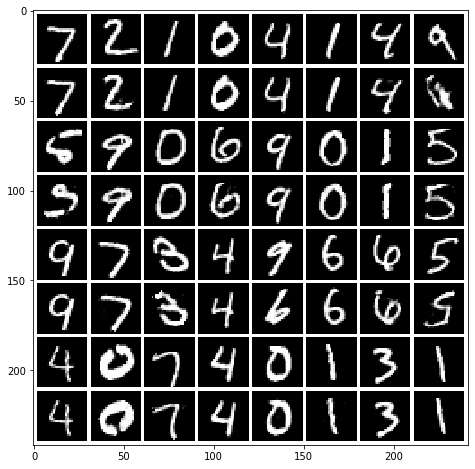

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


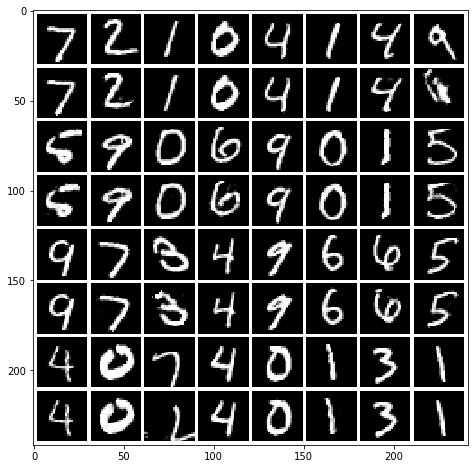

Signal error:
  MSE: 0.031487820186917766, std: 0.029989470160463726
  MAE: 0.05484952248872947, std: 0.038329130393226434
  SSIM: 0.7576846274353434, std: 0.20346153937722022
  Sharpness: 0.05794241519569418, std: 0.03980487113050011
  PhCo-MSE: 0.009603652023731028, std: 0.016494570270170282
  PhCo-MAE: 0.025323785258194627, std: 0.024006755712668196
  PhCo-SSIM: 0.9156833795288795, std: 0.1180329969305706
  CroCo-MSE: 0.00825537834805425, std: 0.011535857380927194
  CroCo-MAE: 0.02384017528966427, std: 0.019616971889590704


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.9233875919454377, std: 0.09860133019098928

Magnitude error:
  MSE Magnitude: 0.7075583672906273, std: 0.792436366150979

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03149 | 0.05485 | 0.7577 | 0.05794 | 0.009604 | 0.02532 | 0.9157 | 0.008255 | 0.02384 | 0.9234 | 0.7076 |
Load latent opts with ts of 10000 and gs of 1024


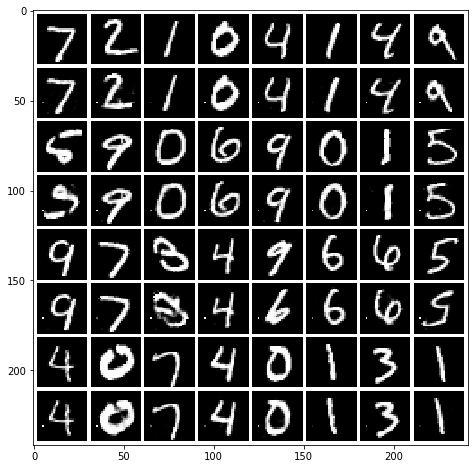

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


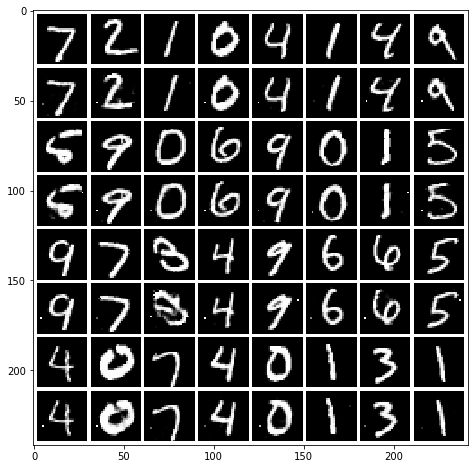

Signal error:
  MSE: 0.03121141140313781, std: 0.03058959134207211
  MAE: 0.054701634546542366, std: 0.03968041742902196
  SSIM: 0.7411444751429491, std: 0.20314782039584162
  Sharpness: 0.05222039762464411, std: 0.03624525783756521
  PhCo-MSE: 0.007608496969275184, std: 0.01417824979034964
  PhCo-MAE: 0.021779467540170502, std: 0.021445556865730863
  PhCo-SSIM: 0.9120777800743558, std: 0.11048657798393825
  CroCo-MSE: 0.0067547673550215955, std: 0.01066964241173634
  CroCo-MAE: 0.020834203019020066, std: 0.01835943950523574


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.9170528250337007, std: 0.09391835935915385

Magnitude error:
  MSE Magnitude: 0.5932623064700859, std: 0.562368540495379

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03121 | 0.05470 | 0.7411 | 0.05222 | 0.007608 | 0.02178 | 0.9121 | 0.006755 | 0.02083 | 0.9171 | 0.5933 |
Load latent opts with ts of 10000 and gs of 2048


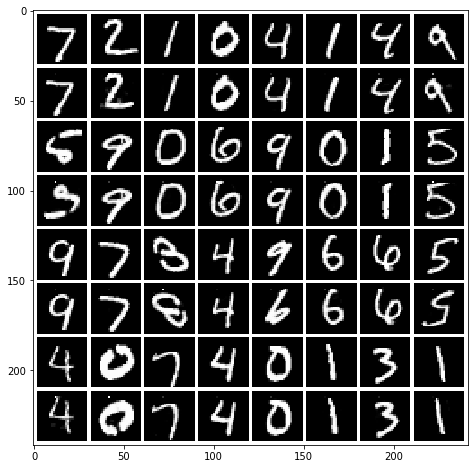

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


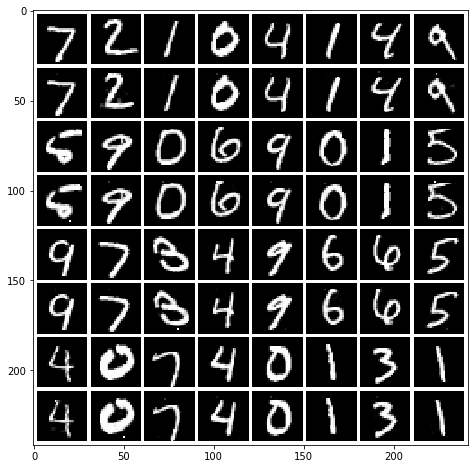

Signal error:
  MSE: 0.03018003388017422, std: 0.03181841417426247
  MAE: 0.05199325969590242, std: 0.04162602195002652
  SSIM: 0.7703618566057171, std: 0.21036355518506353
  Sharpness: 0.03874654885401342, std: 0.03401074477784811
  PhCo-MSE: 0.004967172768404128, std: 0.012319701222061188
  PhCo-MAE: 0.01605952228683324, std: 0.019452263422940735
  PhCo-SSIM: 0.9528769393246923, std: 0.09165926387376024
  CroCo-MSE: 0.004339903275676229, std: 0.0086798559484657
  CroCo-MAE: 0.015328088173521688, std: 0.01624279561309702


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.956679406326701, std: 0.07786290637814496

Magnitude error:
  MSE Magnitude: 0.3136849253836189, std: 0.403866664194329

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03018 | 0.05199 | 0.7704 | 0.03875 | 0.004967 | 0.01606 | 0.9529 | 0.004340 | 0.01533 | 0.9567 | 0.3137 |
Load latent opts with ts of 30000 and gs of 512


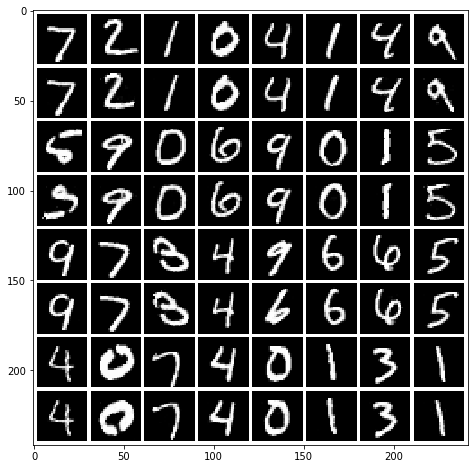

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


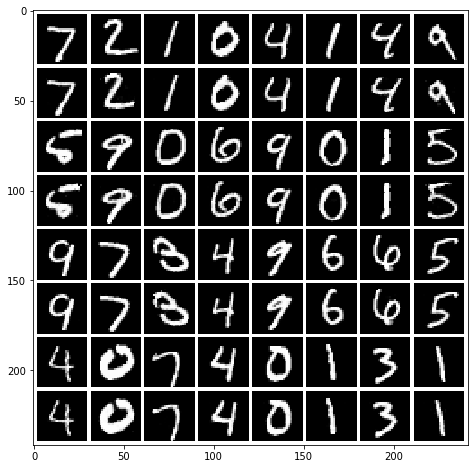

Signal error:
  MSE: 0.027057511567420558, std: 0.03052699692127701
  MAE: 0.0478844586268546, std: 0.039478082673734496
  SSIM: 0.7936775957832511, std: 0.2043768671971912
  Sharpness: 0.04295215296065094, std: 0.03339738376866046
  PhCo-MSE: 0.005392824532833283, std: 0.01253959221992753
  PhCo-MAE: 0.01762023129336624, std: 0.019144164825134726
  PhCo-SSIM: 0.9502075484643284, std: 0.09401151110630104
  CroCo-MSE: 0.004664318737847271, std: 0.00869117416041453
  CroCo-MAE: 0.016810434525412785, std: 0.01575668438656929


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.9543806362613756, std: 0.07922493683559993

Magnitude error:
  MSE Magnitude: 0.3536934783192199, std: 0.4461758341658017

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02706 | 0.04788 | 0.7937 | 0.04295 | 0.005393 | 0.01762 | 0.9502 | 0.004664 | 0.01681 | 0.9544 | 0.3537 |
Load latent opts with ts of 30000 and gs of 1024


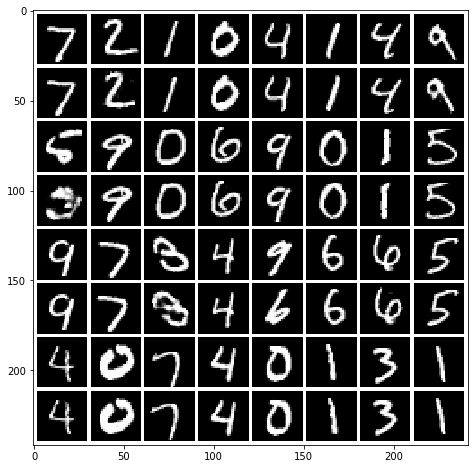

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


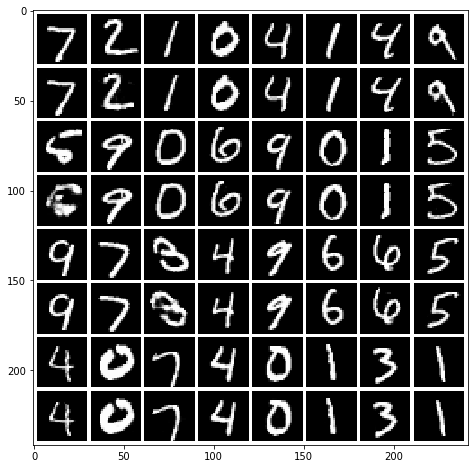

Signal error:
  MSE: 0.02544004368538028, std: 0.0295887125677428
  MAE: 0.04450140804397989, std: 0.04044854519511748
  SSIM: 0.8073500309072944, std: 0.20076502144635708
  Sharpness: 0.028036023905044664, std: 0.030424446369221238
  PhCo-MSE: 0.003459820099692902, std: 0.010109389333430153
  PhCo-MAE: 0.011895994486908158, std: 0.016818687800190076
  PhCo-SSIM: 0.9683498798148105, std: 0.08172682258862711
  CroCo-MSE: 0.002930799707771211, std: 0.0077330500619695215
  CroCo-MAE: 0.011301423520559448, std: 0.014697507405778413


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.9715681135248442, std: 0.07008539373218597

Magnitude error:
  MSE Magnitude: 0.16018811464554616, std: 0.3069306418142958

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02544 | 0.04450 | 0.8074 | 0.02804 | 0.003460 | 0.01190 | 0.9683 | 0.002931 | 0.01130 | 0.9716 | 0.1602 |
Load latent opts with ts of 30000 and gs of 2048


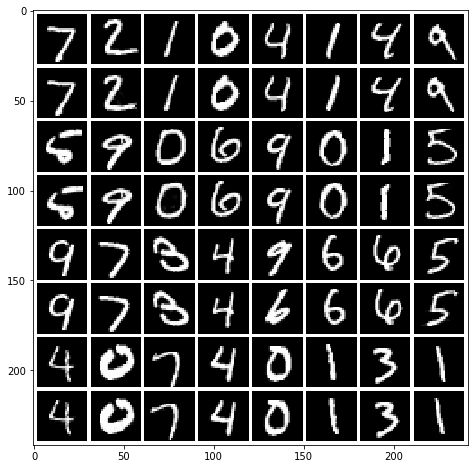

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


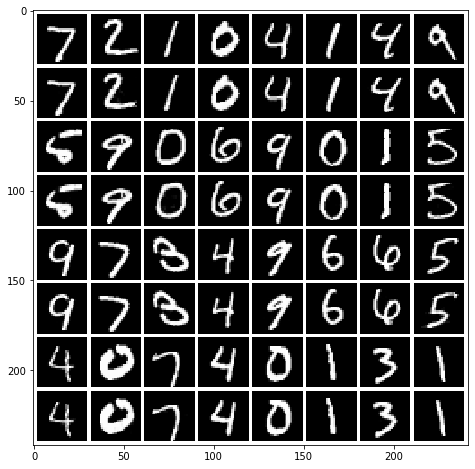

Signal error:
  MSE: 0.024399227391562094, std: 0.02950359043499765
  MAE: 0.041904433447069164, std: 0.041033243739690306
  SSIM: 0.8168733543232831, std: 0.19891858713931473
  Sharpness: 0.019589498290569475, std: 0.027153881791094136
  PhCo-MSE: 0.002323812943907738, std: 0.009039683437186032
  PhCo-MAE: 0.008372580808299415, std: 0.01518767814924122
  PhCo-SSIM: 0.9788625546320314, std: 0.07278841339525192
  CroCo-MSE: 0.001991462702011155, std: 0.00716426556767997
  CroCo-MAE: 0.008012108110046354, std: 0.013508445010024038


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.9809115902955468, std: 0.06265143232892408

Magnitude error:
  MSE Magnitude: 0.08724423222002334, std: 0.22492367244084405

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02440 | 0.04190 | 0.8169 | 0.01959 | 0.002324 | 0.008373 | 0.9789 | 0.001991 | 0.008012 | 0.9809 | 0.08724 |
Load latent opts with ts of 60000 and gs of 512


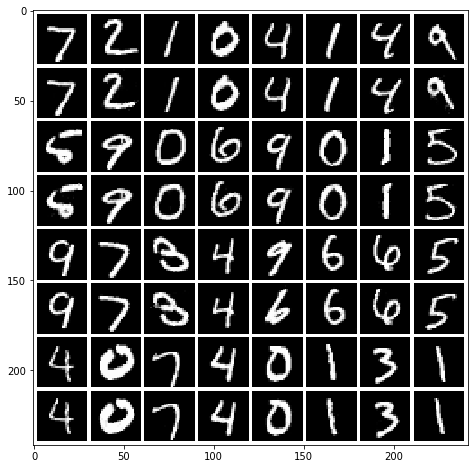

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


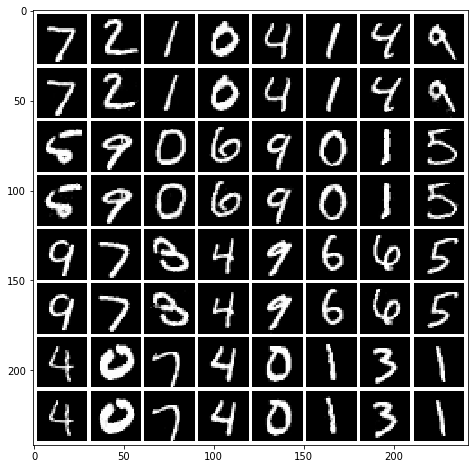

Signal error:
  MSE: 0.025050519945801264, std: 0.02877150678317371
  MAE: 0.04561352470151472, std: 0.03807799041183881
  SSIM: 0.8082726954653272, std: 0.19354673126216954
  Sharpness: 0.040971410725045995, std: 0.029925329293932646
  PhCo-MSE: 0.004294102606832414, std: 0.008979181903852504
  PhCo-MAE: 0.0161690172534366, std: 0.015175027665732078
  PhCo-SSIM: 0.9591825283906527, std: 0.07436977057390584
  CroCo-MSE: 0.0038782542788724835, std: 0.0070638004797704745
  CroCo-MAE: 0.01570982195307488, std: 0.013573105805202658
  CroCo-SSIM: 0.9616746478886242, std: 0.06509388175312263

Magnitude error:
  MSE Magnitude: 0.3184367877081617, std: 0.3824669075991071

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02505 | 0.04561 | 0.8083 | 0.04097 | 0.004294 | 0.01617 | 0.9592 | 0.003878 | 0.01571 | 0.9617 | 0.3184 |
Load latent opts with ts of 60000 and gs of 1024


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


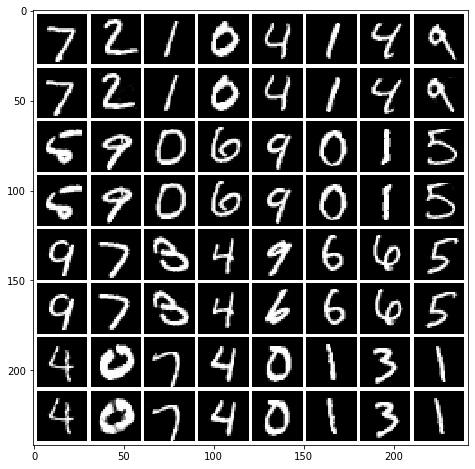

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


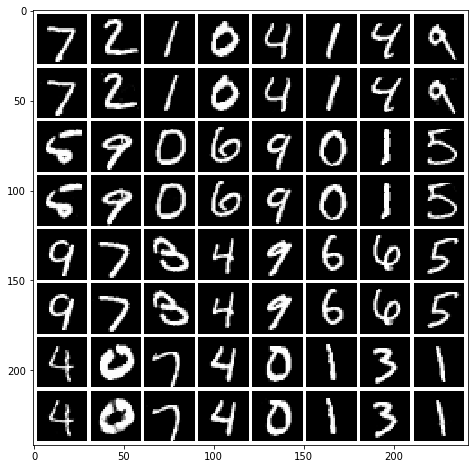

Signal error:
  MSE: 0.024814956309032972, std: 0.02850749195661669
  MAE: 0.043446446893300156, std: 0.039413973320835065
  SSIM: 0.8123208172646721, std: 0.195381936798443
  Sharpness: 0.02379242644158539, std: 0.026111022993719195
  PhCo-MSE: 0.002290656313740827, std: 0.006662980969901598
  PhCo-MAE: 0.009585857316634161, std: 0.012766009447349706
  PhCo-SSIM: 0.9774879538414786, std: 0.06317542330679073
  CroCo-MSE: 0.002010985110351574, std: 0.005612579221424668
  CroCo-MAE: 0.009235701914274887, std: 0.01172628570064991


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.9799749834185608, std: 0.05354597681586289

Magnitude error:
  MSE Magnitude: 0.11702904776358883, std: 0.21356157698931866

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02481 | 0.04345 | 0.8123 | 0.02379 | 0.002291 | 0.009586 | 0.9775 | 0.002011 | 0.009236 | 0.9800 | 0.1170 |
Load latent opts with ts of 60000 and gs of 2048


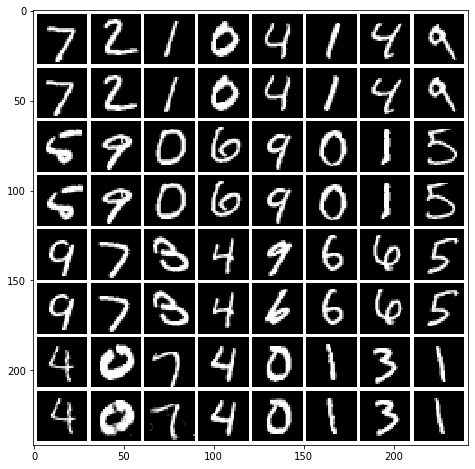

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


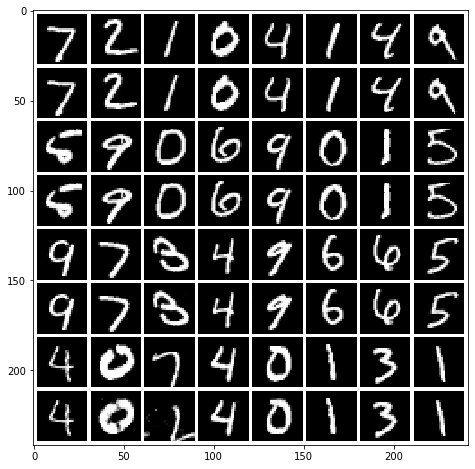

Signal error:
  MSE: 0.022851103858000224, std: 0.028796817433844525
  MAE: 0.039439696278830046, std: 0.040654535510936333
  SSIM: 0.828131816568411, std: 0.1981271478085282
  Sharpness: 0.01616881986142157, std: 0.021273236481688353
  PhCo-MSE: 0.001437325371985325, std: 0.005881404635162612
  PhCo-MAE: 0.006592009225750096, std: 0.01087683586795793
  PhCo-SSIM: 0.986506918070146, std: 0.049466726600426995
  CroCo-MSE: 0.0012688659750547187, std: 0.004790744435276726
  CroCo-MAE: 0.006408437047483621, std: 0.009950492458737905
  CroCo-SSIM: 0.9870889532688287, std: 0.047711498797921234

Magnitude error:
  MSE Magnitude: 0.06148588377582706, std: 0.1423772811933064

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02285 | 0.03944 | 0.8281 | 0.01617 | 0.001437 | 0.006592 | 0.9865 | 0.001269 | 0.006408 | 0.9871 | 0.06149 |


In [12]:
### LOAD MODEL ####

train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
gen_sizes = [512, 1024, 2048]

for ts in train_sizes:
    for gs, ds in zip(gen_sizes, disc_sizes):
        print("Load latent opts with ts of", ts, "and gs of", gs)
        
        name = "FCGenerator{}MNIST_{}_10000latentSteps".format(gs, ts)
        
        out_original = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_MNIST/cgan_original_4_1024.p", "rb"))
        out_results = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_MNIST/" + name + ".sd", "rb"))
        
        # Print predictions #
        to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                            out_results[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/mnist/" + name + '.png')
        
        print("Registered:")
        results_reg = register_croco(out_results[:32], test_original[:32])
        to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                            results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/mnist/" + name + '.png')
        
        # Benchmark test predictions #
        benchmark(pred=out_results[:1024], true=out_original[:1024], check_all=True)

## Final Evaluation (1024 samples)

| ts | gs | MSE | MAE | SSIM | SHRP | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magn |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 32 | 512 | 0.07647 | 0.1060 | 0.4599 | 0.1349 | 0.05814 | 0.08583 | 0.5850 | 0.04381 | 0.07065 | 0.6445 | 5.489 |
| 32 | 1024 | 0.07532 | 0.1055 | 0.4653 | 0.1296 | 0.05464 | 0.08250 | 0.6058 | 0.04163 | 0.06866 | 0.6605 | 4.853 |
| 32 | 2048 | 0.07471 | 0.1051 | 0.4680 | 0.1267 | 0.05243 | 0.08015 | 0.6186 | 0.03994 | 0.06689 | 0.6716 | 4.349 |
| 64 | 512 | 0.07030 | 0.09871 | 0.5086 | 0.1262 | 0.04858 | 0.07458 | 0.6439 | 0.03816 | 0.06343 | 0.6916 | 4.304 |
| 64 | 1024 | 0.06559 | 0.09501 | 0.5389 | 0.1053 | 0.03437 | 0.05885 | 0.7375 | 0.02715 | 0.05105 | 0.7706 | 2.061 |
| 64 | 2048 | 0.06357 | 0.09301 | 0.5524 | 0.09704 | 0.02998 | 0.05346 | 0.7649 | 0.02395 | 0.04694 | 0.7941 | 1.494 |
| 128 | 512 | 0.06476 | 0.09266 | 0.5438 | 0.1205 | 0.04373 | 0.06905 | 0.6778 | 0.03433 | 0.05900 | 0.7214 | 3.839 |
| 128 | 1024 | 0.05911 | 0.08747 | 0.5801 | 0.09657 | 0.02879 | 0.05168 | 0.7739 | 0.02335 | 0.04579 | 0.7993 | 1.632 |
| 128 | 2048 | 0.05675 | 0.08493 | 0.5933 | 0.08226 | 0.02372 | 0.04436 | 0.8103 | 0.01913 | 0.03941 | 0.8329 | 0.9831 |
| 256 | 512 | 0.06155 | 0.08881 | 0.5611 | 0.1212 | 0.04509 | 0.07016 | 0.6714 | 0.03516 | 0.05956 | 0.7168 | 4.156 |
| 256 | 1024 | 0.05355 | 0.08105 | 0.6124 | 0.09066 | 0.02608 | 0.04784 | 0.7951 | 0.02080 | 0.04214 | 0.8195 | 1.519 |
| 256 | 2048 | 0.05108 | 0.07794 | 0.6304 | 0.06865 | 0.01818 | 0.03589 | 0.8525 | 0.01499 | 0.03244 | 0.8683 | 0.7287 |
| 512 | 512 | 0.06213 | 0.08903 | 0.5585 | 0.1241 | 0.04797 | 0.07310 | 0.6550 | 0.03705 | 0.06152 | 0.7032 | 4.668 |
| 512 | 1024 | 0.05103 | 0.07806 | 0.6270 | 0.09598 | 0.02930 | 0.05181 | 0.7740 | 0.02325 | 0.04536 | 0.8032 | 1.867 |
| 512 | 2048 | 0.04718 | 0.07323 | 0.6555 | 0.06696 | 0.01707 | 0.03430 | 0.8605 | 0.01412 | 0.03120 | 0.8745 | 0.7752 |
| 1000 | 512 | 0.05551 | 0.08214 | 0.5970 | 0.1163 | 0.04114 | 0.06559 | 0.6936 | 0.03237 | 0.05618 | 0.7363 | 3.978 |
| 1000 | 1024 | 0.04625 | 0.07280 | 0.6549 | 0.09164 | 0.02534 | 0.04730 | 0.7990 | 0.02068 | 0.04222 | 0.8218 | 1.688 |
| 1000 | 2048 | 0.04141 | 0.06669 | 0.6891 | 0.06453 | 0.01504 | 0.03175 | 0.8748 | 0.01261 | 0.02913 | 0.8871 | 0.7804 |
| 2000 | 512 | 0.04521 | 0.07140 | 0.6639 | 0.09832 | 0.02832 | 0.05108 | 0.7803 | 0.02285 | 0.04518 | 0.8057 | 2.291 |
| 2000 | 1024 | 0.03985 | 0.06489 | 0.7005 | 0.07068 | 0.01619 | 0.03422 | 0.8669 | 0.01336 | 0.03113 | 0.8809 | 1.045 |
| 2000 | 2048 | 0.03801 | 0.06255 | 0.7089 | 0.05665 | 0.01113 | 0.02629 | 0.8955 | 0.009394 | 0.02434 | 0.9044 | 0.6533 |
| 5000 | 512 | 0.03643 | 0.06129 | 0.7234 | 0.07135 | 0.01501 | 0.03350 | 0.8755 | 0.01255 | 0.03080 | 0.8881 | 1.021 |
| 5000 | 1024 | 0.03458 | 0.05850 | 0.7318 | 0.05856 | 0.01026 | 0.02583 | 0.8996 | 0.008659 | 0.02407 | 0.9084 | 0.7090 |
| 5000 | 2048 | 0.03330 | 0.05653 | 0.7395 | 0.04550 | 0.006810 | 0.01951 | 0.9297 | 0.005747 | 0.01834 | 0.9349 | 0.4373 |
| 10000 | 512 | 0.03149 | 0.05485 | 0.7577 | 0.05794 | 0.009604 | 0.02532 | 0.9157 | 0.008255 | 0.02384 | 0.9234 | 0.7076 |
| 10000 | 1024 | 0.03121 | 0.05470 | 0.7411 | 0.05222 | 0.007608 | 0.02178 | 0.9121 | 0.006755 | 0.02083 | 0.9171 | 0.5933 |
| 10000 | 2048 | 0.03018 | 0.05199 | 0.7704 | 0.03875 | 0.004967 | 0.01606 | 0.9529 | 0.004340 | 0.01533 | 0.9567 | 0.3137 | 
| 30000 | 512 | 0.02706 | 0.04788 | 0.7937 | 0.04295 | 0.005393 | 0.01762 | 0.9502 | 0.004664 | 0.01681 | 0.9544 | 0.3537 |
| 30000 | 1024 | 0.02544 | 0.04450 | 0.8074 | 0.02804 | 0.003460 | 0.01190 | 0.9683 | 0.002931 | 0.01130 | 0.9716 | 0.1602 |
| 30000 | 2048 | 0.02440 | 0.04190 | 0.8169 | 0.01959 | 0.002324 | 0.008373 | 0.9789 | 0.001991 | 0.008012 | 0.9809 | 0.08724 |
| 60000 | 512 | 0.02505 | 0.04561 | 0.8083 | 0.04097 | 0.004294 | 0.01617 | 0.9592 | 0.003878 | 0.01571 | 0.9617 | 0.3184 |
| 60000 | 1024 | 0.02481 | 0.04345 | 0.8123 | 0.02379 | 0.002291 | 0.009586 | 0.9775 | 0.002011 | 0.009236 | 0.9800 | 0.1170 |
| 60000 | 2048 | 0.02285 | 0.03944 | 0.8281 | 0.01617 | 0.001437 | 0.006592 | 0.9865 | 0.001269 | 0.006408 | 0.9871 | 0.06149 |

In [13]:
train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
epochs = [1000, 500, 300, 150, 75, 50, 50, 50, 50, 50, 50]
prcgan_512 = [0.05059, 0.04754, 0.04435, 0.04336, 0.04430, 0.04075, 0.03663, 0.03219, 0.02936, 0.02529, 0.02278]
prcgan_1024 = [0.05040, 0.04429, 0.04100, 0.03789, 0.03712, 0.03624, 0.03253, 0.03042, 0.02790, 0.02273, 0.02086]
prcgan_2048 = [0.05017, 0.04356, 0.04017, 0.03666, 0.03432, 0.03341, 0.03108, 0.02783, 0.02542, 0.02041, 0.01901]

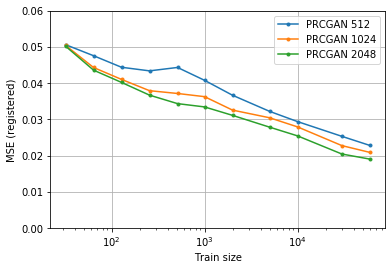

In [23]:
axes = plt.gca()
axes.set_xlabel("Train size")
axes.set_xscale('log')
axes.set_ylabel("MSE (registered)")
axes.set_ylim([0, 0.06])
plt.title("")
plt.plot(train_sizes, prcgan_512, marker='.', label="PRCGAN 512", color='C0')
plt.plot(train_sizes, prcgan_1024, marker='.', label="PRCGAN 1024", color='C1')
plt.plot(train_sizes, prcgan_2048, marker='.', label="PRCGAN 2048", color='C2')
plt.legend()
plt.grid()
plt.savefig("../out/plots/MNIST_PRCGAN_sizes.png", dpi=200)
plt.show()

In [15]:
train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
epochs = [1000, 500, 300, 150, 75, 50, 50, 50, 50, 50, 50]
prcganstar_512 = [0.04381, 0.03816, 0.03433, 0.03516, 0.03705, 0.03237, 0.02285, 0.01255, 0.008255, 0.004664, 0.003878]
prcganstar_1024 = [0.04163, 0.02715, 0.02335, 0.02080, 0.02325, 0.02068, 0.01336, 0.008659, 0.006755, 0.002931, 0.002011]
prcganstar_2048 = [0.03994, 0.02395, 0.01913, 0.01499, 0.01412, 0.01261, 0.009394, 0.005747, 0.004340, 0.001991, 0.001269]

In [19]:
steps = [t * e // 32 for t, e in zip(train_sizes, epochs)]

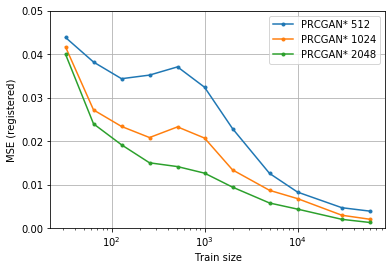

In [21]:
axes = plt.gca()
axes.set_xlabel("Train size")
axes.set_xscale('log')
axes.set_ylabel("MSE (registered)")
axes.set_ylim([0, 0.05])
plt.title("")
plt.plot(train_sizes, prcganstar_512, marker='.', label="PRCGAN* 512", color='C0')
plt.plot(train_sizes, prcganstar_1024, marker='.', label="PRCGAN* 1024", color='C1')
plt.plot(train_sizes, prcganstar_2048, marker='.', label="PRCGAN* 2048", color='C2')
plt.legend()
plt.grid()
plt.savefig("../out/plots/MNIST_PRCGANstar_sizes.png", dpi=200)
plt.show()